# Disaster at St. Himark an analysis of Radiation Data

### Author: Andrew J. Otis

In [1]:
# Data Wrangling
import pandas as pd  # also used in transforming date entries
import numpy as np

# Visualizations
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from PIL import Image
from plotly.subplots import make_subplots
import matplotlib.cm as cm

# Data Transformation
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler


# Performing Calculations/Statistical Analysis
from collections import Counter
from scipy.stats import bartlett
import math
from scipy.stats import shapiro, anderson
from scipy.stats import levene
from scipy.stats import ttest_ind
import scipy.stats as stats
from scipy.stats import f_oneway
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import statsmodels.api as sm
from statsmodels.stats.multicomp import MultiComparison

# Machine Learning Related
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

# Model Performance Metrics
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_auc_score, roc_curve, plot_roc_curve

# Model Tuning
from sklearn.model_selection import GridSearchCV, learning_curve, cross_val_predict

# Code Optimization
from sklearn.pipeline import Pipeline


In [2]:
#%% Change directory to use relative file paths
import os

# Change the working directory to a new directory to utilize relative file
#  paths
os.chdir('C:/Users/andio/OneDrive/Desktop/PythonProjectsDU/COMP4449_Capstone/DataScienceCapstone-master/DataScienceCapstone-master/7_FinalProjects/DisasterStHimarkCitizenScienceRescue/data/data/')

# Get the current working directory
cwd = os.getcwd()
print("Current working directory:", cwd)


Current working directory: C:\Users\andio\OneDrive\Desktop\PythonProjectsDU\COMP4449_Capstone\DataScienceCapstone-master\DataScienceCapstone-master\7_FinalProjects\DisasterStHimarkCitizenScienceRescue\data\data


## Load the Sensor Data

In [3]:
# Load in the mobile sensor data
mobile_sensor_data = pd.read_csv("MobileSensorReadings.csv")
print("----Mobile Sensor Data----")
print(mobile_sensor_data.head())
print("Dimensions:", mobile_sensor_data.shape)
print()

# Load in stationary sensor location data
stationary_sensor_location = pd.read_csv("StaticSensorLocations.csv")
print("----Stationary Sensor Locations----")
print(stationary_sensor_location.head())
print("Dimensions:", stationary_sensor_location.shape)
print()

# Lad in the stationary sensor readings data
stationary_sensor_data = pd.read_csv("StaticSensorReadings.csv")
print("----Stationary Sensor Data----")
print(stationary_sensor_data.head())
print("Dimensions:", stationary_sensor_data.shape)


----Mobile Sensor Data----
             Timestamp  Sensor-id       Long      Lat  Value Units  \
0  2020-04-06 00:00:00         15 -119.83035  0.14007    0.0   cpm   
1  2020-04-06 00:00:00         22 -119.76075  0.04205    0.0   cpm   
2  2020-04-06 00:00:00         40 -119.89067  0.11658    0.0   cpm   
3  2020-04-06 00:00:00          1 -119.96665  0.18792    0.0   cpm   
4  2020-04-06 00:00:00         27 -119.80570  0.01711    0.0   cpm   

             User-id  
0   CitizenScientist  
1                HSS  
2            MutantX  
3           MySensor  
4   CitizenScientist  
Dimensions: (3315711, 7)

----Stationary Sensor Locations----
   Sensor-id      Lat       Long
0         12  0.20764 -119.81556
1         15  0.16849 -119.79033
2         13  0.15979 -119.80715
3         11  0.04147 -119.82861
4          6  0.12180 -119.90430
Dimensions: (9, 3)

----Stationary Sensor Data----
       Timestamp  Sensor-id   Value Units
0  4/6/2020 0:00         15  11.926   cpm
1  4/6/2020 0:00   

### Combine the Sensor Data

In [4]:
# Merge stationary_sensor_data with stationary_sensor_location based on "Sensor-id"
modified_stationary_sensor_data = stationary_sensor_data.merge(stationary_sensor_location, on="Sensor-id", how="left")

# Add the prefix "s-" to each entry in the 'Sensor-id' column
modified_stationary_sensor_data['Sensor-id'] = modified_stationary_sensor_data['Sensor-id'].apply(lambda x: f"0{x}")

# Print the modified DataFrame
print("----Modified Stationary Sensor Data----")
print(modified_stationary_sensor_data.head())
print("Dimensions:", modified_stationary_sensor_data.shape)
print()


----Modified Stationary Sensor Data----
       Timestamp Sensor-id   Value Units      Lat       Long
0  4/6/2020 0:00       015  11.926   cpm  0.16849 -119.79033
1  4/6/2020 0:00        06  14.816   cpm  0.12180 -119.90430
2  4/6/2020 0:00        01  17.055   cpm  0.15689 -119.95940
3  4/6/2020 0:00       012  16.787   cpm  0.20764 -119.81556
4  4/6/2020 0:00       013  15.009   cpm  0.15979 -119.80715
Dimensions: (744000, 6)



In [5]:
# Combine mobile and modified stationary sensor data
print("----Combined Sensor Data----")
combined_data = pd.concat([mobile_sensor_data, modified_stationary_sensor_data], ignore_index=True)
# Drop the 'User-id' column
combined_data = combined_data.drop(columns=[' User-id'])
print(combined_data.head())
print("Dimensions:", combined_data.shape)


----Combined Sensor Data----
             Timestamp Sensor-id       Long      Lat  Value Units
0  2020-04-06 00:00:00        15 -119.83035  0.14007    0.0   cpm
1  2020-04-06 00:00:00        22 -119.76075  0.04205    0.0   cpm
2  2020-04-06 00:00:00        40 -119.89067  0.11658    0.0   cpm
3  2020-04-06 00:00:00         1 -119.96665  0.18792    0.0   cpm
4  2020-04-06 00:00:00        27 -119.80570  0.01711    0.0   cpm
Dimensions: (4059711, 6)


In [6]:
# Check if sensor-id 015 is present in the combined_data DataFrame
sensor_015_present = "015" in combined_data['Sensor-id'].values

# Print the result
if sensor_015_present:
    print("Sensor-id 015 is present in the combined_data DataFrame.")
else:
    print("Sensor-id 015 is not present in the combined_data DataFrame.")


Sensor-id 015 is present in the combined_data DataFrame.


## Exploratory Data Analysis

### Visual of Static Sensor Locations

Important Note(s) on Plotly: 
- Plotly creates the image in layers, so order in which the plot is built matters. For example, if the map was laid down last, it would cover all the markers and traces generated prior.


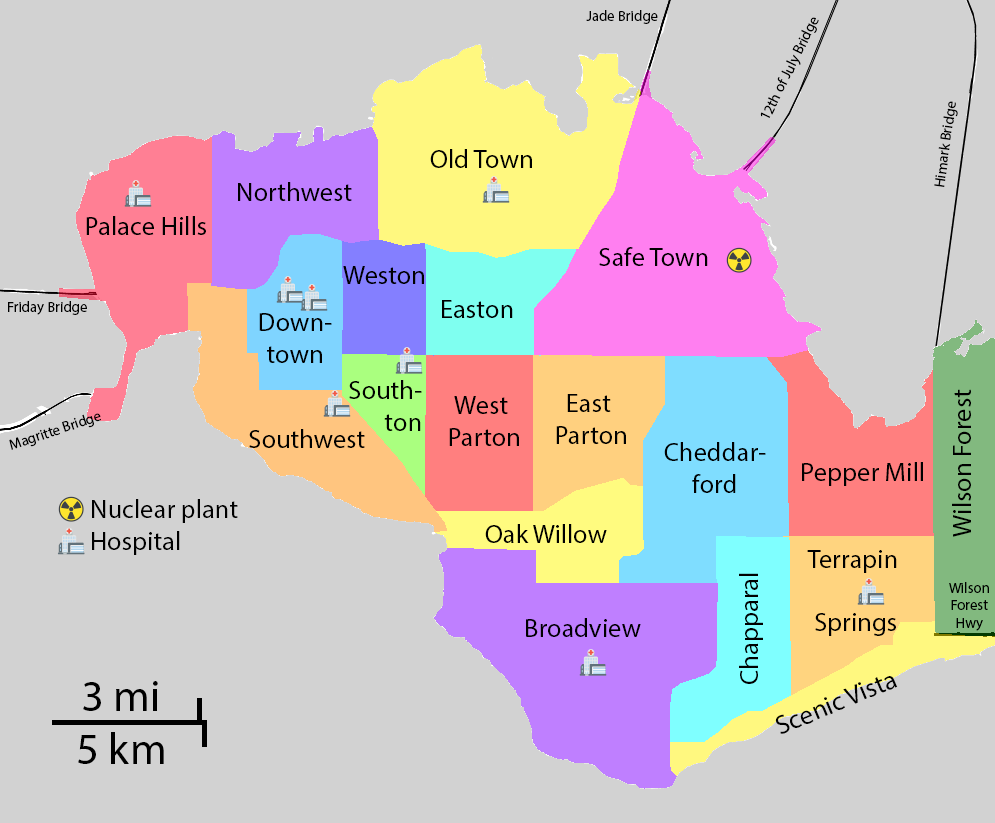

In [7]:
# Load the image
image_path = "StHimarkNeighborhoodMap.png"
image = Image.open(image_path)

# Get the size of the image
img_width, img_height = image.size

# Define the latitude and longitude coordinates of the corners
corner1 = (0.238585, -120.000000)
corner2 = (0.000000, -120.000000)
corner3 = (0.000000, -119.711751)
corner4 = (0.238585, -119.711751)

# Convert latitude and longitude to pixel coordinates
def lat_lon_to_pixel(lat, lon):
    x = (lon - (-120.000000)) / ((-119.711751) - (-120.000000)) * img_width
    y = (0.238585 - lat) / (0.238585 - 0) * img_height
    return x, y

# Convert the corners to pixel coordinates
x1, y1 = lat_lon_to_pixel(corner1[0], corner1[1])
x2, y2 = lat_lon_to_pixel(corner2[0], corner2[1])
x3, y3 = lat_lon_to_pixel(corner3[0], corner3[1])
x4, y4 = lat_lon_to_pixel(corner4[0], corner4[1])


# Convert latitude and longitude of sensors to pixel coordinates
stationary_sensor_location['x'], stationary_sensor_location['y'] = zip(*stationary_sensor_location.apply(lambda row: lat_lon_to_pixel(row['Lat'], row['Long']), axis=1))

# Create the figure
fig = px.imshow(image)

# Add the red lines on the image
fig.add_trace(go.Scatter(x=[x1, x2], y=[y1, y2], line=dict(color="red", width=2), showlegend=False))
fig.add_trace(go.Scatter(x=[x2, x3], y=[y2, y3], line=dict(color="red", width=2), showlegend=False))
fig.add_trace(go.Scatter(x=[x3, x4], y=[y3, y4], line=dict(color="red", width=2), showlegend=False))
fig.add_trace(go.Scatter(x=[x4, x1], y=[y4, y1], line=dict(color="red", width=2), showlegend=False))

# Create the hover text with both coordinates and static Sensor-id
hover_text = stationary_sensor_location.apply(lambda row: f"Sensor-id: {row['Sensor-id']}<br>Lat: {row['Lat']}<br>Long: {row['Long']}", axis=1)

# Add the static sensor locations as black dots with hover text
fig.add_trace(go.Scatter(x=stationary_sensor_location['x'], y=stationary_sensor_location['y'], 
                         mode='markers', marker=dict(symbol='star', color='black', size=10), 
                         text=hover_text, 
                         hoverinfo='text', showlegend=False))

# Update the layout to remove axis ticks and labels and set the default figure size
fig.update_layout(xaxis_showgrid=False, yaxis_showgrid=False, xaxis_zeroline=False, yaxis_zeroline=False,
                  xaxis_showticklabels=False, yaxis_showticklabels=False,
                  width=1000, height=800)

# Show the plot
fig.show()

#fig.write_image('static_sensor_locations.png')

### Transformations Necessary for Geographic Plotting 

#### Mobile Sensor Data 

In [8]:
'''Important Note: 

This cell takes a little bit to run, so run only once

The purpose of this code is to convert positional data (i.e. lat & lon) into pixels so that locational data is accurate
in reference to a map of St. Himark'''

# Apply the written conversion function "lat_lon_to_pixel()"
mobile_sensor_data['x'], mobile_sensor_data['y'] = zip(*mobile_sensor_data.apply(lambda row: lat_lon_to_pixel(row['Lat'], row['Long']), axis=1))

# Sort the data by time
mobile_sensor_data.sort_values(by = ['Timestamp'], inplace = True)


#### Static Sensor Data 

In [7]:
# Apply the written conversion function "lat_lon_to_pixel()"
#modified_stationary_sensor_data['x'], modified_stationary_sensor_data['y'] = zip(*modified_stationary_sensor_data.apply(lambda row: lat_lon_to_pixel(row['Lat'], row['Long']), axis=1))

# Sort the data by time
#modified_stationary_sensor_data.sort_values(by=['Timestamp'], inplace=True)


#### Combined Data

In [9]:
'''Important Note: This cell takes a little bit to run, so run only once
'''
# Apply the written conversion function "lat_lon_to_pixel()"
combined_data['x'], combined_data['y'] = zip(*combined_data.apply(lambda row: lat_lon_to_pixel(row['Lat'], row['Long']), axis=1))

# Sort the data by time
combined_data.sort_values(by=['Timestamp'], inplace=True)


### Clean Sensor Data (i.e. na's, missing, etc.)

In [9]:
# Check for missing and null values
def check_missing_values(df):
    # check for missing and null values in the dataframe
    missing_values = df.isnull().sum()
    null_values = df.isnull().sum()
    
    if missing_values.any():
        print("Missing values in DataFrame:")
        print(missing_values)
    else:
        print("No missing values in DataFrame.")
    
    if null_values.any():
        print("Null values in DataFrame:")
        print(null_values)
    else:
        print("No null values in DataFrame.")
    
    print()

# Check missing values for each dataframe
print("----Checking missing and null values in Mobile Sensor Data----")
check_missing_values(mobile_sensor_data)

print("----Checking missing and null values in Modified Stationary Sensor Data----")
check_missing_values(modified_stationary_sensor_data)

print("----Checking missing and null values in Combined Mobile-Stationary Sensor Data----")
check_missing_values(combined_data)

'''Everything appears to be good on this end, but it is good practice to check again after data transformation to check
for any un-expected values'''


----Checking missing and null values in Mobile Sensor Data----
No missing values in DataFrame.
No null values in DataFrame.

----Checking missing and null values in Modified Stationary Sensor Data----
No missing values in DataFrame.
No null values in DataFrame.

----Checking missing and null values in Combined Mobile-Stationary Sensor Data----
No missing values in DataFrame.
No null values in DataFrame.



'Everything appears to be good on this end, but it is good practice to check again after data transformation to check\nfor any un-expected values'

### Data Description

In [10]:
# Check for unique column names
print("----Mobile Sensor Data Column Names----")
print(mobile_sensor_data.columns)
print()

# Observations:
# notice the space at the start of ' User-id'

print("----Stationary Sensor Location Column Names----")
print(stationary_sensor_location.columns)
print()

print("----Modified Stationary Sensor Data Column Names----")
print(modified_stationary_sensor_data.columns)
print()

# Unique responses of the user id column in the mobile sensor dataframe
print("----Unique Mobile Sensor User id's----")
print(mobile_sensor_data[' User-id'].unique())
print()

# Get all unique mobile sensor ids
unique_mobile_sensor_ids = mobile_sensor_data['Sensor-id'].unique()
sorted_mobile_sensor_ids = np.sort(unique_mobile_sensor_ids)

print("----Unique Mobile Sensor id's----")
print(sorted_mobile_sensor_ids)
print()

# Get all unique static sensor ids
unique_modified_stationary_sensor_ids = modified_stationary_sensor_data['Sensor-id'].unique()
sorted_modified_stationary_sensor_ids = np.sort(unique_modified_stationary_sensor_ids)

print("----Unique Modified Static Sensor id's----")
print(sorted_modified_stationary_sensor_ids)
print()

print("Notice, that some sensor id's match between each type of sensor. "
     "Additionally, we technically only have 9 stationary sensors even though "
     "we have a static sensor 15. ")


----Mobile Sensor Data Column Names----
Index(['Timestamp', 'Sensor-id', 'Long', 'Lat', 'Value', 'Units', ' User-id',
       'x', 'y'],
      dtype='object')

----Stationary Sensor Location Column Names----
Index(['Sensor-id', 'Lat', 'Long', 'x', 'y'], dtype='object')

----Modified Stationary Sensor Data Column Names----
Index(['Timestamp', 'Sensor-id', 'Value', 'Units', 'Lat', 'Long'], dtype='object')

----Unique Mobile Sensor User id's----
[' CitizenScientist' ' ASWillhiem' ' UncleG' ' AS-2' ' ProfessorSievert'
 ' HiMarkHS' ' Ckimball' ' MySensor' ' AS-1' ' NeutronsAreFreeOfCharge'
 ' AlwaysGlowing' ' HSS' ' MutantX' ' PeterLovesCrystals54' ' Bob'
 ' XrayLady' ' RichardFox' ' AS-3' ' GermanWrinkler43' ' TaxiDriver'
 ' RadCurieous' ' TestUnit']

----Unique Mobile Sensor id's----
[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48
 49 50]

----Unique Modified Static Sensor id's----
['01' '011'

### Transformations Necessary for further Geographic Plotting and Model Construction

### Mobile Sensor Data

In [11]:
# Create a copy of the original data to act as a reference point for debugging
mobile_df = mobile_sensor_data.copy()

# Preview the mobile data
mobile_df.head()


,Timestamp,Sensor-id,Long,Lat,Value,Units,User-id,x,y
0,2020-04-06 00:00:00,15,-119.83035,0.14007,0.0,cpm,CitizenScientist,585.610878,339.827923
27,2020-04-06 00:00:00,4,-119.93185,0.18734,0.0,cpm,ASWillhiem,235.245395,176.769851
28,2020-04-06 00:00:00,34,-119.80541,0.08323,0.0,cpm,CitizenScientist,671.700682,535.897751
29,2020-04-06 00:00:00,45,-119.83122,0.06235,0.0,cpm,CitizenScientist,582.607745,607.923403
30,2020-04-06 00:00:00,47,-119.87530,0.17400,0.0,cpm,UncleG,430.449022,222.786240


In [12]:
print("Filtering on sensor and grouping by location")

# Due to a new row of data being generated every 5 seconds, there are a lot of cases where the sensors
#  remain in the same spot for multiple readings. Thus we will group by only the max radiation values 
#  at each location
# Group by "x" and "y" and get the maximum value for each group
mobile_df = mobile_df.groupby(["x", "y"]).max()

# Reset the index to alter the DataFrame. Otherwise, it would be a view of the transformation.
mobile_df.reset_index(inplace=True)

# Convert 'Timestamp' to datetime for visualization hover text
mobile_df['Timestamp'] = pd.to_datetime(mobile_df['Timestamp'])

# Create a new column for the log-scaled values
mobile_df['LogScaledValue'] = np.log10(mobile_df['Value'])

'''Scaling the data will be necessary to make changes in sensor readings more noticeable and model
construction'''

Filtering on sensor and grouping by location


C:\Users\andio\anaconda3\lib\site-packages\pandas\core\arraylike.py:397: RuntimeWarning:

divide by zero encountered in log10



'Scaling the data will be necessary to make changes in sensor readings more noticeable and model\nconstruction'

In [14]:
'''Accounting for the recent warning about inf values being generated (i.e. log_10 of 0 or very
large radiation reading by the sensor)'''
#Important Note(s):
# -If there exists a radiation value of 0 at any given time or place, log scaling will result in
#  nonsensical +inf & -inf values will be generated. These points are valid and should not be 
#  discarded, so simply set them equal to 0 after the transformation (i.e. log-scaling).

# Replace -inf and inf with 0 in the 'Value' column
mobile_df['LogScaledValue'] = mobile_df['LogScaledValue'].replace([-np.inf, np.inf], 0)
mobile_df.describe()


,x,y,Sensor-id,Long,Lat,Value,LogScaledValue
count,197052.000000,197052.000000,197052.000000,197052.000000,197052.000000,197052.000000,197052.000000
mean,523.793057,357.903135,25.060086,-119.848258,0.134830,32.394388,1.404268
std,184.131552,162.807059,14.230044,0.053342,0.047197,142.146108,0.266861
min,0.172594,0.734744,1.000000,-119.999950,0.017057,0.000000,-2.105046
25%,401.418739,244.794078,12.000000,-119.883710,0.110250,17.000000,1.230449
50%,513.760065,352.142654,24.000000,-119.851165,0.136500,29.000000,1.462398
75%,634.089034,442.693868,37.000000,-119.816306,0.167620,38.462055,1.585032
max,994.837762,764.161804,50.000000,-119.711798,0.238372,57345.200301,4.758497


In [15]:
# Check for null values in the mobile_df DataFrame
null_values = mobile_df.isnull().sum()

# Print the count of null values for each column
print("Null Values in mobile_df:")
print(null_values)

# Remove rows with null values from the mobile_df DataFrame
#mobile_df.dropna(inplace=True)


Null Values in mobile_df:
x                 0
y                 0
Timestamp         0
Sensor-id         0
Long              0
Lat               0
Value             0
Units             0
 User-id          0
LogScaledValue    0
dtype: int64


### Static Sensor Data

In [16]:
static_df = stationary_sensor_data.copy()
static_df.head()


,Timestamp,Sensor-id,Value,Units
0,4/6/2020 0:00,15,11.926,cpm
1,4/6/2020 0:00,6,14.816,cpm
2,4/6/2020 0:00,1,17.055,cpm
3,4/6/2020 0:00,12,16.787,cpm
4,4/6/2020 0:00,13,15.009,cpm


In [54]:
# Due to a new row of data being generated every 5 seconds, there are a lot of cases where the sensors
#  remain in the same spot for multiple readings. Thus we will group by only the max radiation values 
#  at each location
# Group by "x" and "y" and get the maximum value for each group
#static_df = static_df.groupby(["x", "y"]).max()

# Reset the index to alter the DataFrame. Otherwise, it would be a view of the transformation.
#static_df.reset_index(inplace=True)


In [17]:
# Convert the 'Timestamp' column to a datetime type if it's not already
static_df['Timestamp'] = pd.to_datetime(static_df['Timestamp'])

# Extract the date from the 'Timestamp' and create a new column for it
static_df['Date'] = static_df['Timestamp'].dt.date

# Create a new column for the log-scaled values
static_df['LogScaledValue'] = np.log10(static_df['Value'])


C:\Users\andio\anaconda3\lib\site-packages\pandas\core\arraylike.py:397: RuntimeWarning:

invalid value encountered in log10



In [18]:
# Replace -inf and inf with 0 in the 'Value' column
static_df['LogScaledValue'] = static_df['LogScaledValue'].replace([-np.inf, np.inf], 0)


In [19]:
# Check for null values in the static_df DataFrame
null_values = static_df.isnull().sum()

# Print the count of null values for each column
print("Null Values in static_df:")
print(null_values)


Null Values in static_df:
Timestamp         0
Sensor-id         0
Value             0
Units             0
Date              0
LogScaledValue    2
dtype: int64


In [20]:
# Remove rows with null values from the static_df DataFrame
static_df.dropna(inplace=True)

# Check for null values in the static_df DataFrame
null_values = static_df.isnull().sum()

# Print the count of null values for each column
print("Null Values in static_df:")
print(null_values)


Null Values in static_df:
Timestamp         0
Sensor-id         0
Value             0
Units             0
Date              0
LogScaledValue    0
dtype: int64


### Combined Sensor Data

In [21]:
combined_df = combined_data.copy()
combined_df.head()


,Timestamp,Sensor-id,Long,Lat,Value,Units
0,2020-04-06 00:00:00,15,-119.83035,0.14007,0.0,cpm
1,2020-04-06 00:00:00,22,-119.76075,0.04205,0.0,cpm
2,2020-04-06 00:00:00,40,-119.89067,0.11658,0.0,cpm
3,2020-04-06 00:00:00,1,-119.96665,0.18792,0.0,cpm
4,2020-04-06 00:00:00,27,-119.80570,0.01711,0.0,cpm


In [22]:
print("Filtering on sensor and grouping by location")

# Due to a new row of data being generated every 5 seconds, there are a lot of cases where the sensors
#  remain in the same spot for multiple readings. Thus we will group by only the max radiation values 
#  at each location
# Group by "x" and "y" and get the maximum value for each group
combined_df = combined_df.groupby(["x", "y"]).max()

# Reset the index to alter the DataFrame. Otherwise, it would be a view of the transformation.
combined_df.reset_index(inplace=True)

# Convert the 'Timestamp' column to a datetime type if it's not already
combined_df['Timestamp'] = pd.to_datetime(combined_df['Timestamp'])

# Extract the date from the 'Timestamp' and create a new column for it
combined_df['Date'] = combined_df['Timestamp'].dt.date

# Create a new column for the log-scaled values
combined_df['LogScaledValue'] = np.log10(combined_df['Value'])


Filtering on sensor and grouping by location


C:\Users\andio\anaconda3\lib\site-packages\pandas\core\arraylike.py:397: RuntimeWarning:

divide by zero encountered in log10



In [23]:
# Replace -inf and inf with 0 in the 'LogScaledValue' column
combined_df['LogScaledValue'] = combined_df['LogScaledValue'].replace([-np.inf, np.inf], 0)


In [24]:
# Check for null values in the combined_df DataFrame
null_values = combined_df.isnull().sum()

# Print the count of null values for each column
print("Null Values in combined_df:")
print(null_values)

# Remove rows with null values from the combined_df DataFrame
#combined_df.dropna(inplace=True)


Null Values in combined_df:
x                 0
y                 0
Timestamp         0
Sensor-id         0
Long              0
Lat               0
Value             0
Units             0
Date              0
LogScaledValue    0
dtype: int64


### *Timeseries of AVERAGE Sensor Reading by Sensor and DATE*

#### Static Sensors (filtered, individual plots)

In [22]:
static_df.head()

,Timestamp,Sensor-id,Value,Units,Date,LogScaledValue
0,2020-04-06,15,11.926,cpm,2020-04-06,1.076495
1,2020-04-06,6,14.816,cpm,2020-04-06,1.170731
2,2020-04-06,1,17.055,cpm,2020-04-06,1.231852
3,2020-04-06,12,16.787,cpm,2020-04-06,1.224973
4,2020-04-06,13,15.009,cpm,2020-04-06,1.176352


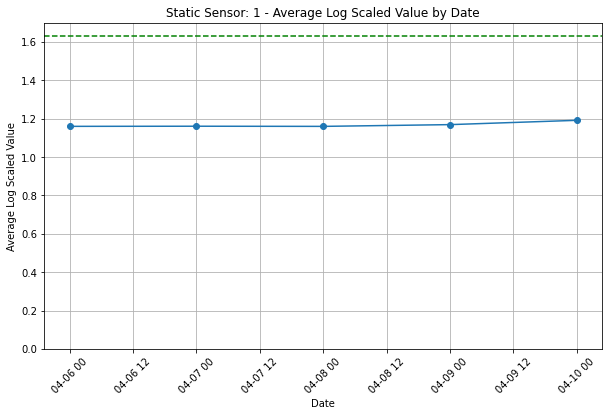

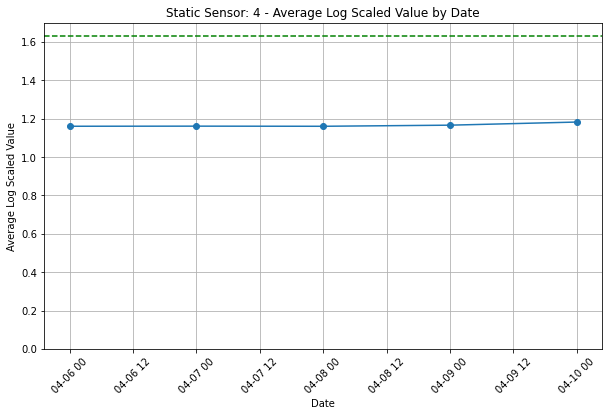

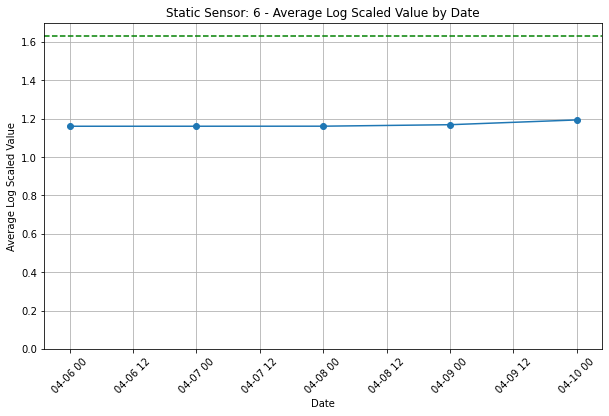

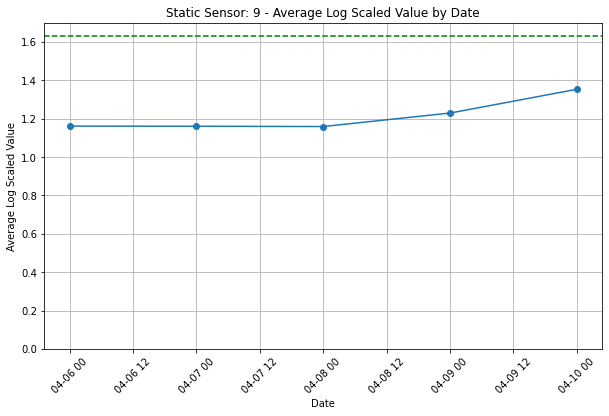

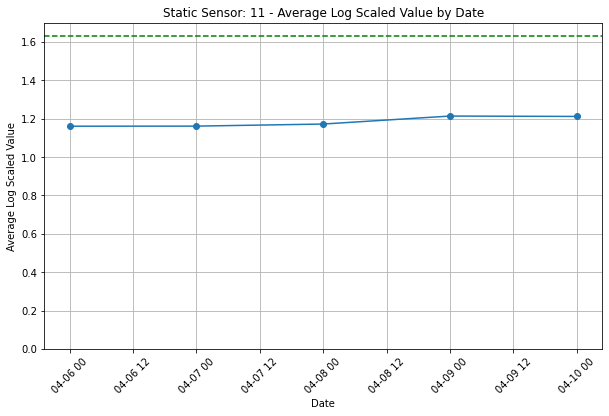

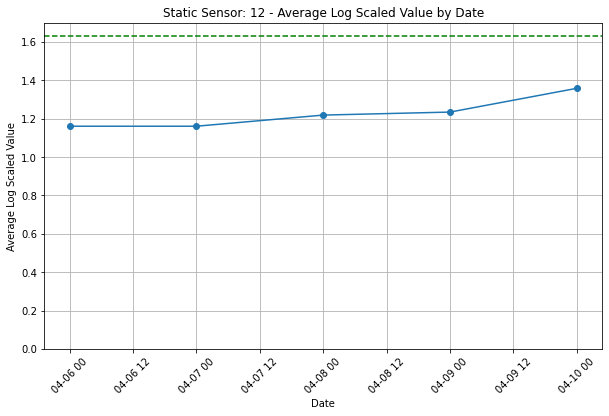

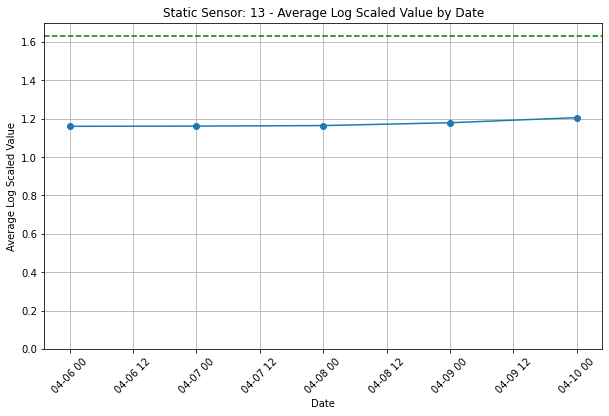

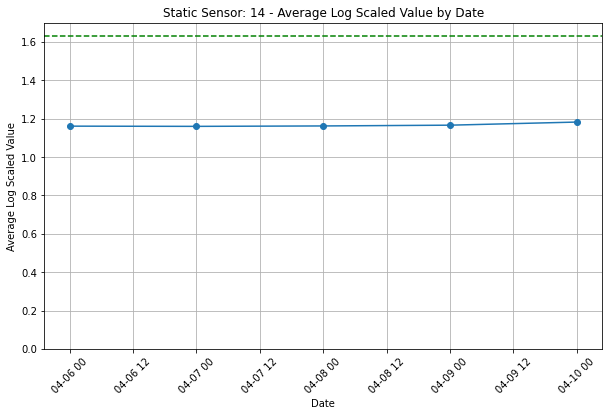

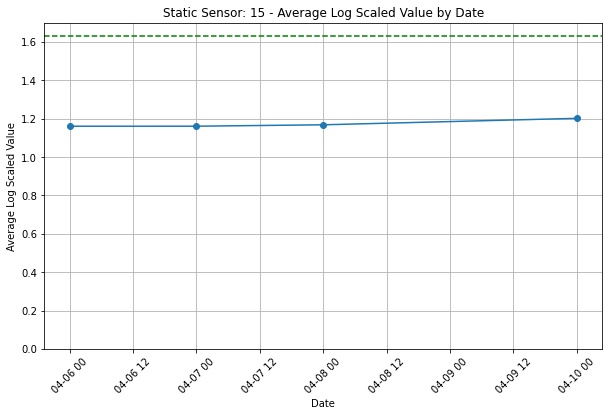

In [23]:
# Convert the 'Timestamp' column to a datetime type if it's not already
static_df['Timestamp'] = pd.to_datetime(static_df['Timestamp'])

# Extract the date from the 'Timestamp' and create a new column for it
static_df['Date'] = static_df['Timestamp'].dt.date

# Group by 'Sensor-id' and 'Date' to calculate average 'LogScaledValue'
average_value_df = static_df.groupby(['Sensor-id', 'Date'])['LogScaledValue'].mean().reset_index()

# Plot the time series for each sensor
for sensor_id, sensor_group in average_value_df.groupby('Sensor-id'):
    plt.figure(figsize=(10, 6))
    plt.plot(sensor_group['Date'], sensor_group['LogScaledValue'], marker='o')
    plt.axhline(y=1.63, color='green', linestyle='--', label='Threshold (40)')
    plt.xlabel('Date')
    plt.ylabel('Average Log Scaled Value')
    plt.title(f'Static Sensor: {sensor_id} - Average Log Scaled Value by Date')
    plt.grid(True)
    plt.ylim(0, 1.70) 
    plt.xticks(rotation=45)
        
    # Save the plot as a PNG file with a specific title
    #plt.savefig(f'avg_by_date_static_{sensor_id}.png', bbox_inches='tight')
    
    plt.show()

#### Static Sensors (filtered, combined plots)

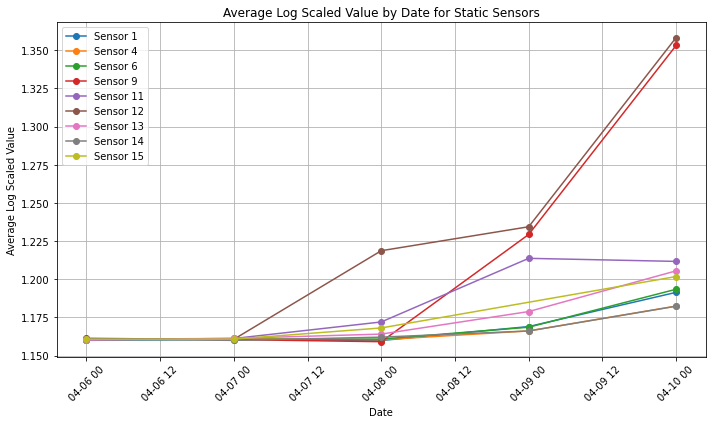

In [24]:
#  Create a single figure and axis
plt.figure(figsize=(10, 6))
ax = plt.gca()

# Plot the time series for each sensor on the same axis
for sensor_id, sensor_group in average_value_df.groupby('Sensor-id'):
    ax.plot(sensor_group['Date'], sensor_group['LogScaledValue'], marker='o', label=f'Sensor {sensor_id}')

ax.set_xlabel('Date')
ax.set_ylabel('Average Log Scaled Value')
ax.set_title('Average Log Scaled Value by Date for Static Sensors')
ax.grid(True)
ax.legend()
plt.xticks(rotation=45)

plt.tight_layout()
#plt.savefig('avg_static_reading_by_date.png', dpi=1000)
plt.show()

#Observation(s):
# Main earthquake appears to be the 8th and the aftershock might of happend on 
#  the 9th

# What could explain sensor 12 beginning to rise the morning of the 7th?

#### --------Mobile Sensors (un-filtered, combined plots)--------

In [25]:
mobile_df.head()

,x,y,Timestamp,Sensor-id,Long,Lat,Value,Units,User-id,LogScaledValue
0,0.172594,289.296133,2020-04-10 08:12:50,2,-119.999950,0.154719,55.900667,cpm,TestUnit,1.747417
1,0.410773,289.965337,2020-04-10 08:12:45,2,-119.999881,0.154525,65.439403,cpm,TestUnit,1.815839
2,0.479811,288.989128,2020-04-09 09:04:45,2,-119.999861,0.154808,41.404731,cpm,TestUnit,1.617050
3,1.028659,289.423765,2020-04-07 13:55:25,50,-119.999702,0.154682,32.000000,cpm,MySensor,1.505150
4,1.146023,289.240941,2020-04-09 09:04:40,2,-119.999668,0.154735,50.292327,cpm,TestUnit,1.701502


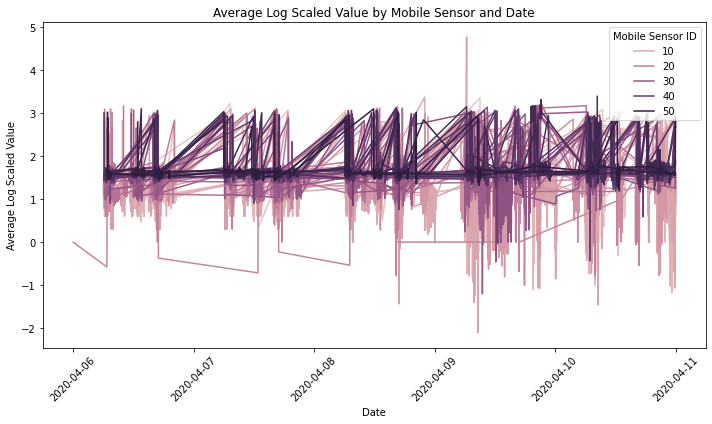

In [26]:
# Get unique mobile sensor IDs and sort them
unique_mobile_sensor_ids = sorted(mobile_df['Sensor-id'].unique())

# Create a line plot using Seaborn for mobile sensors without filtering data
plt.figure(figsize=(10, 6))
sns.lineplot(data=mobile_df, x='Timestamp', y='LogScaledValue', hue='Sensor-id', estimator='mean', ci=None)
plt.xlabel('Date')
plt.ylabel('Average Log Scaled Value')
plt.title('Average Log Scaled Value by Mobile Sensor and Date')
plt.xticks(rotation=45)  # rotate the x-axis labels for readability
plt.tight_layout()
plt.legend(title='Mobile Sensor ID', loc='upper right')
#plt.savefig('avg_mobile_reading_by_date_unfiltered.png', dpi=1000)
plt.show()


#### Mobile Sensors (filtered, individual plots)

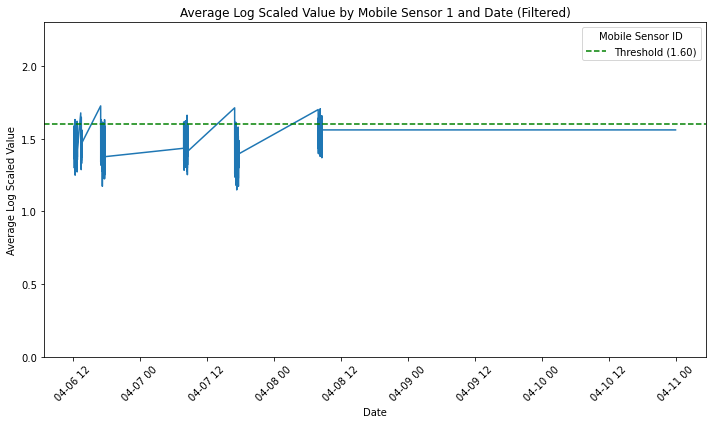

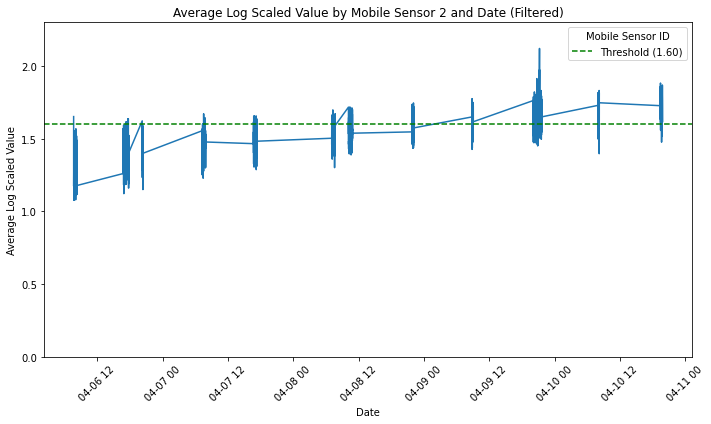

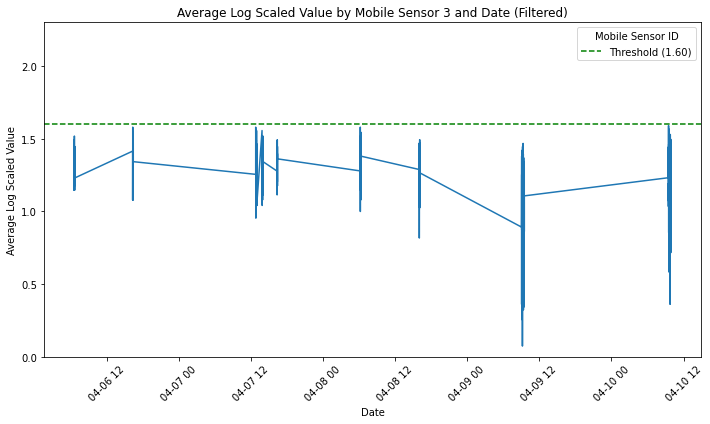

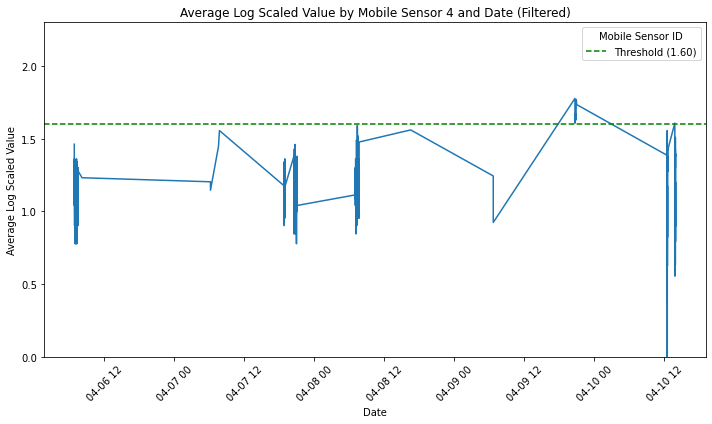

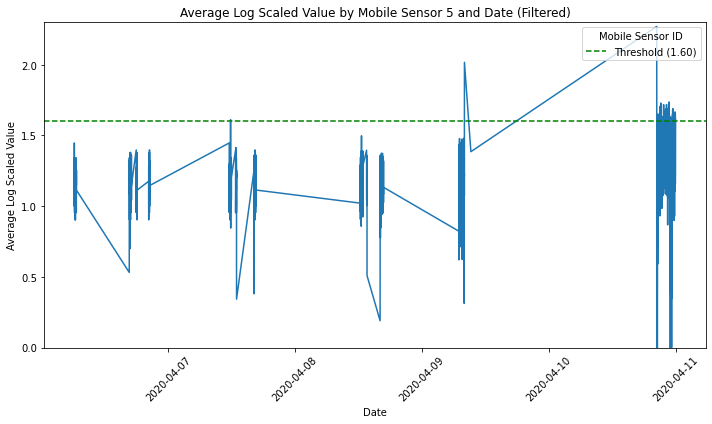

...

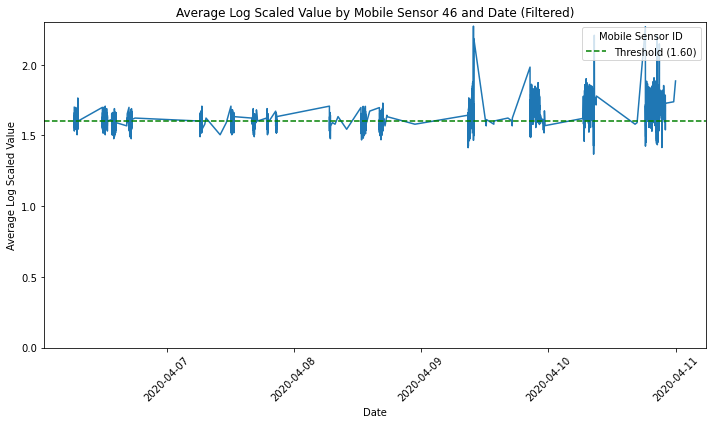

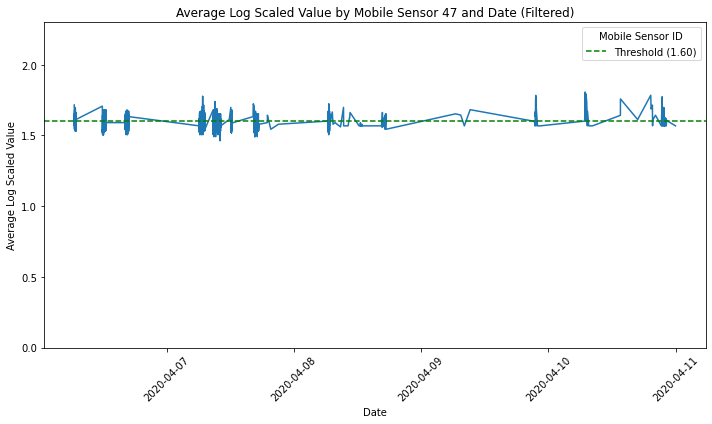

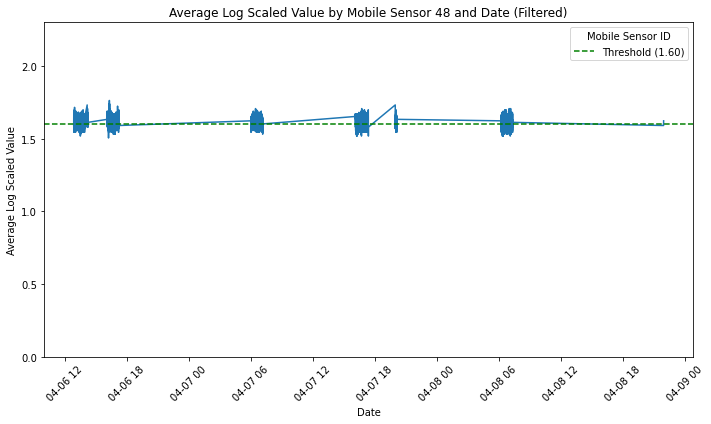

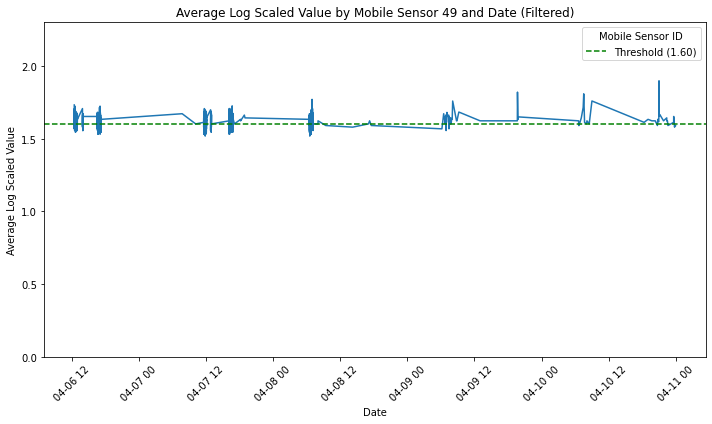

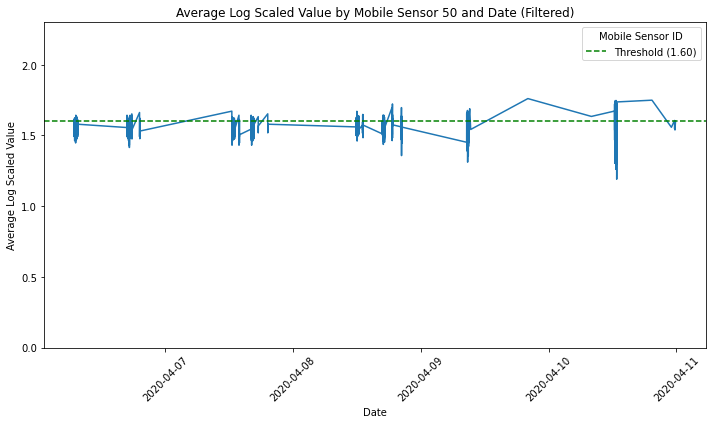

In [27]:
# Set the threshold value to identify spikes. In practice, this will remove those extremely high
#  readings as a result of the mobile sensor warming up.

threshold = 2.30  # find the lowest valued warmup spike

# Get unique mobile sensor IDs and sort them
unique_mobile_sensor_ids = sorted(mobile_df['Sensor-id'].unique())

# Iterate through each mobile sensor ID and create a separate plot
for sensor_id in unique_mobile_sensor_ids:
    sensor_data = mobile_df[mobile_df['Sensor-id'] == sensor_id]
    
    # filter out the data points that exceed the threshold
    filtered_data = sensor_data[sensor_data['LogScaledValue'] <= threshold]
    
    plt.figure(figsize=(10, 6))
    sns.lineplot(data=filtered_data, x='Timestamp', y='LogScaledValue', estimator='mean', ci=None)
    plt.axhline(y=1.60, color='green', linestyle='--', label='Threshold (1.60)')
    plt.xlabel('Date')
    plt.ylabel('Average Log Scaled Value')
    plt.title(f'Average Log Scaled Value by Mobile Sensor {sensor_id} and Date (Filtered)')
    plt.xticks(rotation=45)  # rotate the x-axis labels for readability
    plt.ylim(0, threshold) 
    plt.tight_layout()
    plt.legend(title='Mobile Sensor ID', loc='upper right')
    # Save the plot as a PNG file with a specific title
    #plt.savefig(f'avg_by_date_mobile_{sensor_id}.png', bbox_inches='tight')
    
    plt.show()


#### Mobile Sensors (filtered, combined plots)

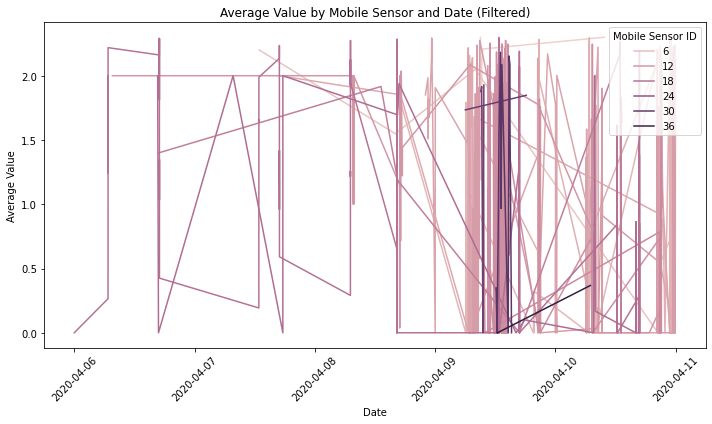

'Note that spikes in radiation from data collection and from sensor warmup spike are \ndiscernable by the following characteristics.\n\nSensor Warmup Spikes\n- Have a triangular shape and typically occur once a sensor powers up. Resulting in innaccurately \n   high radiation readings\n   \nActual Radiation Spikes\n - Doesnt have a triangular shape and occurs during post-warmup data collection'

In [28]:
# Filter out the data points that exceed the threshold
filtered_mobile_df = mobile_df[mobile_df['Value'] <= threshold]

# Create a line plot using Seaborn for mobile sensors with filtered data
plt.figure(figsize=(10, 6))
sns.lineplot(data=filtered_mobile_df, x='Timestamp', y='Value', hue='Sensor-id', estimator='mean', ci=None)
plt.xlabel('Date')
plt.ylabel('Average Value')
plt.title('Average Value by Mobile Sensor and Date (Filtered)')
plt.xticks(rotation=45)  # rotate the x-axis labels for readability
plt.tight_layout()
plt.legend(title='Mobile Sensor ID', loc='upper right')
#plt.savefig('avg_mobile_reading_by_date.png', dpi=1000)
plt.show()

'''Note that spikes in radiation from data collection and from sensor warmup spike are 
discernable by the following characteristics.

Sensor Warmup Spikes
- Have a triangular shape and typically occur once a sensor powers up. Resulting in innaccurately 
   high radiation readings
   
Actual Radiation Spikes
 - Doesnt have a triangular shape and occurs during post-warmup data collection'''

### *Timeseries of MAXIMUM Sensor Reading by Sensor and DATE*

#### --------Static Sensors (un-filtered, combined plots)--------

In [29]:
# Define a custom aggregation function to get both the maximum 'LogScaledValue' and the original dates
def custom_agg_max(group):
    return pd.Series({
        'Max_LogScaledValue': group['LogScaledValue'].max(),
        'Original_Dates': group['Date'].unique()  # timestamp converted to dates
    })

# Group by 'Sensor-id' and 'Date' and apply the custom_agg_max function to get the desired result
max_value_and_dates_df = static_df.groupby(['Sensor-id', 'Date']).apply(custom_agg_max)

# Reset the MultiIndex to have a cleaner DataFrame
max_value_and_dates_df.reset_index(inplace=True)


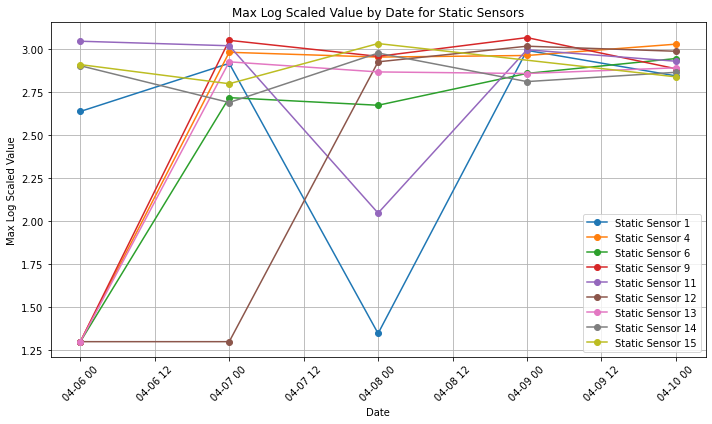

In [30]:
# Create a single plot to contain all lines
plt.figure(figsize=(10, 6))

# Plot the time series for each sensor on the same plot
for sensor_id, sensor_group in max_value_and_dates_df.groupby('Sensor-id'):
    # Filter out values above the y-value threshold
    sensor_group_filtered = sensor_group[sensor_group['Max_LogScaledValue'] <= 3.08]
    
    plt.plot(sensor_group_filtered['Date'], sensor_group_filtered['Max_LogScaledValue'], marker='o', label=f'Static Sensor {sensor_id}')

plt.xlabel('Date')
plt.ylabel('Max Log Scaled Value')
plt.title('Max Log Scaled Value by Date for Static Sensors')
plt.grid(True)
plt.xticks(rotation=45)  # Rotate the x-axis labels for readability
plt.legend()  # Show legend with labels for each sensor
plt.tight_layout()
#plt.savefig('max_static_reading_by_date_unfiltered.png', dpi=1000)
plt.show()



#### Static Sensors (filtered, individual plots)

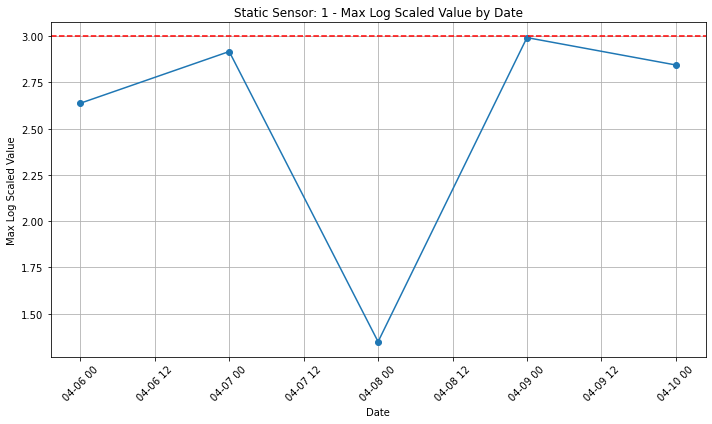

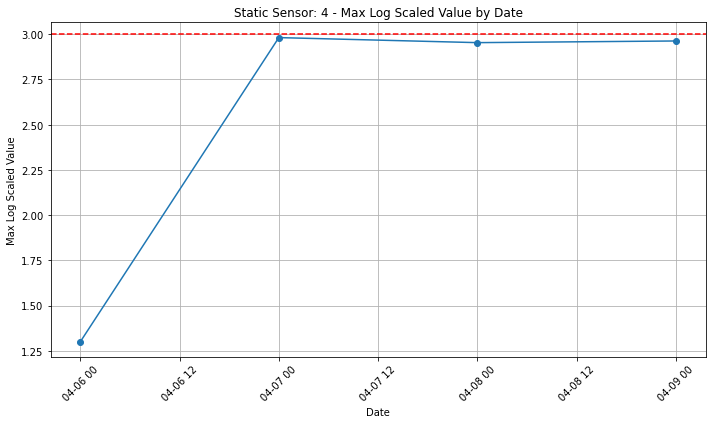

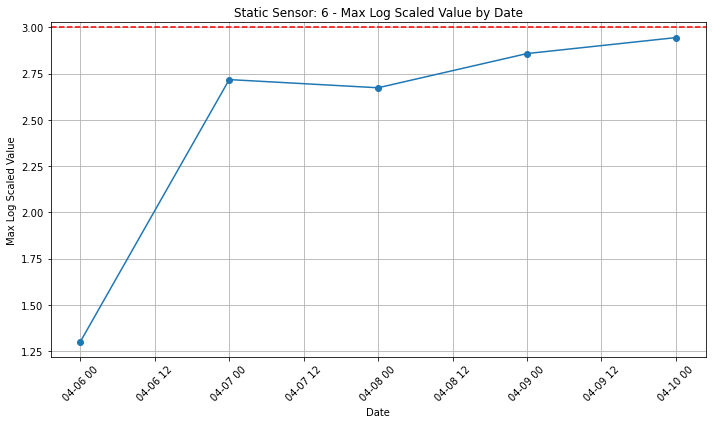

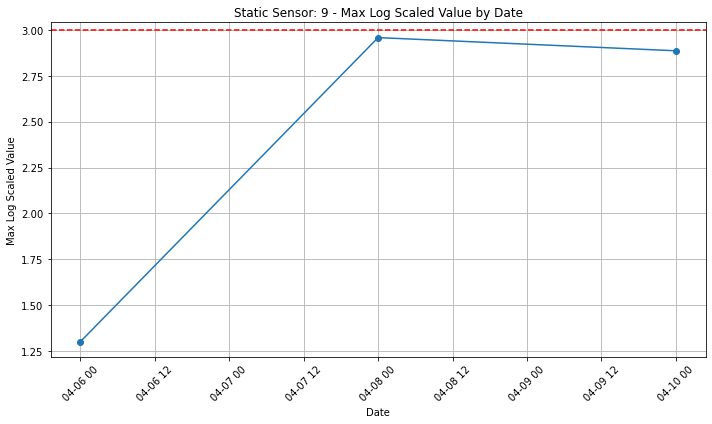

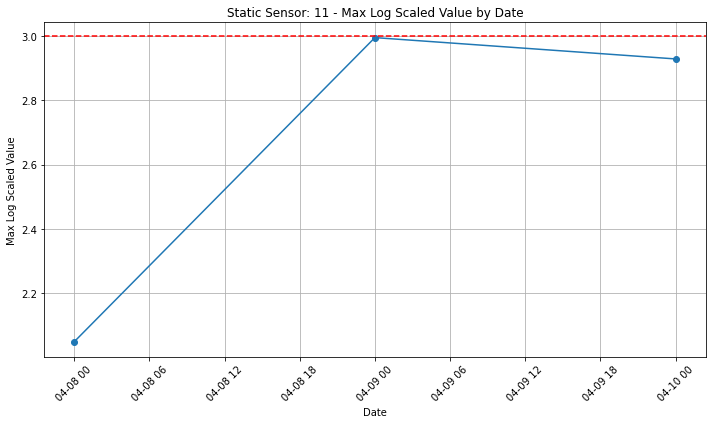

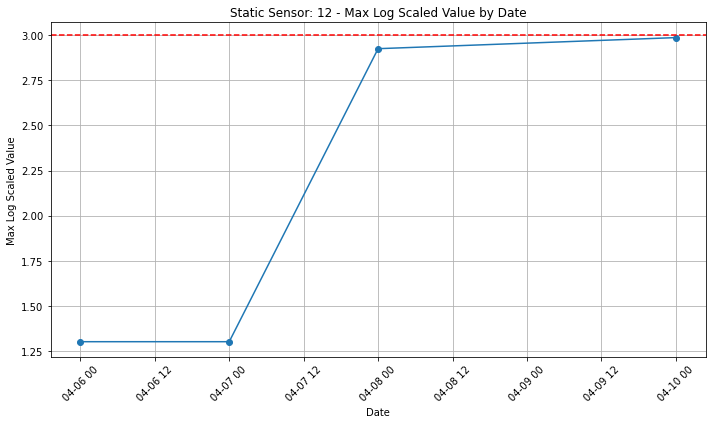

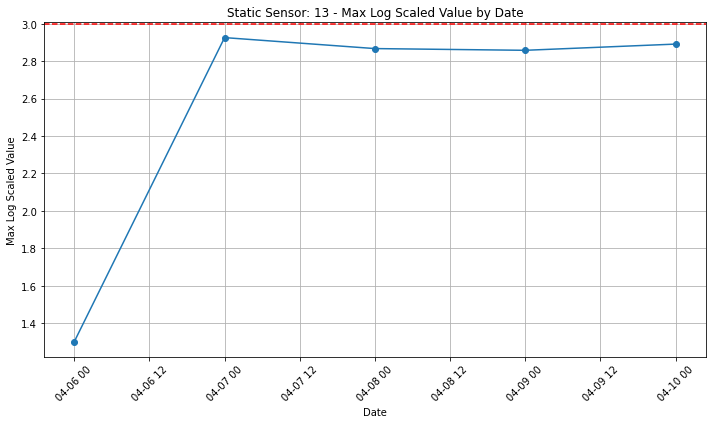

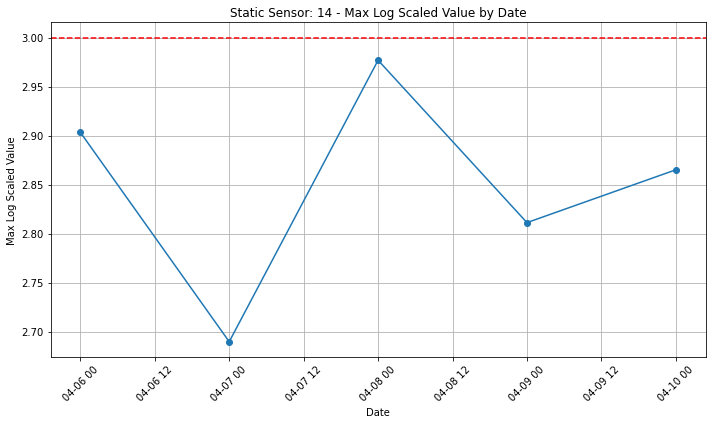

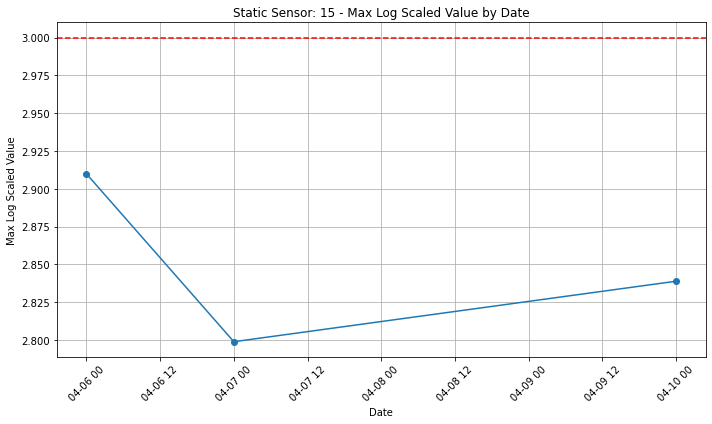

In [31]:
# Set the y-value threshold
y_value_threshold = 3

# Plot the time series for each sensor
for sensor_id, sensor_group in max_value_and_dates_df.groupby('Sensor-id'):
    # Filter out values above the y-value threshold
    sensor_group_filtered = sensor_group[sensor_group['Max_LogScaledValue'] <= y_value_threshold]
    
    plt.figure(figsize=(10, 6))  # adjust the figure size as per needed
    plt.plot(sensor_group_filtered['Date'], sensor_group_filtered['Max_LogScaledValue'], marker='o', label=f'Static Sensor {sensor_id}')
    plt.axhline(y=y_value_threshold, color='r', linestyle='--', label=f'Threshold ({y_value_threshold})')
    plt.xlabel('Date')
    plt.ylabel('Max Log Scaled Value')
    plt.title(f'Static Sensor: {sensor_id} - Max Log Scaled Value by Date')
    plt.grid(True)
    plt.xticks(rotation=45)  # Rotate the x-axis labels for readability
    plt.tight_layout()
    #plt.savefig(f'max_by_date_static_{sensor_id}.png', bbox_inches='tight')
    plt.show()


#### Static Sensors (filtered, combined plots)

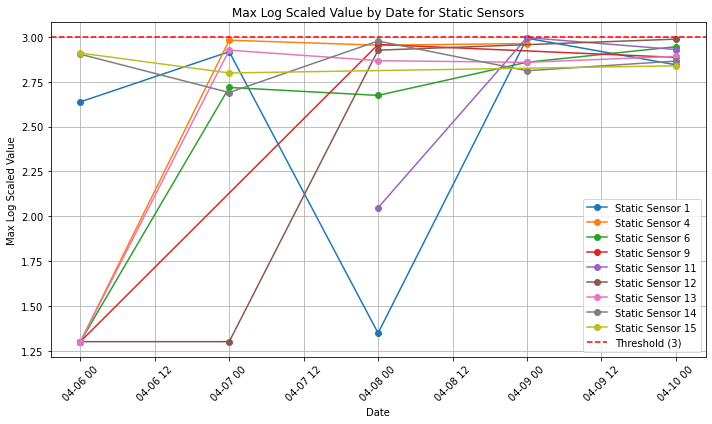

In [32]:
# Create a single plot to contain all lines
plt.figure(figsize=(10, 6))

# Plot the time series for each sensor on the same plot
for sensor_id, sensor_group in max_value_and_dates_df.groupby('Sensor-id'):
    # Filter out values above the y-value threshold
    sensor_group_filtered = sensor_group[sensor_group['Max_LogScaledValue'] <= y_value_threshold]
    
    plt.plot(sensor_group_filtered['Date'], sensor_group_filtered['Max_LogScaledValue'], marker='o', label=f'Static Sensor {sensor_id}')

plt.axhline(y=y_value_threshold, color='r', linestyle='--', label=f'Threshold ({y_value_threshold})')
plt.xlabel('Date')
plt.ylabel('Max Log Scaled Value')
plt.title('Max Log Scaled Value by Date for Static Sensors')
plt.grid(True)
plt.xticks(rotation=45)  # Rotate the x-axis labels for readability
plt.legend()  # Show legend with labels for each sensor
plt.tight_layout()
#plt.savefig('max_static_reading_by_date.png', dpi=1000)
plt.show()

#fig.write_image('max_static_reading_by_date.png')

#### --------Mobile Sensors (un-filtered, combined plots)--------

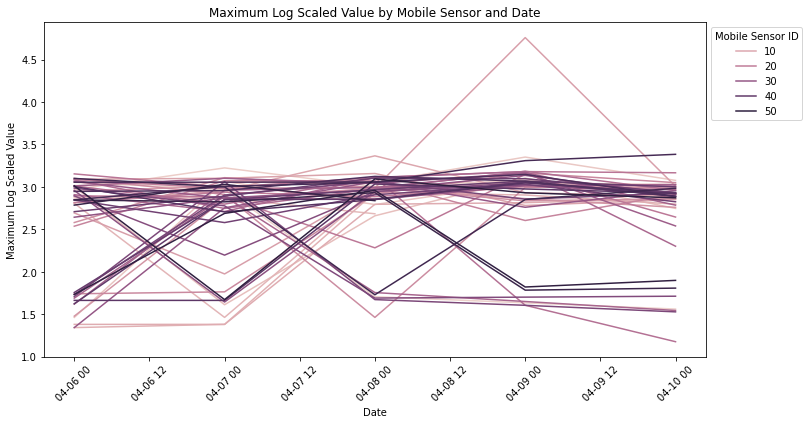

In [33]:
# Create a DataFrame to accumulate maximum value data for all sensors
max_values_accumulated = pd.DataFrame()

# Iterate through each mobile sensor ID and accumulate maximum value data
for sensor_id in unique_mobile_sensor_ids:
    sensor_data = mobile_df[mobile_df['Sensor-id'] == sensor_id]
    
    # Calculate the maximum value for each date
    max_values_by_date = sensor_data.groupby(sensor_data['Timestamp'].dt.date)['LogScaledValue'].max()
    max_values_data = pd.DataFrame({'Date': max_values_by_date.index, 'Max_LogScaledValue': max_values_by_date.values})
    
    max_values_data['Sensor-id'] = sensor_id  # Add a column to identify the sensor
    
    max_values_accumulated = pd.concat([max_values_accumulated, max_values_data], ignore_index=True)

# Filter out the data points that exceed the threshold
#max_values_accumulated = max_values_accumulated[max_values_accumulated['Max_LogScaledValue'] <= 9000]

# Create a single line plot using Seaborn for all mobile sensors
plt.figure(figsize=(10, 6))
sns.lineplot(data=max_values_accumulated, x='Date', y='Max_LogScaledValue', hue='Sensor-id', ci=None)
plt.xlabel('Date')
plt.ylabel('Maximum Log Scaled Value')
plt.title('Maximum Log Scaled Value by Mobile Sensor and Date')
plt.xticks(rotation=45)  # rotate the x-axis labels for readability
plt.tight_layout()

# Adjust the legend position
plt.legend(title='Mobile Sensor ID', loc='upper left', bbox_to_anchor=(1, 1))

#plt.savefig('max_mobile_reading_by_date_unfiltered.png', dpi=1000)
plt.show()

#### Mobile Sensors (filtered, individual plots)

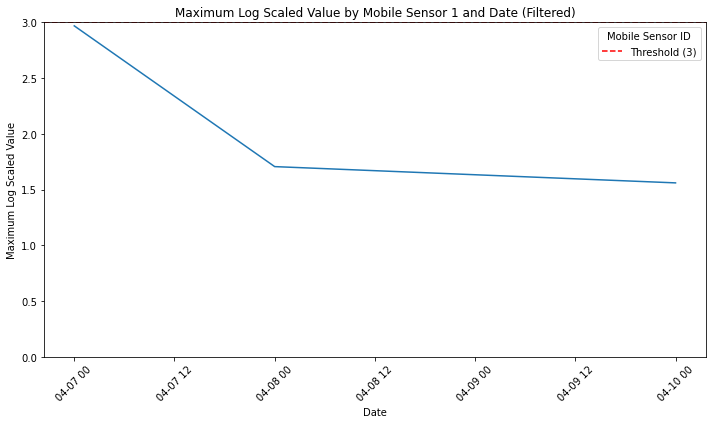

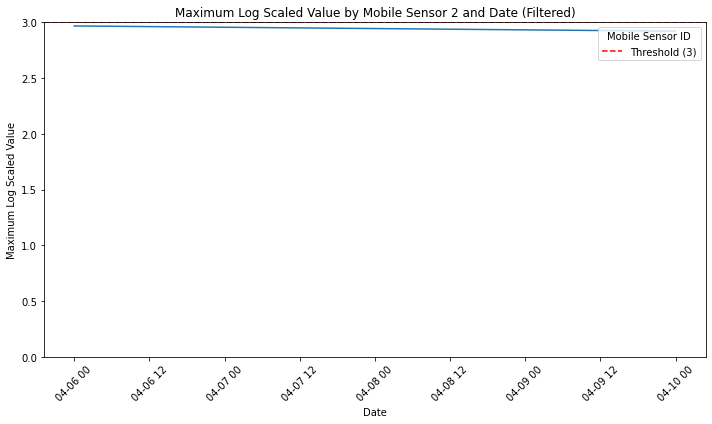

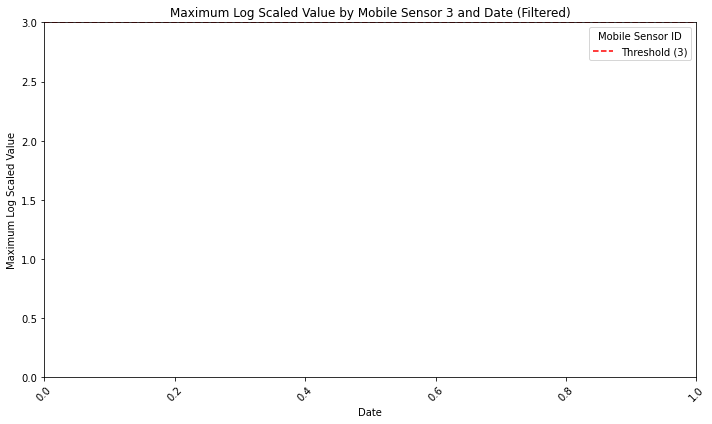

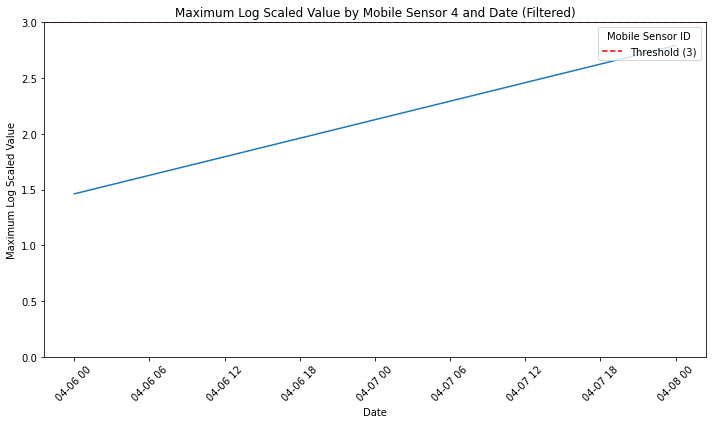

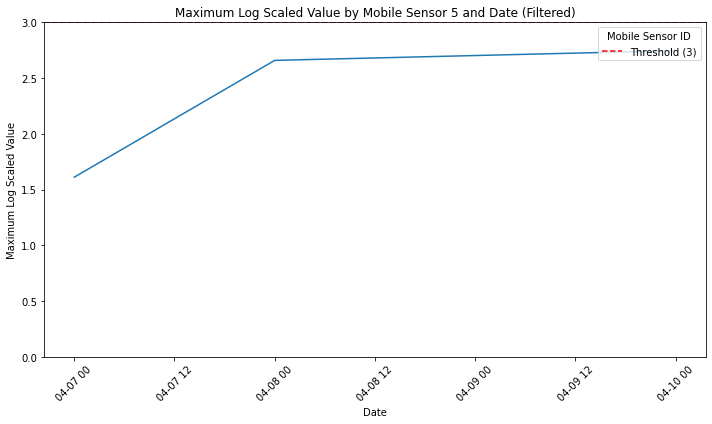

...

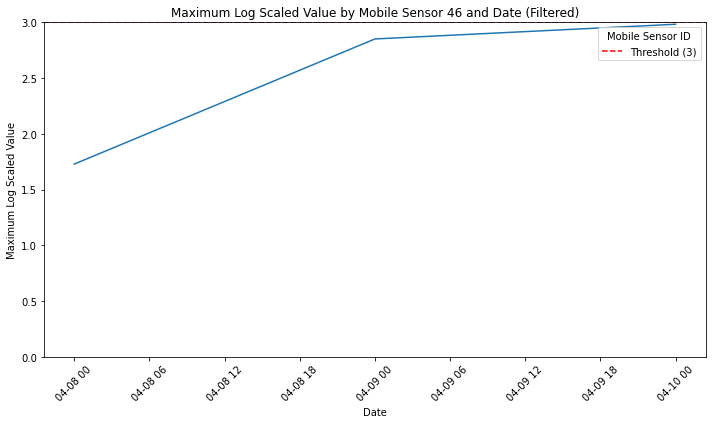

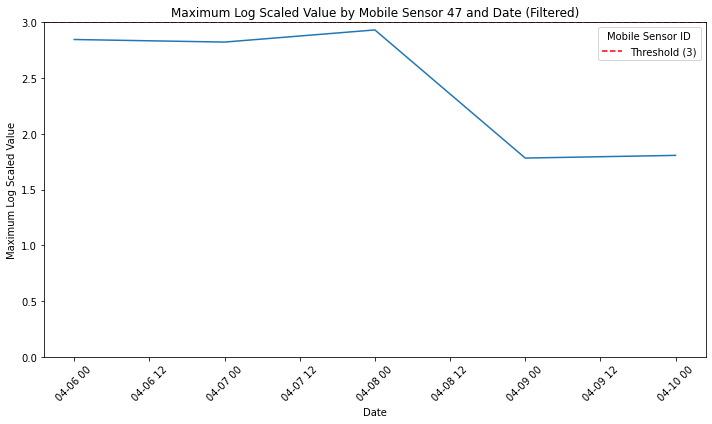

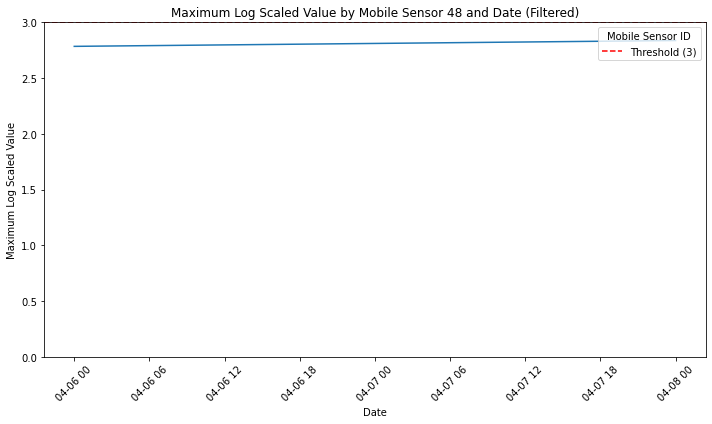

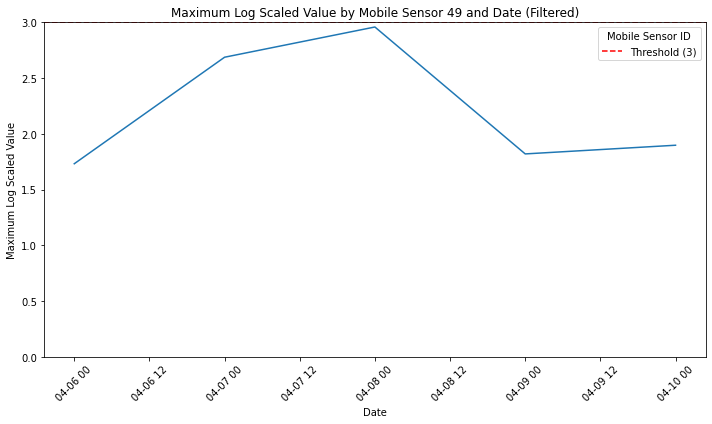

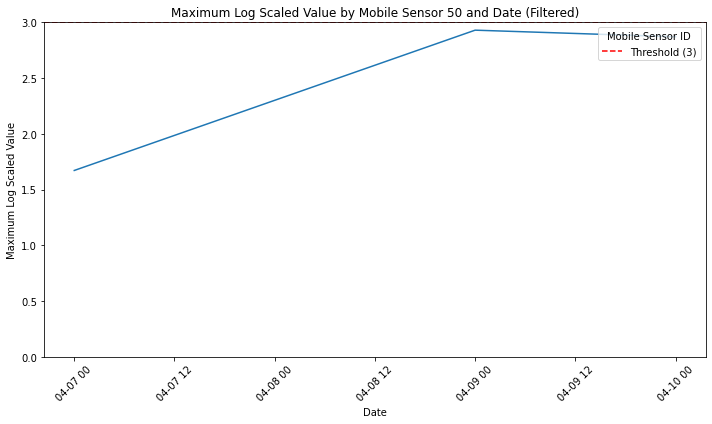

In [34]:
# Set the y-value threshold
y_threshold = 3

# Iterate through each mobile sensor ID and create a separate plot
for sensor_id in unique_mobile_sensor_ids:
    sensor_data = mobile_df[mobile_df['Sensor-id'] == sensor_id]
    
    # calculate the maximum value for each date
    max_values_by_date = sensor_data.groupby(sensor_data['Timestamp'].dt.date)['LogScaledValue'].max()
    max_values_data = pd.DataFrame({'Date': max_values_by_date.index, 'Max_LogScaledValue': max_values_by_date.values})
    
    # filter out the data points that exceed the y-threshold
    filtered_data = max_values_data[max_values_data['Max_LogScaledValue'] <= y_threshold]
    
    plt.figure(figsize=(10, 6))
    sns.lineplot(data=filtered_data, x='Date', y='Max_LogScaledValue', ci=None)
    plt.axhline(y=y_threshold, color='r', linestyle='--', label=f'Threshold ({y_threshold})')
    plt.xlabel('Date')
    plt.ylabel('Maximum Log Scaled Value')
    plt.title(f'Maximum Log Scaled Value by Mobile Sensor {sensor_id} and Date (Filtered)')
    plt.xticks(rotation=45)
    plt.ylim(0,y_threshold)  # set y-axis limit to y_threshold
    plt.tight_layout()
    plt.legend(title='Mobile Sensor ID', loc='upper right')
    #plt.savefig(f'max_by_date_mobile_{sensor_id}.png', bbox_inches='tight')
    plt.show()


#### Mobile Sensors (filtered, combined plots)

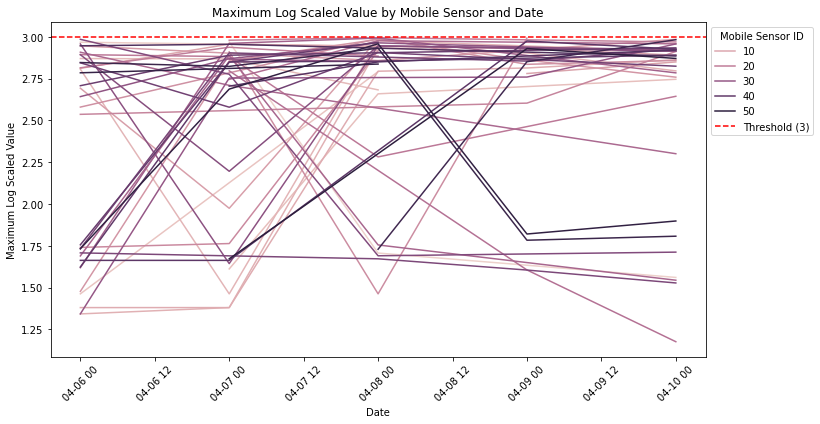

In [35]:
# Create a DataFrame to accumulate maximum value data for all sensors
max_values_accumulated = pd.DataFrame()

# Iterate through each mobile sensor ID and accumulate maximum value data
for sensor_id in unique_mobile_sensor_ids:
    sensor_data = mobile_df[mobile_df['Sensor-id'] == sensor_id]
    
    # Calculate the maximum value for each date
    max_values_by_date = sensor_data.groupby(sensor_data['Timestamp'].dt.date)['LogScaledValue'].max()
    max_values_data = pd.DataFrame({'Date': max_values_by_date.index, 'Max_LogScaledValue': max_values_by_date.values})
    
    max_values_data['Sensor-id'] = sensor_id  # Add a column to identify the sensor
    
    max_values_accumulated = pd.concat([max_values_accumulated, max_values_data], ignore_index=True)

# Filter out the data points that exceed the threshold
max_values_accumulated = max_values_accumulated[max_values_accumulated['Max_LogScaledValue'] <= y_threshold]

# Create a single line plot using Seaborn for all mobile sensors
plt.figure(figsize=(10, 6))
sns.lineplot(data=max_values_accumulated, x='Date', y='Max_LogScaledValue', hue='Sensor-id', ci=None)
plt.axhline(y=y_threshold, color='r', linestyle='--', label=f'Threshold ({y_threshold})')
plt.xlabel('Date')
plt.ylabel('Maximum Log Scaled Value')
plt.title('Maximum Log Scaled Value by Mobile Sensor and Date')
plt.xticks(rotation=45)  # rotate the x-axis labels for readability
plt.tight_layout()

# Adjust the legend position
plt.legend(title='Mobile Sensor ID', loc='upper left', bbox_to_anchor=(1, 1))
#plt.savefig('max_mobile_reading_by_date.png', dpi=1000)
plt.show()


### *Timeseries of AVERAGE Sensor Reading by Sensor and HOUR*

#### Static Sensors (filtered, individual plots)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


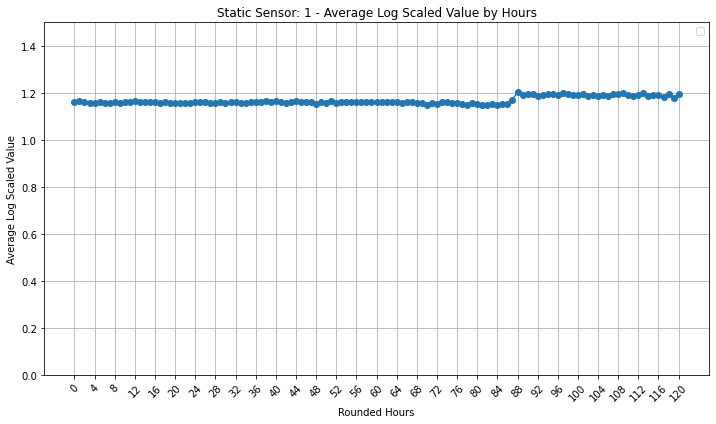

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


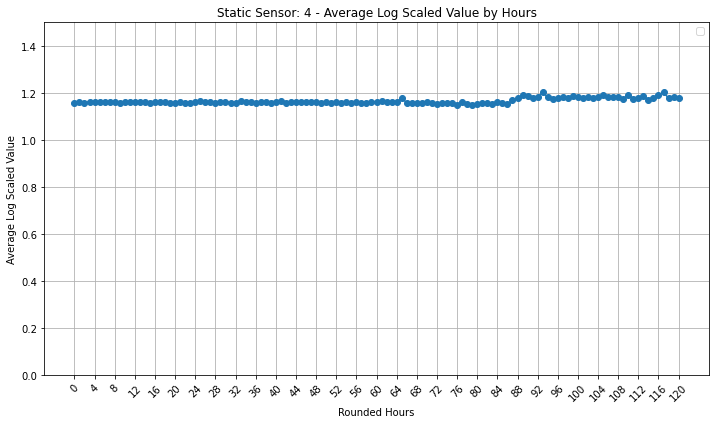

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


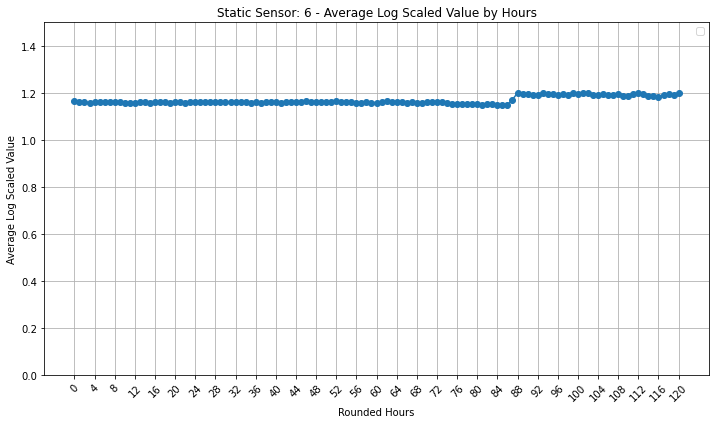

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


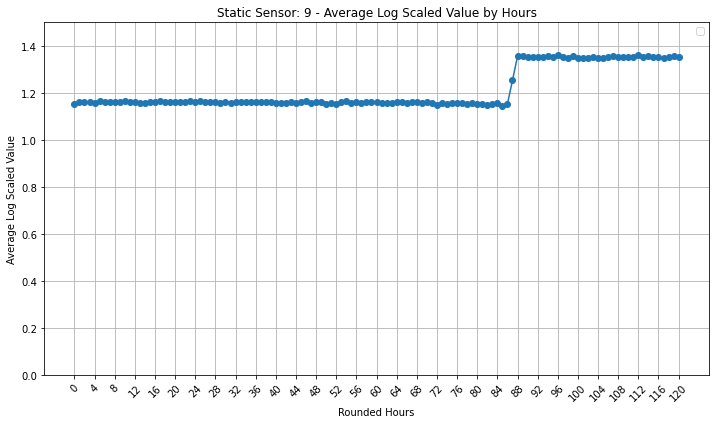

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


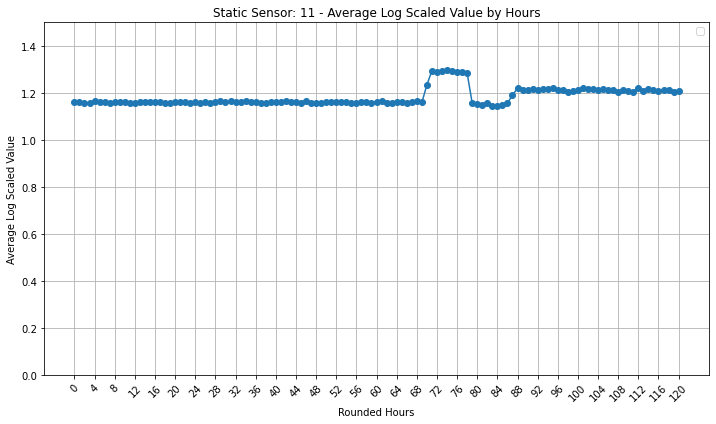

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


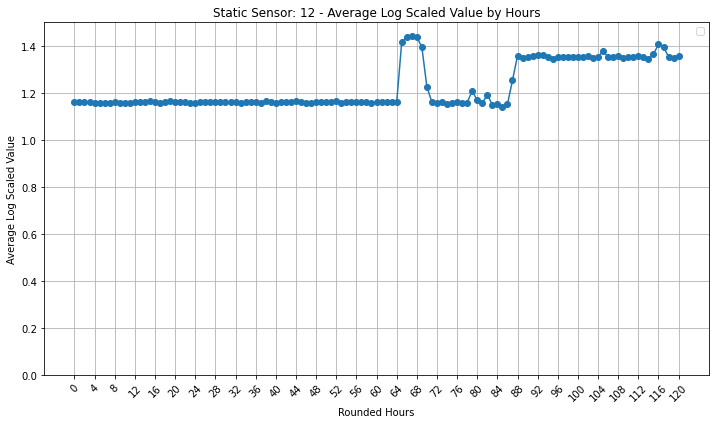

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


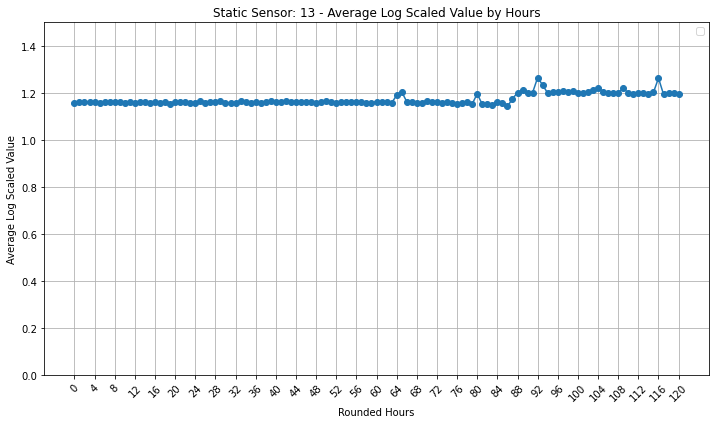

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


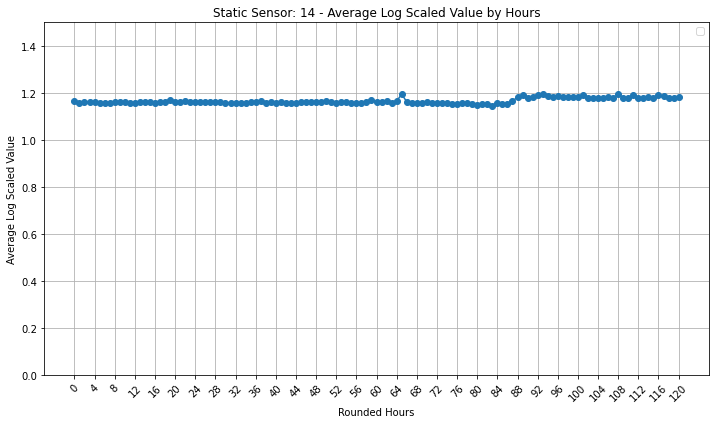

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


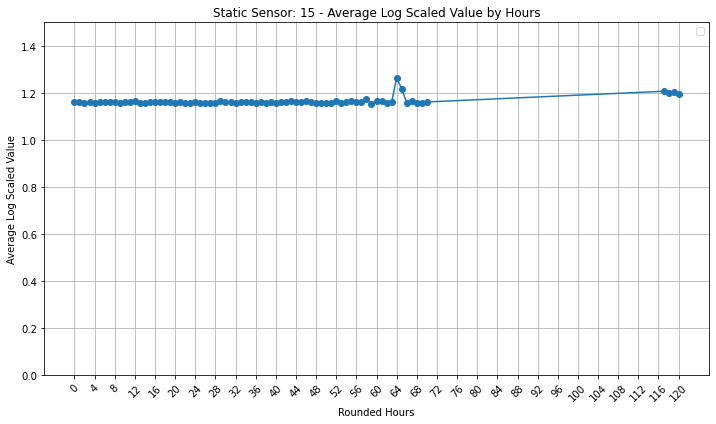

In [36]:
# Calculate the number of hours since the start of the data collection
static_df['Hours_since_start'] = (static_df['Timestamp'] - static_df['Timestamp'].min()).dt.total_seconds() / 3600

# Round the 'Hours_since_start' to the nearest hour
static_df['Rounded_Hours'] = static_df['Hours_since_start'].round()

# Define a custom aggregation function to get the average 'LogScaledValue' for each hour
def custom_agg_hour(group):
    return pd.Series({
        'Average_LogScaledValue': group['LogScaledValue'].mean()
    })

# Group by 'Sensor-id', 'Rounded_Hours', and apply the custom_agg_hour function to get the desired result
average_value_and_hours_df = static_df.groupby(['Sensor-id', 'Rounded_Hours']).apply(custom_agg_hour)

# Reset the MultiIndex to have a cleaner DataFrame
average_value_and_hours_df.reset_index(inplace=True)

# Plot the time series for each static sensor
for sensor_id, sensor_group in average_value_and_hours_df.groupby('Sensor-id'):
    plt.figure(figsize=(10, 6))  # adjust the figure size as per needed
    plt.plot(sensor_group['Rounded_Hours'], sensor_group['Average_LogScaledValue'], marker='o')
    plt.axhline(y=26, color='red', linestyle='--')
    plt.xlabel('Rounded Hours')
    plt.ylabel('Average Log Scaled Value')
    plt.title(f'Static Sensor: {sensor_id} - Average Log Scaled Value by Hours')
    plt.grid(True)
    plt.xticks(np.arange(0, int(static_df['Rounded_Hours'].max()) + 1, step=4), rotation=45)  # Adjust x-axis ticks for every 4 hours with rotation
    plt.tight_layout()
    plt.ylim(0, 1.5)
    plt.legend()
    #plt.savefig(f'avg_by_hour_static_{sensor_id}.png', bbox_inches='tight')
    plt.show()


#### Static Sensors (filtered, combined plots)

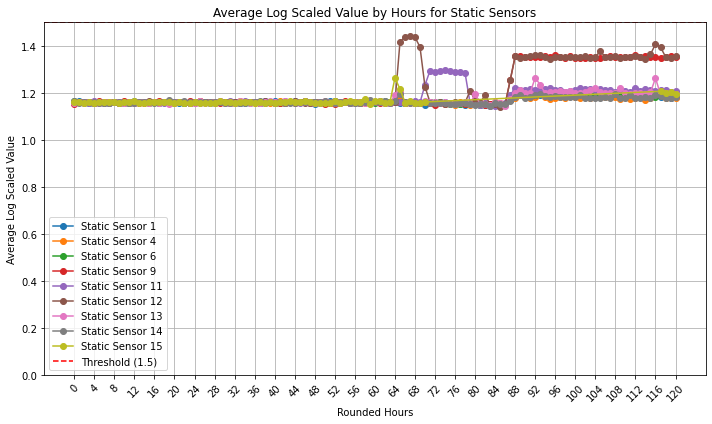

In [37]:
# Set the y-value threshold
y_value_threshold = 1.5

# Create a single plot to contain all lines
plt.figure(figsize=(10, 6))

# Plot the time series for each static sensor on the same plot
for sensor_id, sensor_group in average_value_and_hours_df.groupby('Sensor-id'):
    # Filter out values above the y-value threshold
    sensor_group_filtered = sensor_group[sensor_group['Average_LogScaledValue'] <= y_value_threshold]
    
    plt.plot(sensor_group_filtered['Rounded_Hours'], sensor_group_filtered['Average_LogScaledValue'], marker='o', label=f'Static Sensor {sensor_id}')

plt.axhline(y=y_value_threshold, color='r', linestyle='--', label=f'Threshold ({y_value_threshold})')
plt.xlabel('Rounded Hours')
plt.ylabel('Average Log Scaled Value')
plt.title('Average Log Scaled Value by Hours for Static Sensors')
plt.grid(True)
plt.xticks(np.arange(0, int(static_df['Rounded_Hours'].max()) + 1, step=4), rotation=45)  # Adjust x-axis ticks for every 4 hours with rotation
plt.ylim(0, y_value_threshold)
plt.tight_layout()
plt.legend()  # Show legend with labels for each sensor
#plt.savefig('avg_static_log_scaled_by_hour.png', dpi=1000)
plt.show()


#### --------Mobile Sensors (un-filtered, combined plots)--------

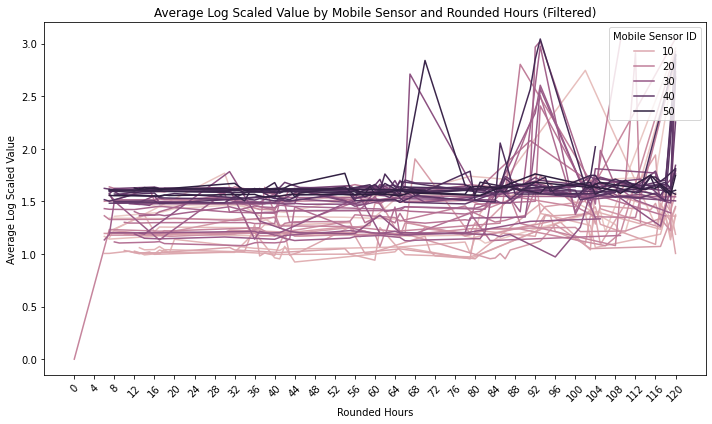

In [38]:
# Calculate the number of hours since the start of the data collection
mobile_df['Hours_since_start'] = (mobile_df['Timestamp'] - mobile_df['Timestamp'].min()).dt.total_seconds() / 3600

# Round the 'Hours_since_start' to the nearest hour
mobile_df['Rounded_Hours'] = mobile_df['Hours_since_start'].round()

# Create a line plot using Seaborn for mobile sensors with filtered data
plt.figure(figsize=(10, 6))
sns.lineplot(data=mobile_df, x='Rounded_Hours', y='LogScaledValue', hue='Sensor-id', estimator='mean', ci=None)
plt.xlabel('Rounded Hours')
plt.ylabel('Average Log Scaled Value')
plt.title('Average Log Scaled Value by Mobile Sensor and Rounded Hours (Filtered)')
# Adjust x-axis ticks for every 4 hours with rotation
plt.xticks(np.arange(0, int(mobile_df['Rounded_Hours'].max()) + 1, step=4), rotation=45)  
plt.tight_layout()
plt.legend(title='Mobile Sensor ID', loc='upper right')
#plt.savefig('avg_mobile_log_scaled_reading_by_hour_unfiltered.png', dpi=1000)
plt.show()


#### Mobile Sensors (filtered, individual plots)

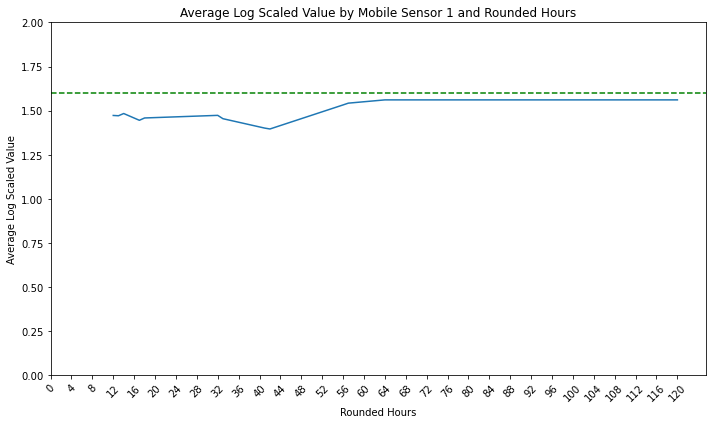

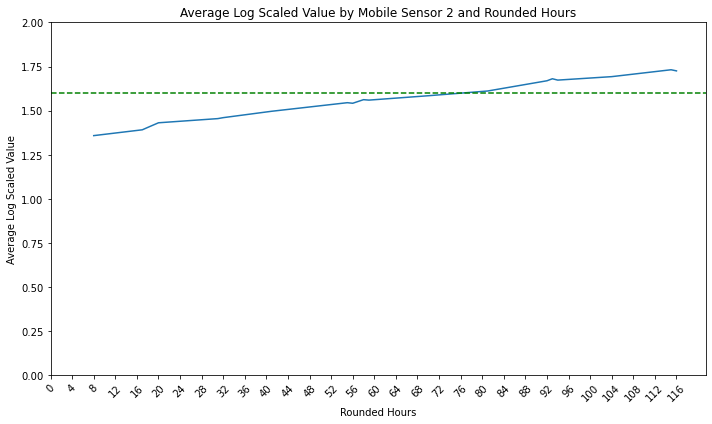

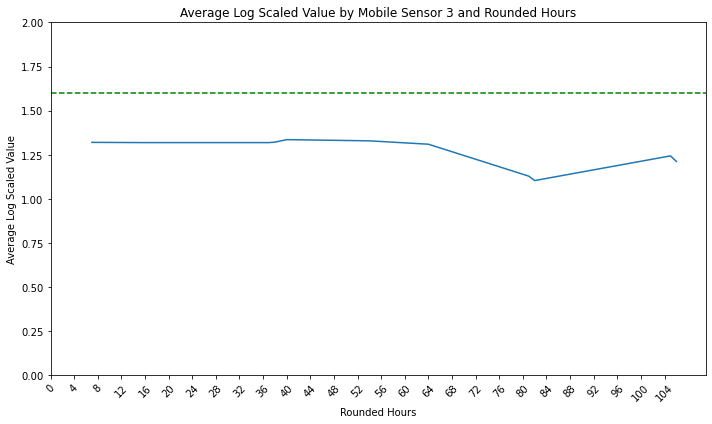

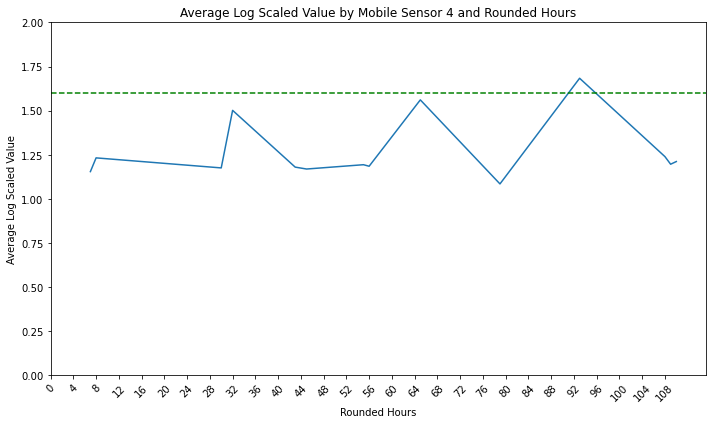

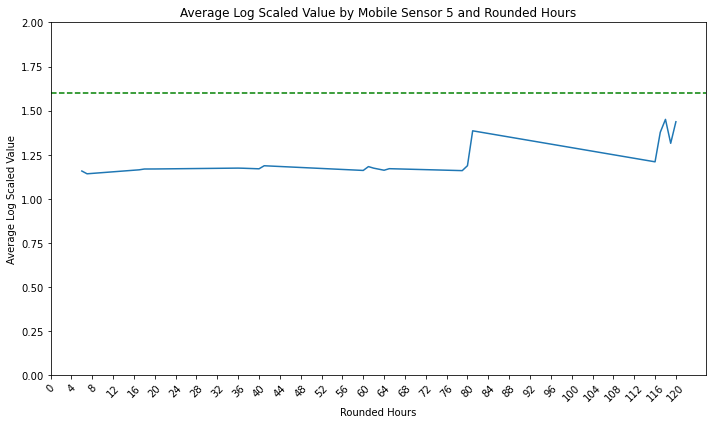

...

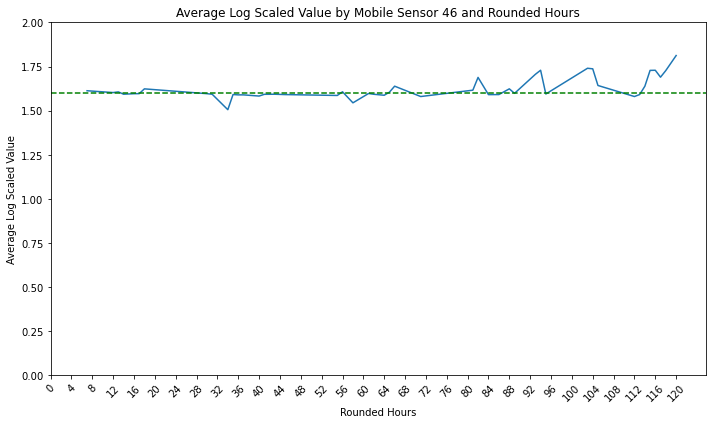

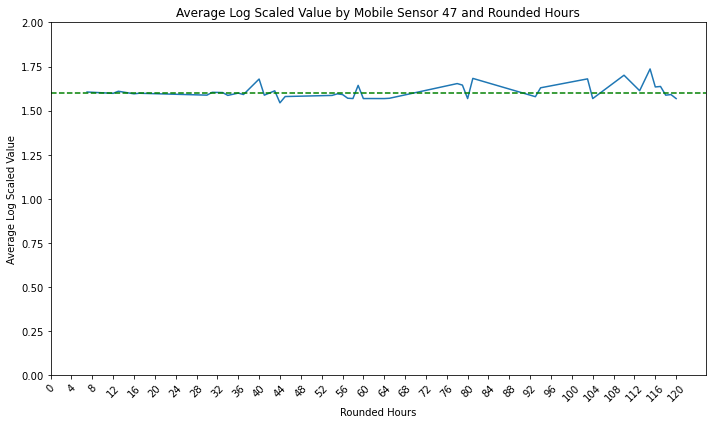

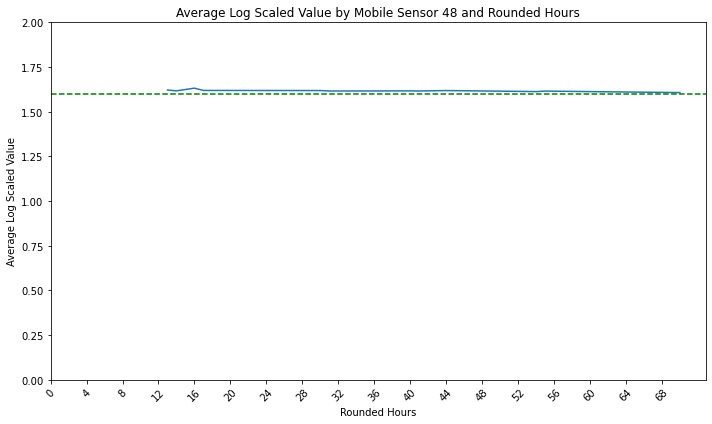

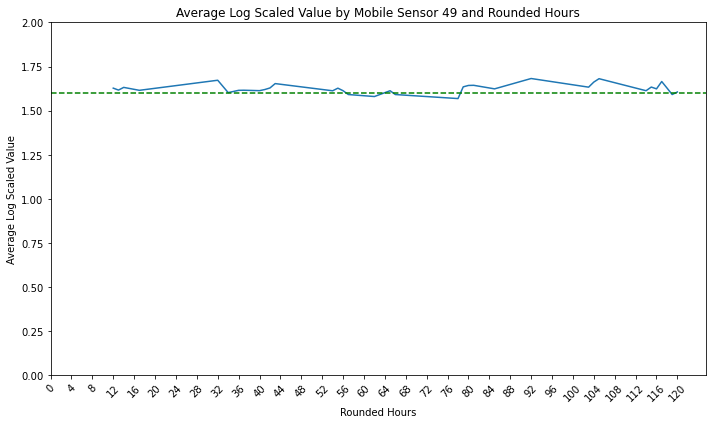

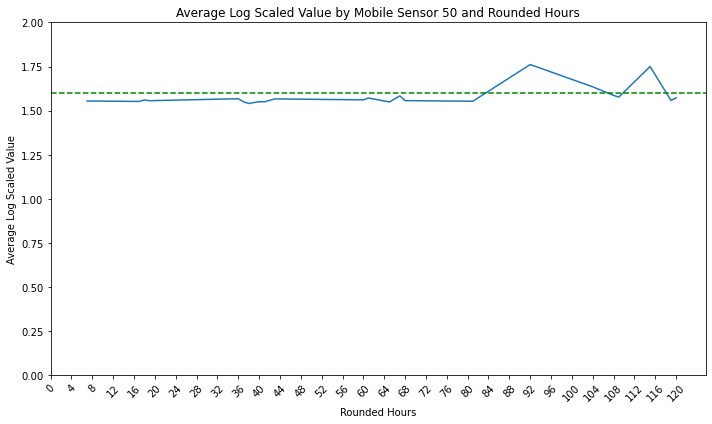

In [39]:
# Set the y-value threshold
threshold = 2

# Iterate through each mobile sensor ID and create a separate plot
for sensor_id in unique_mobile_sensor_ids:
    sensor_data = mobile_df[mobile_df['Sensor-id'] == sensor_id]
    
    # apply the threshold filter on y-values
    filtered_data = sensor_data[sensor_data['LogScaledValue'] <= threshold]
    
    plt.figure(figsize=(10, 6))
    sns.lineplot(data=filtered_data, x='Rounded_Hours', y='LogScaledValue', estimator='mean', ci=None)
    plt.axhline(y=1.6, color='green', linestyle='--')
    plt.xlabel('Rounded Hours')
    plt.ylabel('Average Log Scaled Value')
    plt.title(f'Average Log Scaled Value by Mobile Sensor {sensor_id} and Rounded Hours')
    plt.ylim(0, threshold)
    # adjust x-axis ticks for every 4 hours with rotation
    plt.xticks(np.arange(0, int(filtered_data['Rounded_Hours'].max()) + 1, step=4), rotation=45)  
    plt.tight_layout()
    #plt.savefig(f'avg_by_hour_mobile_{sensor_id}.png', bbox_inches='tight')
    plt.show()


#### Mobile Sensors (filtered, combined plots)

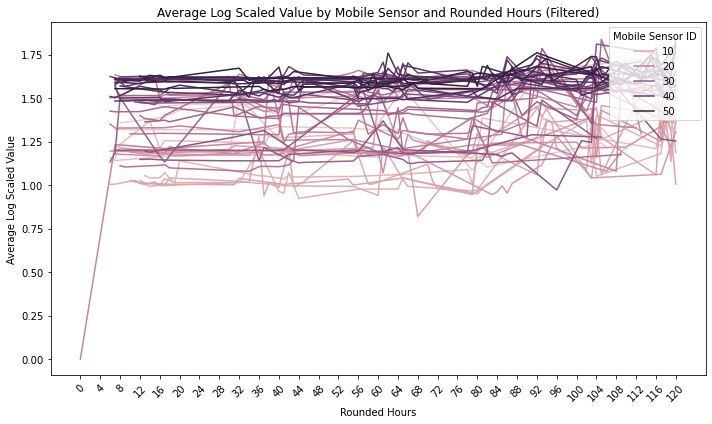

In [40]:
# Filter out the data points that exceed the threshold
filtered_mobile_df = mobile_df[mobile_df['LogScaledValue'] <= threshold]

# Create a line plot using Seaborn for mobile sensors with filtered data
plt.figure(figsize=(10, 6))
sns.lineplot(data=filtered_mobile_df, x='Rounded_Hours', y='LogScaledValue', hue='Sensor-id', estimator='mean', ci=None)
plt.xlabel('Rounded Hours')
plt.ylabel('Average Log Scaled Value')
plt.title('Average Log Scaled Value by Mobile Sensor and Rounded Hours (Filtered)')
# Adjust x-axis ticks for every 4 hours with rotation
plt.xticks(np.arange(0, int(filtered_mobile_df['Rounded_Hours'].max()) + 1, step=4), rotation=45)  
plt.tight_layout()
plt.legend(title='Mobile Sensor ID', loc='upper right')
#plt.savefig('avg_mobile_reading_by_hour.png', dpi=1000)
plt.show()

#fig.write_image('avg_mobile_reading_by_hour.png')


### *Timeseries of MAXIMUM Sensor Reading by Sensor and HOUR*

#### --------Static Sensors (un-filtered, combined plots)--------

In [41]:
# Define a custom aggregation function to get the maximum 'LogScaledValue' for each hour
def custom_agg_hour_max(group):
    return pd.Series({
        'Max_Value': group['LogScaledValue'].max()
    })

# Group by 'Sensor-id', 'Rounded_Hours', and apply the custom_agg_hour_max function to get the desired result
max_value_and_hours = static_df.groupby(['Sensor-id', 'Rounded_Hours']).apply(custom_agg_hour_max)

# Reset the MultiIndex to have a cleaner DataFrame
max_value_and_hours.reset_index(inplace=True)

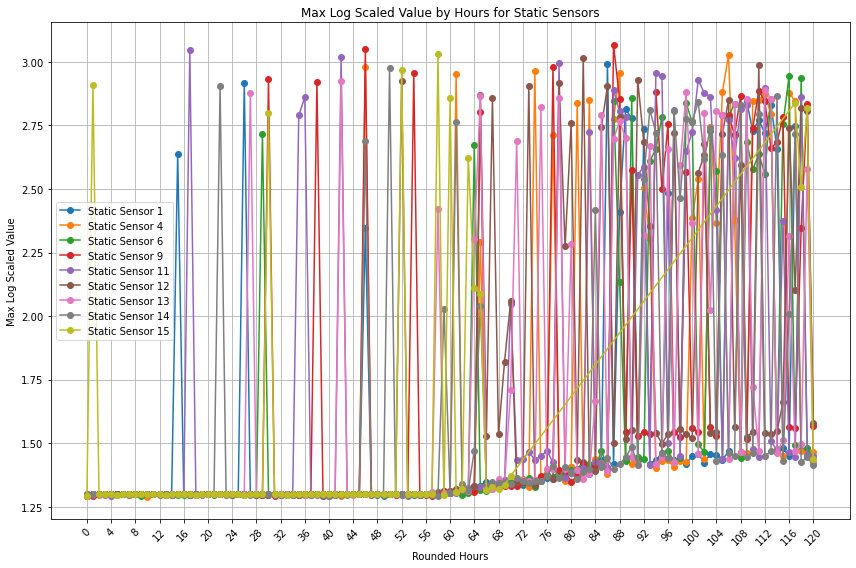

In [42]:
# Create a single plot to contain all lines
plt.figure(figsize=(12, 8))

# Plot the time series for each static sensor on the same plot
for sensor_id, sensor_group in max_value_and_hours.groupby('Sensor-id'):
    plt.plot(sensor_group['Rounded_Hours'], sensor_group['Max_Value'], marker='o', label=f'Static Sensor {sensor_id}')

plt.xlabel('Rounded Hours')
plt.ylabel('Max Log Scaled Value')
plt.title('Max Log Scaled Value by Hours for Static Sensors')
plt.grid(True)
plt.xticks(np.arange(0, int(static_df['Rounded_Hours'].max()) + 1, step=4), rotation=45)  # adjust x-axis ticks for every 4 hours with rotation
plt.tight_layout()
plt.legend()  # show legend with labels for each sensor
#plt.savefig('max_static_reading_by_hour_unfiltered.png', dpi=1000)
plt.show()


#### Static Sensors (filtered, individual plots)

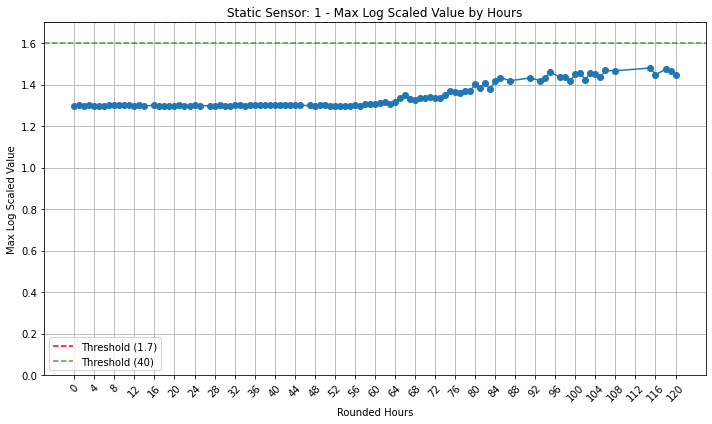

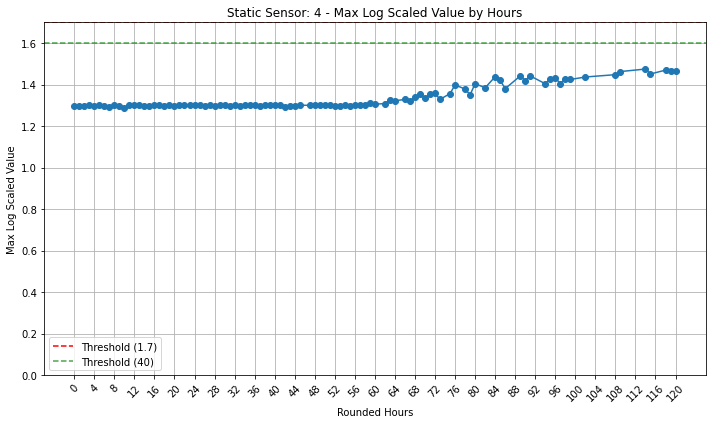

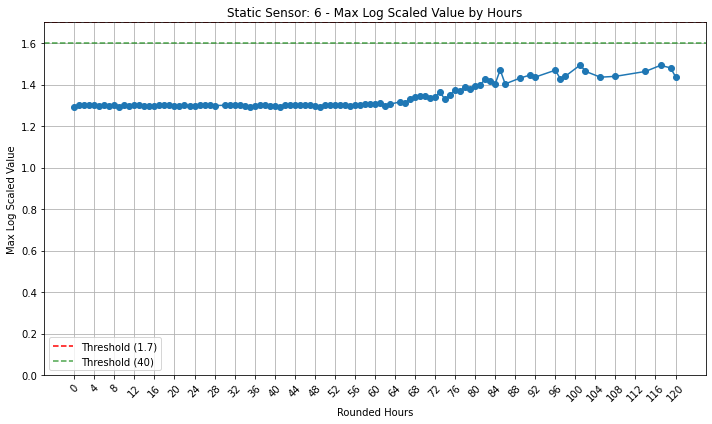

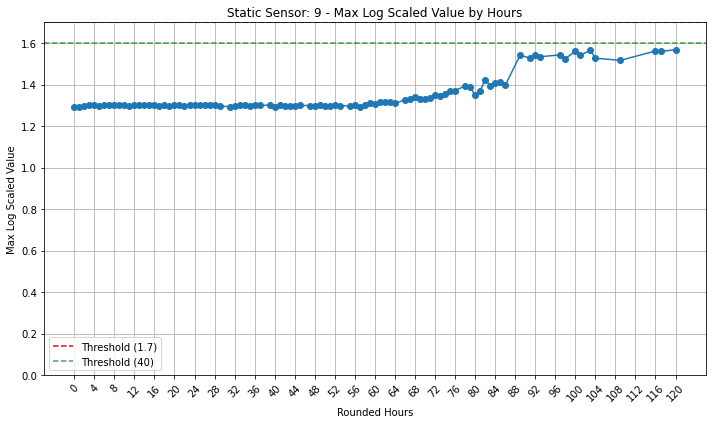

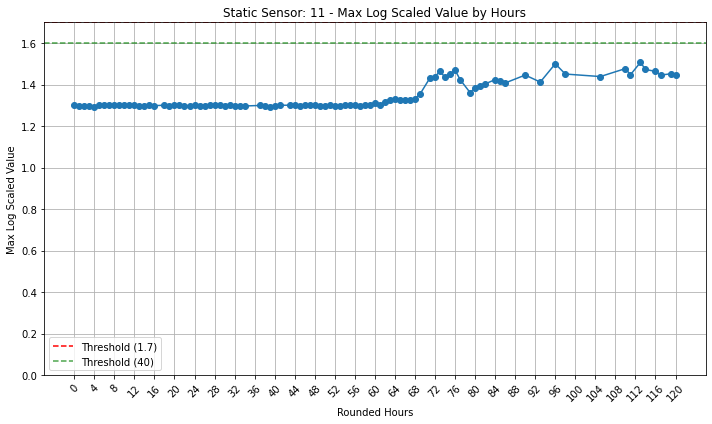

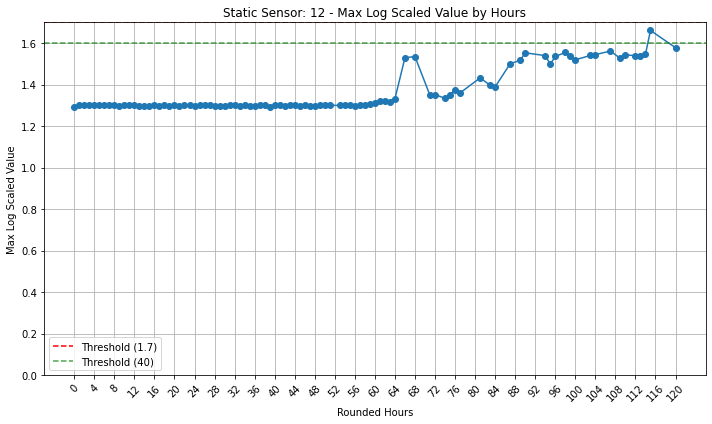

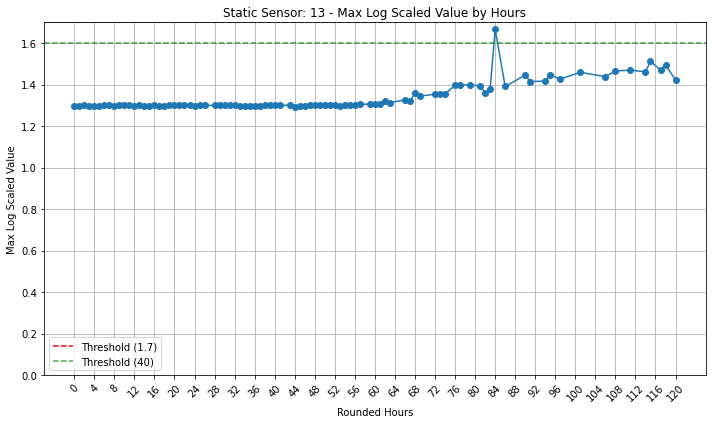

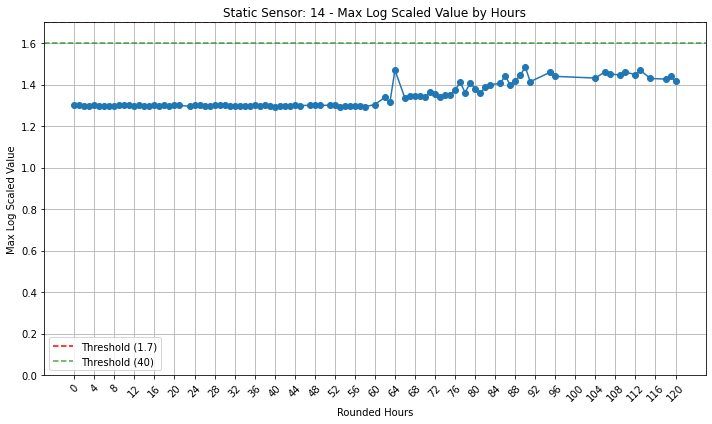

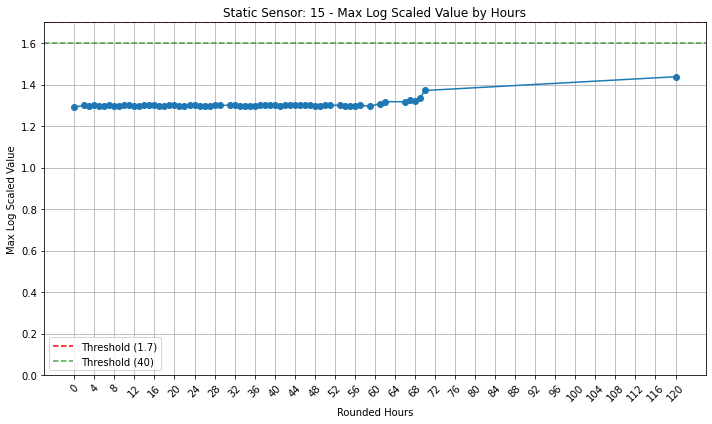

In [43]:
# Set the y-value threshold
y_value_threshold = 1.7

# Plot the time series for each static sensor
for sensor_id, sensor_group in max_value_and_hours.groupby('Sensor-id'):
    plt.figure(figsize=(10, 6))  # adjust the figure size as needed
    
    # Filter out values above the y-value threshold
    sensor_group_filtered = sensor_group[sensor_group['Max_Value'] <= y_value_threshold]
    
    plt.plot(sensor_group_filtered['Rounded_Hours'], sensor_group_filtered['Max_Value'], marker='o')
    plt.axhline(y=y_value_threshold, color='r', linestyle='--', label=f'Threshold ({y_value_threshold})')
    plt.axhline(y=1.60, color='g', linestyle='--', label='Threshold (40)', alpha=0.7)  # Add green dashed line at y = 40
    plt.xlabel('Rounded Hours')
    plt.ylabel('Max Log Scaled Value')
    plt.title(f'Static Sensor: {sensor_id} - Max Log Scaled Value by Hours')
    plt.grid(True)
    plt.xticks(np.arange(0, int(static_df['Rounded_Hours'].max()) + 1, step=4), rotation=45)  # adjust x-axis ticks for every 4 hours with rotation
    plt.legend()
    plt.ylim(0, y_value_threshold)
    plt.tight_layout()
    #plt.savefig(f'max_by_hour_static_{sensor_id}.png', bbox_inches='tight')
    plt.show()


#### Static Sensors (filtered, combined plots)

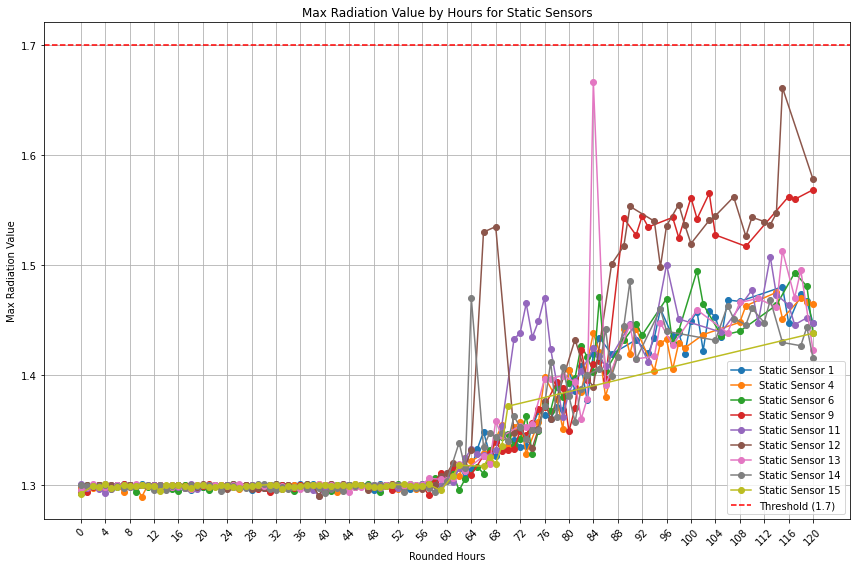

In [44]:
# Create a single plot to contain all lines
plt.figure(figsize=(12, 8))

# Plot the time series for each static sensor on the same plot
for sensor_id, sensor_group in max_value_and_hours.groupby('Sensor-id'):
    # Filter out values above the y-value threshold
    sensor_group_filtered = sensor_group[sensor_group['Max_Value'] <= y_value_threshold]
    
    plt.plot(sensor_group_filtered['Rounded_Hours'], sensor_group_filtered['Max_Value'], marker='o', label=f'Static Sensor {sensor_id}')

plt.axhline(y=y_value_threshold, color='r', linestyle='--', label=f'Threshold ({y_value_threshold})')
plt.xlabel('Rounded Hours')
plt.ylabel('Max Radiation Value')
plt.title('Max Radiation Value by Hours for Static Sensors')
plt.grid(True)
plt.xticks(np.arange(0, int(static_df['Rounded_Hours'].max()) + 1, step=4), rotation=45)  # Adjust x-axis ticks for every 4 hours with rotation
plt.tight_layout()
plt.legend()  # Show legend with labels for each sensor
#plt.savefig('max_static_reading_by_hour.png', dpi=1000)
plt.show()


##### Final 12 hours

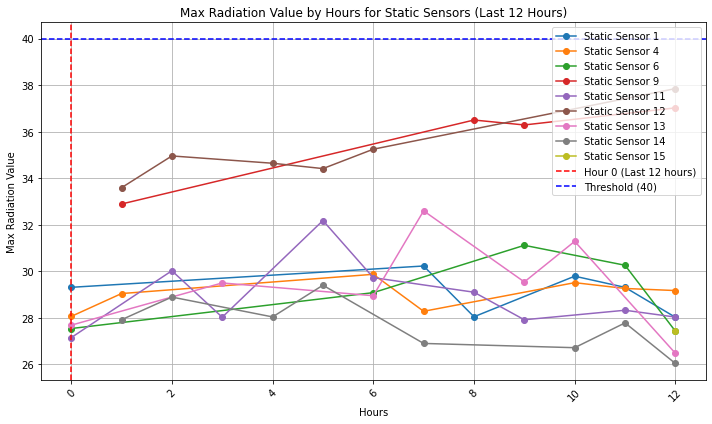

In [45]:
# Convert the 'Timestamp' column to a datetime type if it's not already
static_df['Timestamp'] = pd.to_datetime(static_df['Timestamp'])

# Calculate the number of hours since the start of the data collection
static_df['Hours_since_start'] = (static_df['Timestamp'] - static_df['Timestamp'].min()).dt.total_seconds() / 3600

# Filter data to include the last 12 hours
last_12_hours_data = static_df[static_df['Hours_since_start'] >= (static_df['Hours_since_start'].max() - 12)]

# Round the 'Hours_since_start' to the nearest hour
last_12_hours_data['Rounded_Hours'] = last_12_hours_data['Hours_since_start'].round()

# Define a custom aggregation function to get the maximum 'Value' for each hour
def custom_agg_hour_max(group):
    return pd.Series({
        'Max_Value': group['Value'].max()
    })

# Group by 'Sensor-id', 'Rounded_Hours', and apply the custom_agg_hour_max function to get the desired result
max_value_and_hours = last_12_hours_data.groupby(['Sensor-id', 'Rounded_Hours']).apply(custom_agg_hour_max)

# Reset the MultiIndex to have a cleaner DataFrame
max_value_and_hours.reset_index(inplace=True)

# Set the y-value threshold
y_value_threshold = 40

# Create a single plot to contain all lines
plt.figure(figsize=(10, 6))

# Plot the time series for each static sensor on the same plot
for sensor_id, sensor_group in max_value_and_hours.groupby('Sensor-id'):
    # Filter out values above the y-value threshold
    sensor_group_filtered = sensor_group[sensor_group['Max_Value'] <= y_value_threshold]
    
    # Adjust x-axis to start at the final 12 hours
    x_values = sensor_group_filtered['Rounded_Hours'] - (sensor_group_filtered['Rounded_Hours'].max() - 12)
    
    plt.plot(x_values, sensor_group_filtered['Max_Value'], marker='o', label=f'Static Sensor {sensor_id}')

plt.axvline(x=0, color='r', linestyle='--', label='Hour 0 (Last 12 hours)')
plt.axhline(y=y_value_threshold, color='b', linestyle='--', label=f'Threshold ({y_value_threshold})')
plt.xlabel('Hours')
plt.ylabel('Max Radiation Value')
plt.title('Max Radiation Value by Hours for Static Sensors (Last 12 Hours)')
plt.grid(True)
plt.xticks(rotation=45)  # Rotate the x-axis labels for readability
plt.tight_layout()
plt.legend()  # Show legend with labels for each sensor
plt.show()


#### --------Mobile Sensors (un-filtered, combined plots)--------

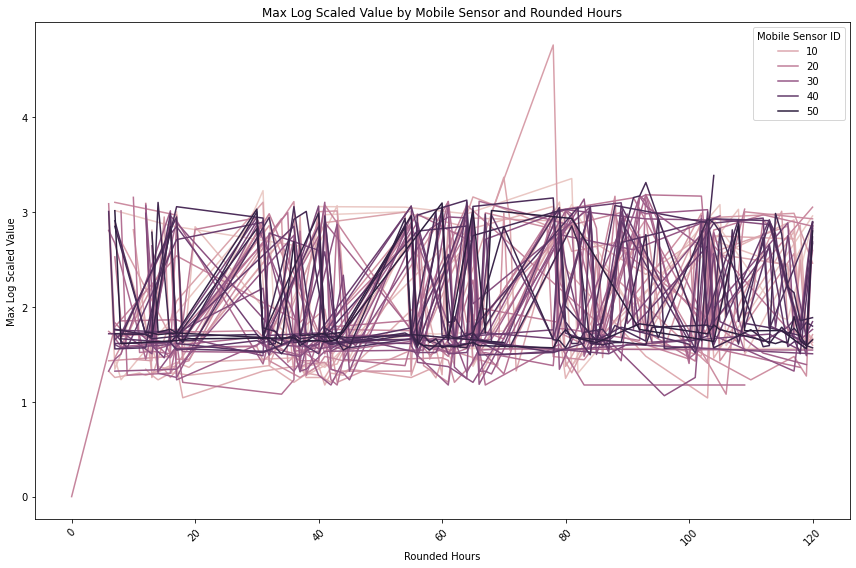

In [46]:
# Create a single figure for all plots
plt.figure(figsize=(12, 8))

# Create an empty list to store the data for all sensors
combined_data = []

# Iterate through each mobile sensor ID and add data to the combined list
for sensor_id in unique_mobile_sensor_ids:
    sensor_data = mobile_df[mobile_df['Sensor-id'] == sensor_id]
    
    # calculate the maximum value for each rounded hour
    max_values_by_hour = sensor_data.groupby('Rounded_Hours')['LogScaledValue'].max()  # Use 'LogScaledValue' column
    max_values_data = pd.DataFrame({'Rounded_Hours': max_values_by_hour.index, 'Max_LogScaledValue': max_values_by_hour.values})
    
    # add sensor data to the combined list
    max_values_data['Sensor ID'] = sensor_id
    combined_data.append(max_values_data)

# Concatenate the data in the list to create a combined DataFrame
combined_data_df = pd.concat(combined_data, ignore_index=True)

# Plot all the lines using sns.lineplot
sns.lineplot(data=combined_data_df, x='Rounded_Hours', y='Max_LogScaledValue', hue='Sensor ID', ci=None)

# Set labels and title
plt.xlabel('Rounded Hours')
plt.ylabel('Max Log Scaled Value')
plt.title('Max Log Scaled Value by Mobile Sensor and Rounded Hours')

# Adjust x-axis ticks for readability
plt.xticks(rotation=45)

# Add legend
plt.legend(title='Mobile Sensor ID', loc='upper right')

# Adjust layout and show the plot
plt.tight_layout()
#plt.savefig('max_mobile_reading_by_hour_unfiltered.png', dpi=1000)
plt.show()

#### Mobile Sensors (filtered, individual plots)

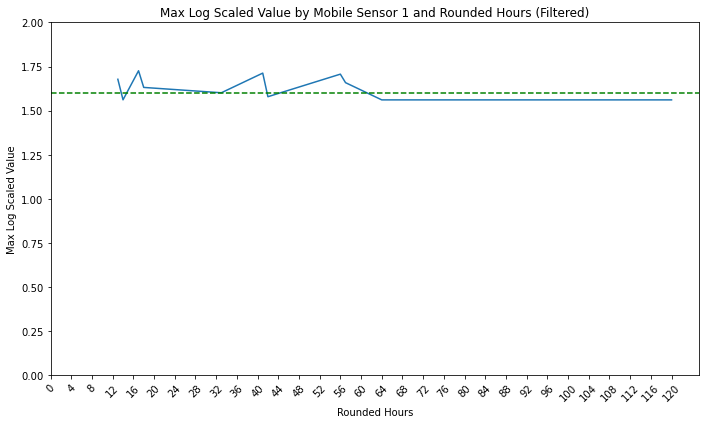

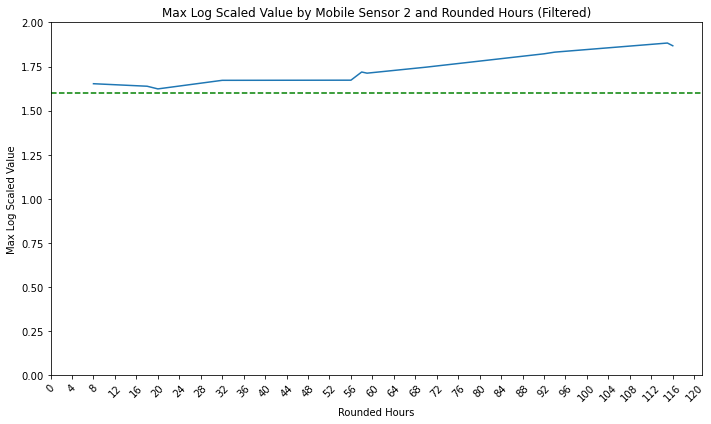

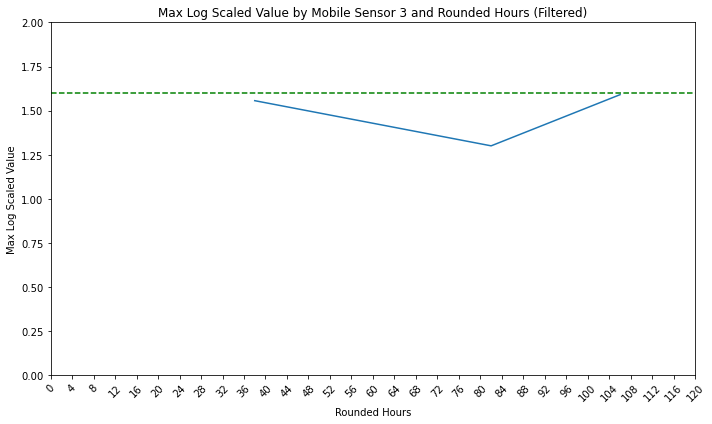

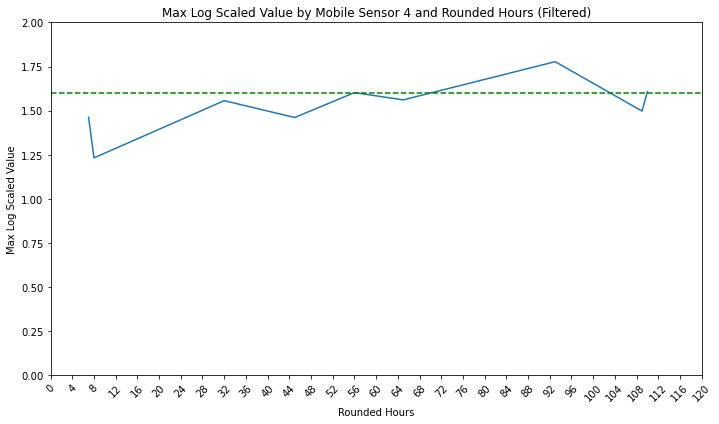

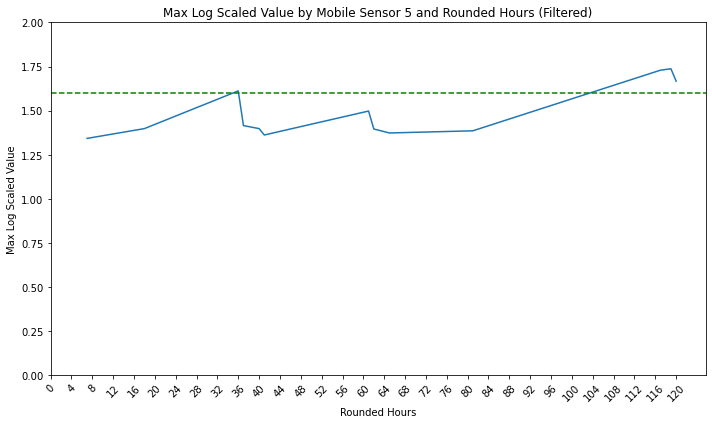

...

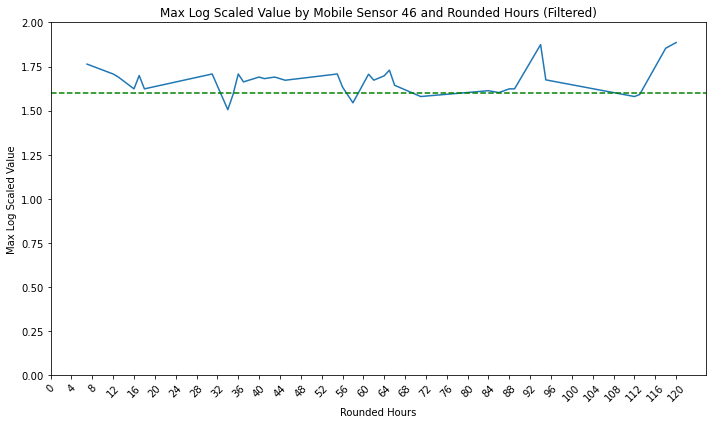

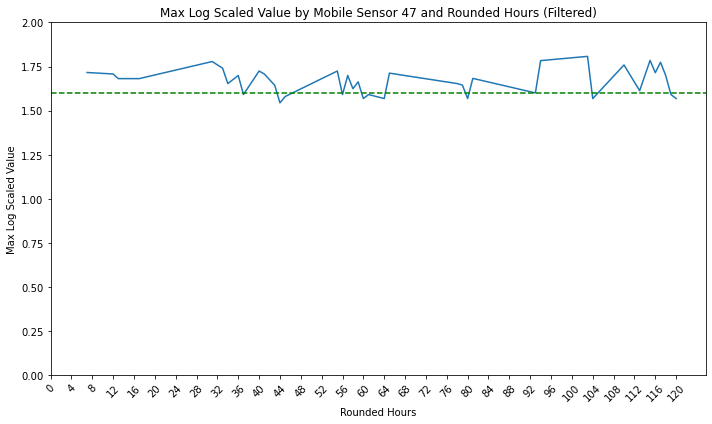

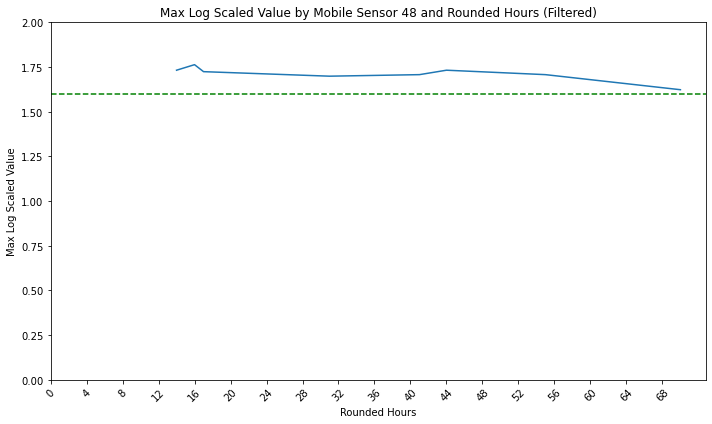

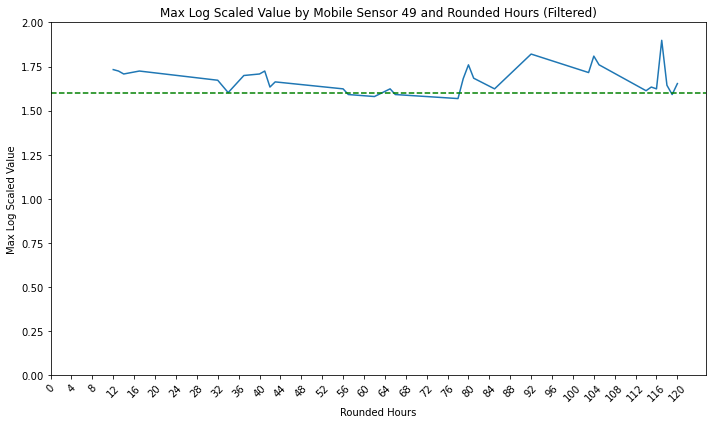

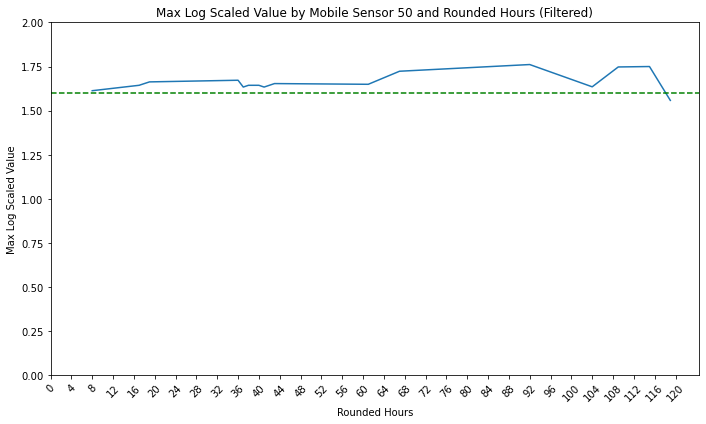

In [47]:
# Set the threshold value to identify spikes
threshold = 2.0  # adjust this threshold based on your data characteristics

# Iterate through each mobile sensor ID and create a separate plot
for sensor_id in unique_mobile_sensor_ids:
    sensor_data = mobile_df[mobile_df['Sensor-id'] == sensor_id]
    
    # calculate the maximum value for each rounded hour
    max_values_by_hour = sensor_data.groupby('Rounded_Hours')['LogScaledValue'].max()  # Use 'LogScaledValue' column
    max_values_data = pd.DataFrame({'Rounded_Hours': max_values_by_hour.index, 'Max_LogScaledValue': max_values_by_hour.values})
    
    # filter out the data points that exceed the threshold
    filtered_max_values_data = max_values_data[max_values_data['Max_LogScaledValue'] <= threshold]
    
    plt.figure(figsize=(10, 6))
    sns.lineplot(data=filtered_max_values_data, x='Rounded_Hours', y='Max_LogScaledValue', ci=None)
    plt.axhline(y=1.6, color='green', linestyle='--')  # Adjust the threshold value to its log-scaled equivalent
    plt.xlabel('Rounded Hours')
    plt.ylabel('Max Log Scaled Value')
    plt.title(f'Max Log Scaled Value by Mobile Sensor {sensor_id} and Rounded Hours (Filtered)')
    # adjust x-axis ticks for every 4 hours with rotation
    plt.xticks(np.arange(0, int(sensor_data['Rounded_Hours'].max()) + 1, step=4), rotation=45) 
    plt.tight_layout()
    plt.ylim(0, threshold)
    #plt.savefig(f'max_by_hour_mobile_{sensor_id}.png', bbox_inches='tight')
    plt.show()


#### Mobile Sensors (filtered, combined plots)

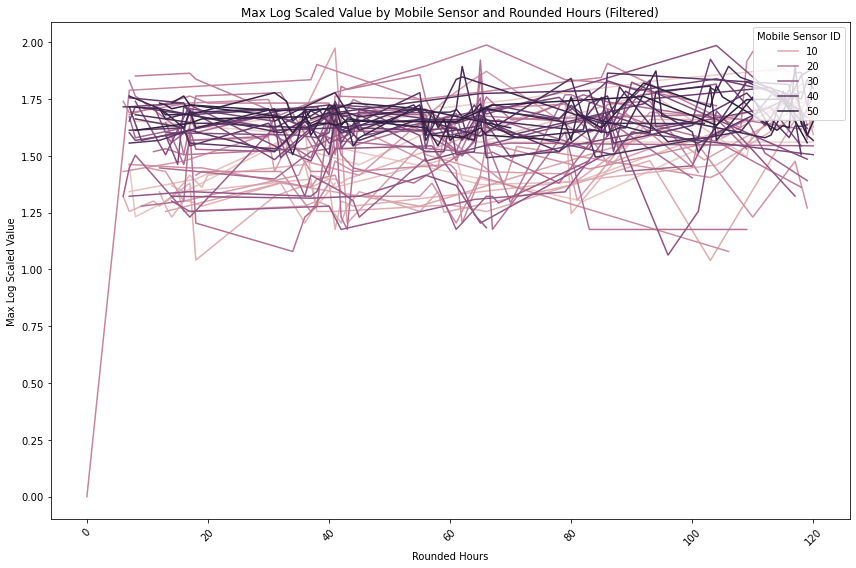

In [48]:
# Create a single figure for all plots
plt.figure(figsize=(12, 8))

# Create an empty list to store the data for all sensors
combined_data = []

# Iterate through each mobile sensor ID and add data to the combined list
for sensor_id in unique_mobile_sensor_ids:
    sensor_data = mobile_df[mobile_df['Sensor-id'] == sensor_id]
    
    # calculate the maximum value for each rounded hour
    max_values_by_hour = sensor_data.groupby('Rounded_Hours')['LogScaledValue'].max()  # Use 'LogScaledValue' column
    max_values_data = pd.DataFrame({'Rounded_Hours': max_values_by_hour.index, 'Max_LogScaledValue': max_values_by_hour.values})
    
    # filter out the data points that exceed the threshold
    filtered_max_values_data = max_values_data[max_values_data['Max_LogScaledValue'] <= threshold]
    
    # add sensor data to the combined list
    filtered_max_values_data['Sensor ID'] = sensor_id
    combined_data.append(filtered_max_values_data)

# Concatenate the data in the list to create a combined DataFrame
combined_data_df = pd.concat(combined_data, ignore_index=True)

# Plot all the lines using sns.lineplot
sns.lineplot(data=combined_data_df, x='Rounded_Hours', y='Max_LogScaledValue', hue='Sensor ID', ci=None)

# Set labels and title
plt.xlabel('Rounded Hours')
plt.ylabel('Max Log Scaled Value')
plt.title('Max Log Scaled Value by Mobile Sensor and Rounded Hours (Filtered)')

# Adjust x-axis ticks for readability
plt.xticks(rotation=45)

# Add legend
plt.legend(title='Mobile Sensor ID', loc='upper right')

# Adjust layout and show the plot
plt.tight_layout()
#plt.savefig('max_mobile_reading_by_hour.png', dpi=1000)
plt.show()


##### Final 12 hours

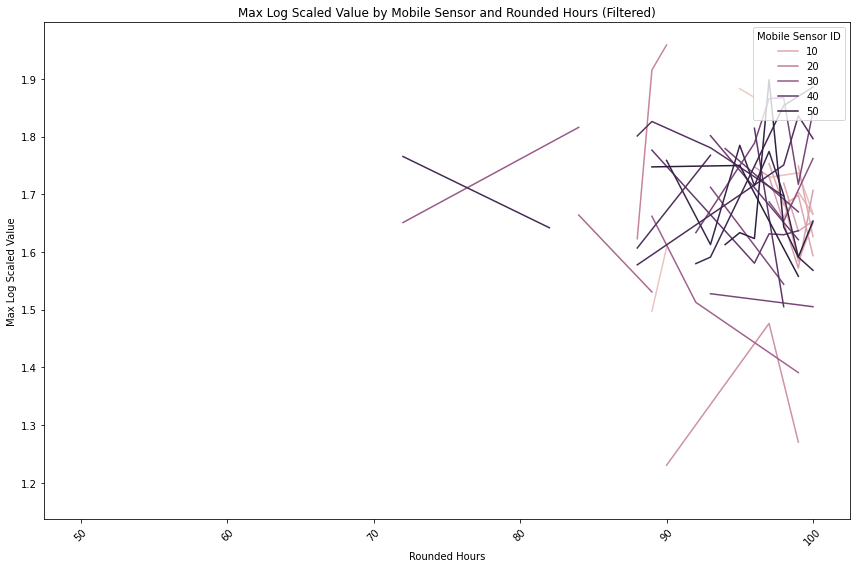

In [49]:
# Create a single figure for all plots
plt.figure(figsize=(12, 8))

# Create an empty list to store the data for all sensors
combined_data = []

# Iterate through each mobile sensor ID and add data to the combined list
for sensor_id in unique_mobile_sensor_ids:
    sensor_data = mobile_df[mobile_df['Sensor-id'] == sensor_id]
    
    # Filter data for the final 12 hours
    final_12_hours_data = sensor_data[sensor_data['Hours_since_start'] >= (sensor_data['Hours_since_start'].max() - 12)]
    
    # Calculate the maximum value for each rounded hour
    max_values_by_hour = final_12_hours_data.groupby('Rounded_Hours')['LogScaledValue'].max()  # Use 'LogScaledValue' column
    max_values_data = pd.DataFrame({'Rounded_Hours': max_values_by_hour.index, 'Max_LogScaledValue': max_values_by_hour.values})
    
    # Filter out the data points that exceed the threshold
    filtered_max_values_data = max_values_data[max_values_data['Max_LogScaledValue'] <= threshold]
    
    # Add sensor data to the combined list
    filtered_max_values_data['Sensor ID'] = sensor_id
    combined_data.append(filtered_max_values_data)

# Concatenate the data in the list to create a combined DataFrame
combined_data_df = pd.concat(combined_data, ignore_index=True)

# Adjust x-values to start at hour 100
combined_data_df['Rounded_Hours'] = combined_data_df['Rounded_Hours'] - (combined_data_df['Rounded_Hours'].max() - 100)

# Plot all the lines using sns.lineplot
sns.lineplot(data=combined_data_df, x='Rounded_Hours', y='Max_LogScaledValue', hue='Sensor ID', ci=None)

# Set labels and title
plt.xlabel('Rounded Hours')
plt.ylabel('Max Log Scaled Value')
plt.title('Max Log Scaled Value by Mobile Sensor and Rounded Hours (Filtered)')

# Adjust x-axis ticks for readability
plt.xticks(rotation=45)

# Add legend
plt.legend(title='Mobile Sensor ID', loc='upper right')

# Adjust layout and show the plot
plt.tight_layout()
plt.show()


### *Mobile Sensor Readings by Date and Location* (Paths)


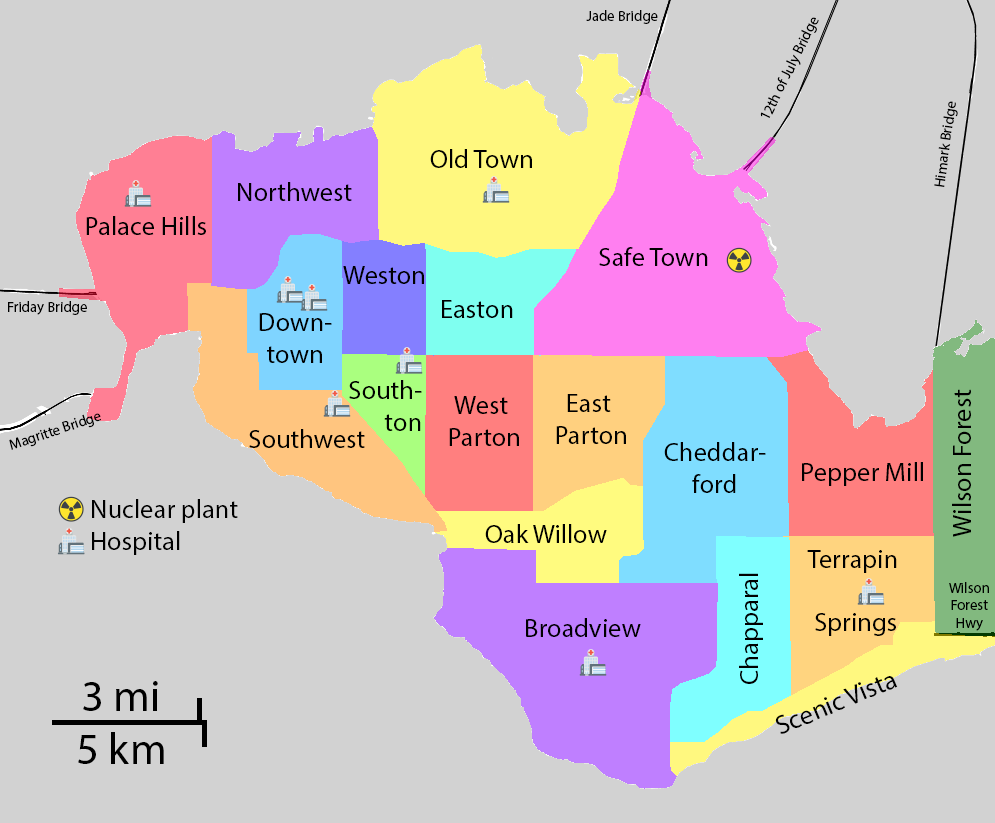

In [50]:
# Create a dataset for a single sensor to plot its entire path by hour
sensor_id_to_plot = 1  # Change this to the desired Sensor-id
mobile_data = mobile_df[mobile_df['Sensor-id'] == sensor_id_to_plot]

# Set the threshold value
threshold_value = 120

# Filter out values above the threshold value
mobile_data_filtered = mobile_data[mobile_data['Value'] <= threshold_value]

# Create the figure
fig = px.imshow(image)

# Create the hover text with "Timestamp", "Value", and "Sensor-id" for the mobile sensor path
line_hover_text = mobile_data_filtered.apply(lambda row: f"Sensor-id: {row['Sensor-id']}<br>Timestamp: {row['Timestamp']}<br>Value: {row['Value']:.2f}", 
                                             axis=1)

# Define the color for the start and end points
start_color = 'purple'
end_color = 'red'

# Add the lines representing a user's path by hour
scatter = go.Scatter(
    x=mobile_data_filtered['x'],
    y=mobile_data_filtered['y'],
    mode='markers',
    marker=dict(color=mobile_data_filtered['Value'], 
                colorscale="Viridis", 
                showscale=True, 
                cmin=0, 
                cmax=threshold_value),  # Adjusted cmax to threshold_value
    text=line_hover_text,
    hoverinfo='text',
    name=""
)

fig.add_trace(scatter)

# Add the start and end points with custom colors
fig.add_trace(go.Scatter(x=[mobile_data_filtered['x'].iloc[0]], y=[mobile_data_filtered['y'].iloc[0]], 
                         mode='markers', 
                         marker=dict(color=start_color, size=8),
                         showlegend=False)
              )

fig.add_trace(go.Scatter(x=[mobile_data_filtered['x'].iloc[-1]], y=[mobile_data_filtered['y'].iloc[-1]], 
                         mode='markers', 
                         marker=dict(color=end_color, size=8),
                         showlegend=False)
              )


# Create the hover text with both coordinates and Sensor-id
hover_text = stationary_sensor_location.apply(lambda row: f"Sensor-id: {row['Sensor-id']}<br>Lat: {row['Lat']}<br>Long: {row['Long']}", axis=1)

# Add the static sensor locations as black dots with hover text
fig.add_trace(go.Scatter(x=stationary_sensor_location['x'], y=stationary_sensor_location['y'], 
                         mode='markers', marker=dict(color='black', size=8), 
                         text=hover_text, 
                         hoverinfo='text', showlegend=False))

# Update the layout to remove axis ticks and labels and set the default figure size
fig.update_layout(xaxis_showgrid=False, yaxis_showgrid=False, 
                  xaxis_zeroline=False, yaxis_zeroline=False,
                  xaxis_showticklabels=False, yaxis_showticklabels=False,
                  width=900, height=700)

# Show the plot
fig.show()

#fig.write_image('mobile_readings_path_by_date.png')


#### Checking Uncertainty in mobile sensor 44

In [51]:


# Create a new DataFrame with data from static sensor 9
static_sensor_9_data = static_df[static_df['Sensor-id'] == 9]

# Convert the 'Timestamp' column to datetime format
static_sensor_9_data['Timestamp'] = pd.to_datetime(static_sensor_9_data['Timestamp'])

# Filter the new DataFrame for timestamps starting with "14"
static_sensor_9_data_starting_with_14 = static_sensor_9_data[static_sensor_9_data['Timestamp'].dt.strftime('%H').str.startswith("14")]

# Display the distribution of radiation values with timestamps starting with "14"
print("Distribution of Radiation Values for Static Sensor 9 with Timestamps starting with '14':")
for index, row in static_sensor_9_data_starting_with_14.iterrows():
    timestamp = row['Timestamp']
    value = row['Value']
    print(f"Timestamp: {timestamp}, Value: {value}")


Distribution of Radiation Values for Static Sensor 9 with Timestamps starting with '14':
Timestamp: 2020-04-06 14:00:00, Value: 16.809
Timestamp: 2020-04-06 14:00:00, Value: 13.343
Timestamp: 2020-04-06 14:00:00, Value: 13.705
Timestamp: 2020-04-06 14:00:00, Value: 18.601
Timestamp: 2020-04-06 14:00:00, Value: 14.498
Timestamp: 2020-04-06 14:00:00, Value: 14.116
Timestamp: 2020-04-06 14:00:00, Value: 13.571
Timestamp: 2020-04-06 14:00:00, Value: 11.158
Timestamp: 2020-04-06 14:00:00, Value: 13.942
Timestamp: 2020-04-06 14:00:00, Value: 17.991
Timestamp: 2020-04-06 14:00:00, Value: 12.982
Timestamp: 2020-04-06 14:00:00, Value: 12.135
Timestamp: 2020-04-06 14:01:00, Value: 15.89
Timestamp: 2020-04-06 14:01:00, Value: 18.053
Timestamp: 2020-04-06 14:01:00, Value: 16.278
Timestamp: 2020-04-06 14:01:00, Value: 14.025
Timestamp: 2020-04-06 14:01:00, Value: 11.714
Timestamp: 2020-04-06 14:01:00, Value: 12.782
Timestamp: 2020-04-06 14:01:00, Value: 13.946
Timestamp: 2020-04-06 14:01:00, Value:

Timestamp: 2020-04-07 14:46:00, Value: 15.756
Timestamp: 2020-04-07 14:46:00, Value: 15.758
Timestamp: 2020-04-07 14:46:00, Value: 14.611
Timestamp: 2020-04-07 14:46:00, Value: 13.628
Timestamp: 2020-04-07 14:46:00, Value: 14.617
Timestamp: 2020-04-07 14:46:00, Value: 13.307
Timestamp: 2020-04-07 14:46:00, Value: 15.711
Timestamp: 2020-04-07 14:46:00, Value: 13.679
Timestamp: 2020-04-07 14:46:00, Value: 13.367
Timestamp: 2020-04-07 14:46:00, Value: 17.496
Timestamp: 2020-04-07 14:46:00, Value: 14.141
Timestamp: 2020-04-07 14:47:00, Value: 15.565
Timestamp: 2020-04-07 14:47:00, Value: 12.188
Timestamp: 2020-04-07 14:47:00, Value: 14.799
Timestamp: 2020-04-07 14:47:00, Value: 11.407
Timestamp: 2020-04-07 14:47:00, Value: 15.972
Timestamp: 2020-04-07 14:47:00, Value: 17.672
Timestamp: 2020-04-07 14:47:00, Value: 15.275
Timestamp: 2020-04-07 14:47:00, Value: 14.617
Timestamp: 2020-04-07 14:47:00, Value: 17.772
Timestamp: 2020-04-07 14:47:00, Value: 12.942
Timestamp: 2020-04-07 14:47:00, Va

Timestamp: 2020-04-09 14:36:00, Value: 12.565
Timestamp: 2020-04-09 14:36:00, Value: 21.2
Timestamp: 2020-04-09 14:36:00, Value: 8.5
Timestamp: 2020-04-09 14:36:00, Value: 18.558
Timestamp: 2020-04-09 14:36:00, Value: 15.329
Timestamp: 2020-04-09 14:36:00, Value: 17.977
Timestamp: 2020-04-09 14:36:00, Value: 6.896
Timestamp: 2020-04-09 14:36:00, Value: 17.812
Timestamp: 2020-04-09 14:36:00, Value: 13.349
Timestamp: 2020-04-09 14:36:00, Value: 20.547
Timestamp: 2020-04-09 14:37:00, Value: 16.116
Timestamp: 2020-04-09 14:37:00, Value: 13.841
Timestamp: 2020-04-09 14:37:00, Value: 15.0
Timestamp: 2020-04-09 14:37:00, Value: 16.828
Timestamp: 2020-04-09 14:37:00, Value: 17.309
Timestamp: 2020-04-09 14:37:00, Value: 9.615
Timestamp: 2020-04-09 14:37:00, Value: 13.509
Timestamp: 2020-04-09 14:37:00, Value: 17.096
Timestamp: 2020-04-09 14:37:00, Value: 8.765
Timestamp: 2020-04-09 14:37:00, Value: 15.045
Timestamp: 2020-04-09 14:37:00, Value: 11.387
Timestamp: 2020-04-09 14:37:00, Value: 13.63

In [52]:
# Create a new DataFrame with data from static sensor 13
static_sensor_13_data = static_df[static_df['Sensor-id'] == 13]

# Convert the 'Timestamp' column to datetime format (if not already)
static_sensor_13_data['Timestamp'] = pd.to_datetime(static_sensor_13_data['Timestamp'])

# Filter the new DataFrame for timestamps starting with "06"
static_sensor_13_data_starting_with_06 = static_sensor_13_data[static_sensor_13_data['Timestamp'].dt.strftime('%H').str.startswith("06")]

# Display the distribution of values with timestamps starting with "06" for static sensor 13
print("Distribution of Values for Static Sensor 13 with Timestamps starting with '06':")
for index, row in static_sensor_13_data_starting_with_06.iterrows():
    timestamp = row['Timestamp']
    value = row['Value']
    print(f"Timestamp: {timestamp}, Value: {value}")

Distribution of Values for Static Sensor 13 with Timestamps starting with '06':
Timestamp: 2020-04-06 06:00:00, Value: 19.092
Timestamp: 2020-04-06 06:00:00, Value: 14.527
Timestamp: 2020-04-06 06:00:00, Value: 14.473
Timestamp: 2020-04-06 06:00:00, Value: 15.983
Timestamp: 2020-04-06 06:00:00, Value: 12.792
Timestamp: 2020-04-06 06:00:00, Value: 13.12
Timestamp: 2020-04-06 06:00:00, Value: 14.769
Timestamp: 2020-04-06 06:00:00, Value: 12.381
Timestamp: 2020-04-06 06:00:00, Value: 17.893
Timestamp: 2020-04-06 06:00:00, Value: 18.98
Timestamp: 2020-04-06 06:00:00, Value: 10.445
Timestamp: 2020-04-06 06:00:00, Value: 12.37
Timestamp: 2020-04-06 06:01:00, Value: 16.749
Timestamp: 2020-04-06 06:01:00, Value: 13.388
Timestamp: 2020-04-06 06:01:00, Value: 10.622
Timestamp: 2020-04-06 06:01:00, Value: 13.083
Timestamp: 2020-04-06 06:01:00, Value: 14.127
Timestamp: 2020-04-06 06:01:00, Value: 15.595
Timestamp: 2020-04-06 06:01:00, Value: 15.118
Timestamp: 2020-04-06 06:01:00, Value: 12.983
Tim

Timestamp: 2020-04-07 06:44:00, Value: 17.457
Timestamp: 2020-04-07 06:44:00, Value: 13.608
Timestamp: 2020-04-07 06:44:00, Value: 11.919
Timestamp: 2020-04-07 06:44:00, Value: 12.794
Timestamp: 2020-04-07 06:44:00, Value: 16.8
Timestamp: 2020-04-07 06:44:00, Value: 14.486
Timestamp: 2020-04-07 06:44:00, Value: 13.595
Timestamp: 2020-04-07 06:44:00, Value: 15.65
Timestamp: 2020-04-07 06:44:00, Value: 14.604
Timestamp: 2020-04-07 06:44:00, Value: 16.207
Timestamp: 2020-04-07 06:44:00, Value: 17.501
Timestamp: 2020-04-07 06:45:00, Value: 14.467
Timestamp: 2020-04-07 06:45:00, Value: 13.969
Timestamp: 2020-04-07 06:45:00, Value: 14.846
Timestamp: 2020-04-07 06:45:00, Value: 11.003
Timestamp: 2020-04-07 06:45:00, Value: 14.547
Timestamp: 2020-04-07 06:45:00, Value: 13.697
Timestamp: 2020-04-07 06:45:00, Value: 15.219
Timestamp: 2020-04-07 06:45:00, Value: 12.242
Timestamp: 2020-04-07 06:45:00, Value: 10.255
Timestamp: 2020-04-07 06:45:00, Value: 13.412
Timestamp: 2020-04-07 06:45:00, Value

Timestamp: 2020-04-09 06:28:00, Value: 10.433
Timestamp: 2020-04-09 06:28:00, Value: 13.919
Timestamp: 2020-04-09 06:28:00, Value: 10.916
Timestamp: 2020-04-09 06:28:00, Value: 18.46
Timestamp: 2020-04-09 06:28:00, Value: 13.836
Timestamp: 2020-04-09 06:28:00, Value: 13.231
Timestamp: 2020-04-09 06:28:00, Value: 13.774
Timestamp: 2020-04-09 06:28:00, Value: 21.037
Timestamp: 2020-04-09 06:29:00, Value: 16.051
Timestamp: 2020-04-09 06:29:00, Value: 18.692
Timestamp: 2020-04-09 06:29:00, Value: 17.676
Timestamp: 2020-04-09 06:29:00, Value: 11.114
Timestamp: 2020-04-09 06:29:00, Value: 15.85
Timestamp: 2020-04-09 06:29:00, Value: 13.688
Timestamp: 2020-04-09 06:29:00, Value: 18.182
Timestamp: 2020-04-09 06:29:00, Value: 19.284
Timestamp: 2020-04-09 06:29:00, Value: 17.209
Timestamp: 2020-04-09 06:29:00, Value: 11.864
Timestamp: 2020-04-09 06:29:00, Value: 13.118
Timestamp: 2020-04-09 06:29:00, Value: 11.566
Timestamp: 2020-04-09 06:30:00, Value: 17.089
Timestamp: 2020-04-09 06:30:00, Valu

### *Mobile Sensor Readings by Hour and Location*


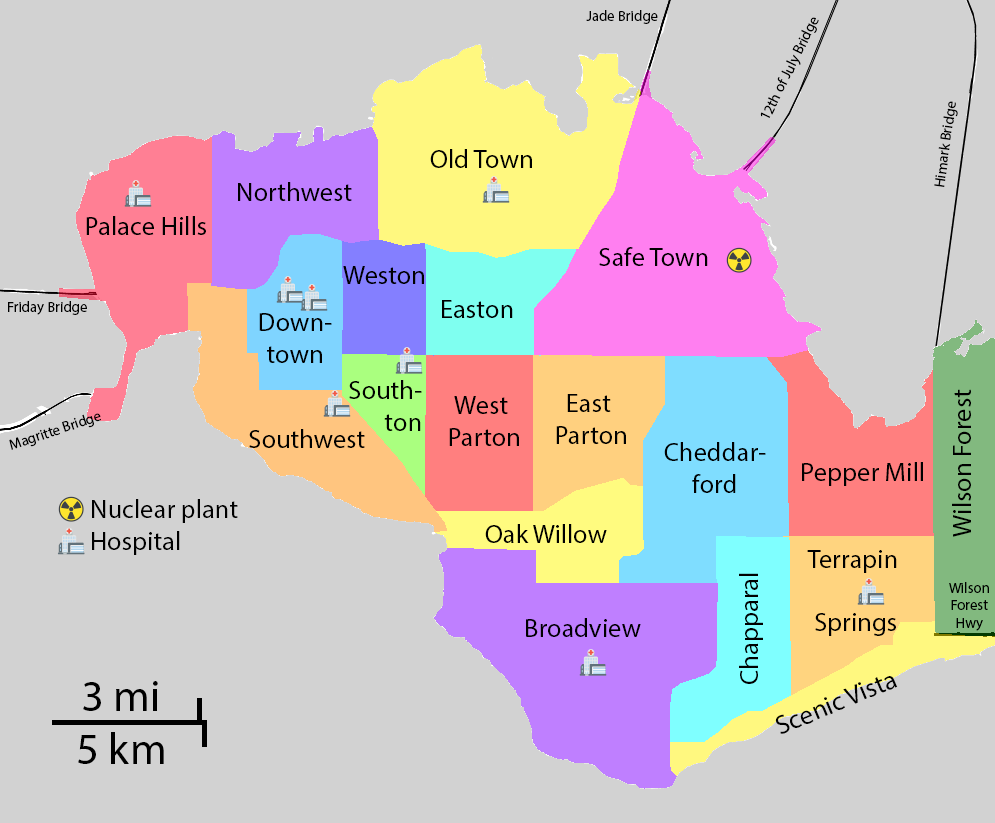

In [53]:
# Create a dataset for a single sensor to plot its entire path by hour
sensor_id_to_plot = 44  # Change this to the desired Sensor-id

mobile_data = mobile_df[mobile_df['Sensor-id'] == sensor_id_to_plot]

# Set the threshold value
threshold_value = 100

# Filter out values above the threshold value
mobile_data_filtered = mobile_data[mobile_data['Value'] <= threshold_value]

# Create the figure
fig = px.imshow(image)

# Create the hover text with "Hours_since_start", "Value", and "Sensor-id" for the mobile sensor path
line_hover_text = mobile_data_filtered.apply(lambda row: f"Sensor-id: {row['Sensor-id']}<br>Hours: {row['Hours_since_start']:.2f}<br>Value: {row['Value']:.2f}", 
                                             axis=1)

# Define the color for the start and end points
start_color = 'purple'
end_color = 'red'

# Add the lines representing a user's path by hour
scatter = go.Scatter(
    x=mobile_data_filtered['x'],
    y=mobile_data_filtered['y'],
    mode='markers',
    marker=dict(color=mobile_data_filtered['Value'], 
                colorscale="Viridis", 
                showscale=True, 
                cmin=0, 
                cmax=threshold_value),  # Adjusted cmax to threshold_value
    text=line_hover_text,
    hoverinfo='text',
    name=""
)

fig.add_trace(scatter)

# Add the start and end points with custom colors
fig.add_trace(go.Scatter(x=[mobile_data_filtered['x'].iloc[0]], y=[mobile_data_filtered['y'].iloc[0]], 
                         mode='markers', 
                         marker=dict(color=start_color, size=8),
                         showlegend=False)
              )

fig.add_trace(go.Scatter(x=[mobile_data_filtered['x'].iloc[-1]], y=[mobile_data_filtered['y'].iloc[-1]], 
                         mode='markers', 
                         marker=dict(color=end_color, size=8),
                         showlegend=False)
              )


# Create the hover text with both coordinates and Sensor-id
hover_text = stationary_sensor_location.apply(lambda row: f"Sensor-id: {row['Sensor-id']}<br>Lat: {row['Lat']}<br>Long: {row['Long']}", axis=1)

# Add the static sensor locations as black dots with hover text
fig.add_trace(go.Scatter(x=stationary_sensor_location['x'], y=stationary_sensor_location['y'], 
                         mode='markers', marker=dict(color='black', size=8), 
                         text=hover_text, 
                         hoverinfo='text', showlegend=False))

# Update the layout to remove axis ticks and labels and set the default figure size
fig.update_layout(xaxis_showgrid=False, yaxis_showgrid=False, 
                  xaxis_zeroline=False, yaxis_zeroline=False,
                  xaxis_showticklabels=False, yaxis_showticklabels=False,
                  width=900, height=700)

# Show the plot
fig.show()

#fig.write_image('mobile_readings_path_by_hours.png')


### *Geographic Plot of Average Radiation Levels by Area*

In [54]:
mobile_df.head()

,x,y,Timestamp,Sensor-id,Long,Lat,Value,Units,User-id,LogScaledValue,Hours_since_start,Rounded_Hours
0,0.172594,289.296133,2020-04-10 08:12:50,2,-119.999950,0.154719,55.900667,cpm,TestUnit,1.747417,104.213889,104.0
1,0.410773,289.965337,2020-04-10 08:12:45,2,-119.999881,0.154525,65.439403,cpm,TestUnit,1.815839,104.212500,104.0
2,0.479811,288.989128,2020-04-09 09:04:45,2,-119.999861,0.154808,41.404731,cpm,TestUnit,1.617050,81.079167,81.0
3,1.028659,289.423765,2020-04-07 13:55:25,50,-119.999702,0.154682,32.000000,cpm,MySensor,1.505150,37.923611,38.0
4,1.146023,289.240941,2020-04-09 09:04:40,2,-119.999668,0.154735,50.292327,cpm,TestUnit,1.701502,81.077778,81.0



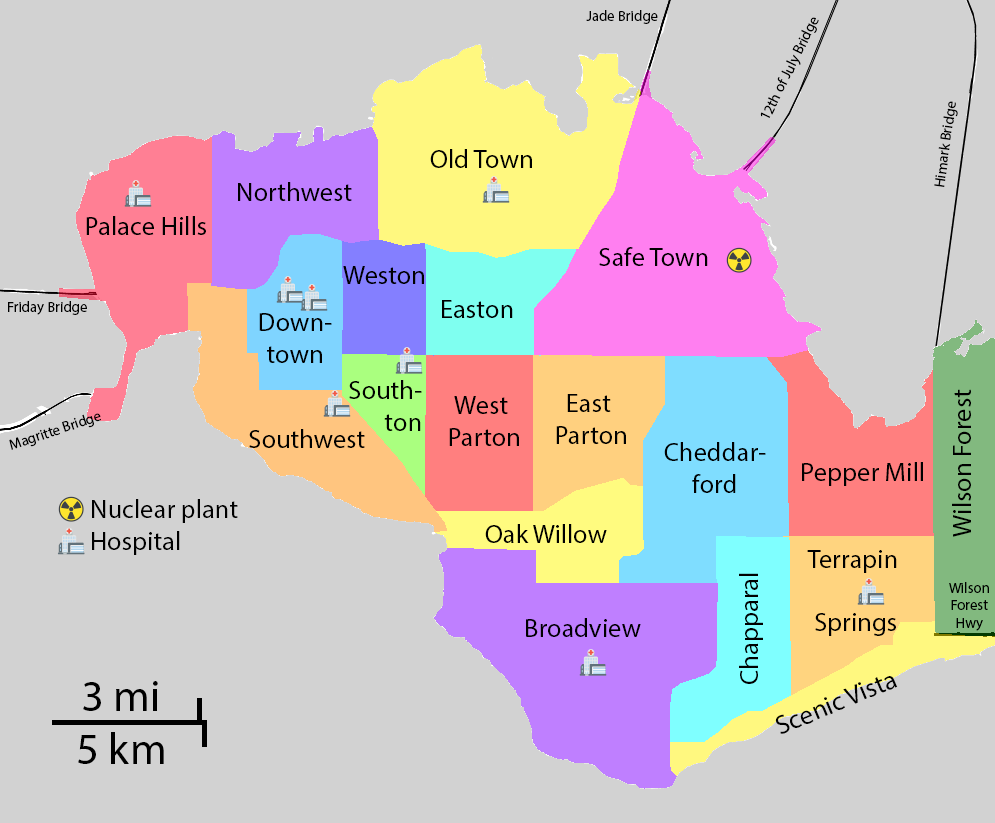

Small fraction of background < 1.00 cpm 
Artiicial Source (medical equipment) = 1.20 cpm 
Normal background from natural source < 40.0-60.0 cpm 
Safe < 150 cpm 
Max dose of uranium miner < 200 cpm 
Low cancer risk > 500.3 cpm 
 Occupational regulation = 1000.68 cpm 



In [56]:
# Calculate the min and max values of the converted x and y coordinates
x_min, x_max = mobile_df['x'].min(), mobile_df['x'].max()
y_min, y_max = mobile_df['y'].min(), mobile_df['y'].max()

# Define the number of cuts
num_cuts = 50

# Calculate the width and height of each cut
x_cut_width = (x_max - x_min) / num_cuts
y_cut_height = (y_max - y_min) / num_cuts

# Calculate the IQR for the 'Value' column
Q1 = mobile_df['Value'].quantile(0.25)
Q3 = mobile_df['Value'].quantile(0.75)
IQR = Q3 - Q1

# Define lower and upper bounds for outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Filter out rows with 'Value' outside the IQR range
mobile_df_filtered = mobile_df[(mobile_df['Value'] >= lower_bound) & (mobile_df['Value'] <= upper_bound)]

# Assign each data point to a cut based on x and y coordinates
mobile_df_filtered['x_cut'] = ((mobile_df_filtered['x'] - x_min) // x_cut_width).astype(int)
mobile_df_filtered['y_cut'] = ((mobile_df_filtered['y'] - y_min) // y_cut_height).astype(int)

# Group the data by the cut (x_cut and y_cut) and calculate the mean for each group
grouped_means = mobile_df_filtered.groupby(['x_cut', 'y_cut']).mean()

# Reset index to make DataFrame cleaner
grouped_means.reset_index(inplace=True)

# Calculate the unique mean values and sort them
unique_mean_values = np.sort(grouped_means['Value'].unique())

# Create a custom colorscale with a wider range of colors
colors = cm.RdYlBu(np.linspace(0, 1, len(unique_mean_values)))

# Create a dictionary to map mean values to colors
colorscale_dict = {value: color for value, color in zip(unique_mean_values, colors)}

# Create the figure
fig = px.imshow(image)

# Add the red lines on the image (if needed)
fig.add_trace(go.Scatter(x=[x1, x2], y=[y1, y2], line=dict(color="red", width=2), showlegend=False))
fig.add_trace(go.Scatter(x=[x2, x3], y=[y2, y3], line=dict(color="red", width=2), showlegend=False))
fig.add_trace(go.Scatter(x=[x3, x4], y=[y3, y4], line=dict(color="red", width=2), showlegend=False))
fig.add_trace(go.Scatter(x=[x4, x1], y=[y4, y1], line=dict(color="red", width=2), showlegend=False))

# Plot the mean radiation values for each cut with colors based on the unique mean values
for _, group_row in grouped_means.iterrows():
    x_center = x_min + (group_row['x_cut'] + 0.5) * x_cut_width
    y_center = y_min + (group_row['y_cut'] + 0.5) * y_cut_height
    
    text = f"Mean Value: {group_row['Value']:.2f}"
    
    color = colorscale_dict[group_row['Value']]
    
    fig.add_trace(go.Scatter(x=[x_center], y=[y_center], 
                             mode='markers', 
                             marker=dict(color=color, size=8),
                             text=text, hoverinfo='text',
                             showlegend=False)  # don't show this trace in the legend
                  )

# Update the layout to add a color bar
fig.update_layout(
    xaxis_showgrid=False, yaxis_showgrid=False, 
    xaxis_zeroline=False, yaxis_zeroline=False,
    xaxis_showticklabels=False, yaxis_showticklabels=False,
    width=900, height=700,
    legend=dict(title_text='', orientation='h', yanchor='bottom', y=1.02, xanchor='right', x=1),
    coloraxis_colorbar=dict(
        title='Value',
        x=1.05,  # Adjust the x position of the color bar
        len=0.6   # Adjust the length of the color bar
    )
)

# Show the plot
fig.show()

#fig.write_image('avg_readings_by_area.png')

print("Small fraction of background < 1.00 cpm \n"
      "Artiicial Source (medical equipment) = 1.20 cpm \n"
      "Normal background from natural source < 40.0-60.0 cpm \n"
      "Safe < 150 cpm \n"
      "Max dose of uranium miner < 200 cpm \n"
      "Low cancer risk > 500.3 cpm \n"
      " Occupational regulation = 1000.68 cpm \n"
      
      "")


### *Geographic Plot of Average Radiation Levels by Area for Mobile and Static Sensors*

In [57]:
# Create a list to store the top 5 mean values
top_mean_values = []

# Iterate through the grouped_means DataFrame and extract the top 5 highest mean values
top_grouped_means = grouped_means.nlargest(5, 'Value')
for _, group_row in top_grouped_means.iterrows():
    top_mean_values.append((group_row['Value'], colorscale_dict[group_row['Value']]))

# Print the top 5 highest mean values along with their colors
print("Top 5 Highest Mean Values Plotted:")
for i, (value, color) in enumerate(top_mean_values, start=1):
    print(f"{i}. Mean Value: {value:.2f}")


Top 5 Highest Mean Values Plotted:
1. Mean Value: 66.35
2. Mean Value: 61.64
3. Mean Value: 53.05
4. Mean Value: 51.77
5. Mean Value: 49.36



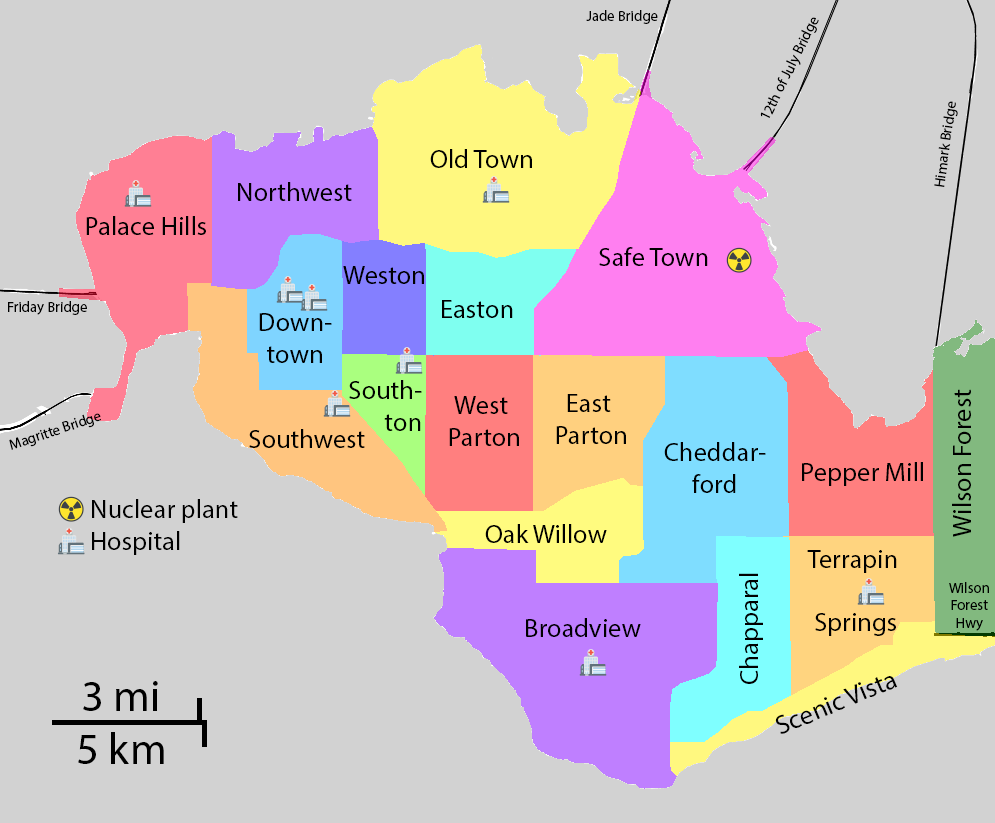

Small fraction of background < 1.00 cpm 
Artiicial Source (medical equipment) = 1.20 cpm 
Normal background from natural source < 40.0-60.0 cpm 
Safe < 150 cpm 
Max dose of uranium miner < 200 cpm 
Low cancer risk > 500.3 cpm 
 Occupational regulation = 1000.68 cpm 
 Risk of cancer increases by 5% = 100 mSv 



In [58]:
# Create the figure
fig = px.imshow(image)

# Add the red lines on the image (if needed)
fig.add_trace(go.Scatter(x=[x1, x2], y=[y1, y2], line=dict(color="red", width=2), showlegend=False))
fig.add_trace(go.Scatter(x=[x2, x3], y=[y2, y3], line=dict(color="red", width=2), showlegend=False))
fig.add_trace(go.Scatter(x=[x3, x4], y=[y3, y4], line=dict(color="red", width=2), showlegend=False))
fig.add_trace(go.Scatter(x=[x4, x1], y=[y4, y1], line=dict(color="red", width=2), showlegend=False))

# Create a list to store the top mean values and their corresponding coordinates
top_mean_values = []

# Iterate through the top_grouped_means DataFrame and extract the top 5 highest mean values
top_grouped_means = grouped_means.nlargest(5, 'Value')
for _, group_row in top_grouped_means.iterrows():
    if group_row['Value'] > 40:  # Filter only mean values higher than 40
        top_mean_values.append((group_row['Value'], group_row['x_cut'], group_row['y_cut']))

# Plot the highest mean values as red dots
for _, group_row in top_grouped_means.iterrows():
    if group_row['Value'] > 40:  # Filter only mean values higher than 40
        x_center = x_min + (group_row['x_cut'] + 0.5) * x_cut_width
        y_center = y_min + (group_row['y_cut'] + 0.5) * y_cut_height

        text = f"Top Mean Value: {group_row['Value']:.2f}"

        fig.add_trace(go.Scatter(x=[x_center], y=[y_center], 
                                 mode='markers', 
                                 marker=dict(color='red', size=10),
                                 text=text, hoverinfo='text',
                                 showlegend=False)  # don't show this trace in the legend
                      )


# Calculate the mean radiation value for each static sensor
mean_radiation_per_static_sensor = stationary_sensor_data.groupby('Sensor-id')['Value'].mean().reset_index()
mean_radiation_per_static_sensor.rename(columns={'Value': 'Mean Radiation'}, inplace=True)

# Merge the mean radiation values with the stationary sensor locations
stationary_sensor_location_with_mean = stationary_sensor_location.merge(mean_radiation_per_static_sensor, on='Sensor-id', how='left')

# Create the hover text for static sensor locations including mean radiation
static_hover_text = stationary_sensor_location_with_mean.apply(
    lambda row: f"Static Sensor-id: {row['Sensor-id']}<br>Lat: {row['Lat']}<br>Long: {row['Long']}<br>Mean Radiation: {row['Mean Radiation']:.2f} cpm",
    axis=1
)

# Add the static sensor locations as black dots with hover text
fig.add_trace(go.Scatter(
    x=stationary_sensor_location_with_mean['x'],
    y=stationary_sensor_location_with_mean['y'],
    mode='markers',
    marker=dict(symbol='star', color='black', size=10),
    text=static_hover_text,
    hoverinfo='text',
    showlegend=False
))
# Update the layout to add a color bar
fig.update_layout(
    xaxis_showgrid=False, yaxis_showgrid=False, 
    xaxis_zeroline=False, yaxis_zeroline=False,
    xaxis_showticklabels=False, yaxis_showticklabels=False,
    width=900, height=700,
    legend=dict(title_text='', orientation='h', yanchor='bottom', y=1.02, xanchor='right', x=1),
    coloraxis_colorbar=dict(
        title='Value',
        x=1.05,  # Adjust the x position of the color bar
        len=0.6   # Adjust the length of the color bar
    )
)

# Show the plot
fig.show()

#fig.write_image('avg_readings_by_area2.png')

print("Small fraction of background < 1.00 cpm \n"
      "Artiicial Source (medical equipment) = 1.20 cpm \n"
      "Normal background from natural source < 40.0-60.0 cpm \n"
      "Safe < 150 cpm \n"
      "Max dose of uranium miner < 200 cpm \n"
      "Low cancer risk > 500.3 cpm \n"
      " Occupational regulation = 1000.68 cpm \n"
      " Risk of cancer increases by 5% = 100 mSv \n"
      "")


In [59]:
modified_stationary_sensor_data.head()

,Timestamp,Sensor-id,Value,Units,Lat,Long
0,4/6/2020 0:00,015,11.926,cpm,0.16849,-119.79033
1,4/6/2020 0:00,06,14.816,cpm,0.12180,-119.90430
2,4/6/2020 0:00,01,17.055,cpm,0.15689,-119.95940
3,4/6/2020 0:00,012,16.787,cpm,0.20764,-119.81556
4,4/6/2020 0:00,013,15.009,cpm,0.15979,-119.80715


## Statistical Analysis

### ANNOVA (comparing avg readings of same-sensor values to one another over entire timelapse)

### Static Sensor Data

In [60]:
# Check for NA values in the static_df DataFrame
na_values = static_df.isna().sum()

# Print the count of NA values for each column
print("NA Values in static_df:")
print(na_values)


NA Values in static_df:
Timestamp            0
Sensor-id            0
Value                0
Units                0
Date                 0
LogScaledValue       0
Hours_since_start    0
Rounded_Hours        0
dtype: int64


In [61]:
# Set the threshold value to identify spikes
threshold = 2.7  # find the lowest valued warmup spike

# Get unique sensor IDs and sort them
unique_sensor_ids = sorted(static_df['Sensor-id'].unique())

# Group by 'Sensor-id' and 'Rounded_Hours' to calculate the average radiation levels on each day for each sensor
average_hourly_values = static_df.groupby(['Sensor-id', 'Rounded_Hours'])['LogScaledValue'].mean()

# Iterate through each sensor ID and print out the average radiation levels on each day
for sensor_id in unique_sensor_ids:
    sensor_average_data = average_hourly_values[sensor_id]
    print(f"Sensor {sensor_id} Average Hourly Radiation Levels:")
    print(sensor_average_data)
    print("\n")



Sensor 1 Average Hourly Radiation Levels:
Rounded_Hours
0.0      1.161338
1.0      1.165273
2.0      1.160312
3.0      1.155587
4.0      1.157377
           ...   
116.0    1.191998
117.0    1.182638
118.0    1.194683
119.0    1.179670
120.0    1.193939
Name: LogScaledValue, Length: 121, dtype: float64


Sensor 4 Average Hourly Radiation Levels:
Rounded_Hours
0.0      1.156791
1.0      1.161000
2.0      1.158427
3.0      1.161848
4.0      1.161783
           ...   
116.0    1.190999
117.0    1.204097
118.0    1.176690
119.0    1.182950
120.0    1.179535
Name: LogScaledValue, Length: 121, dtype: float64


Sensor 6 Average Hourly Radiation Levels:
Rounded_Hours
0.0      1.167538
1.0      1.160296
2.0      1.160429
3.0      1.157880
4.0      1.162279
           ...   
116.0    1.183600
117.0    1.192516
118.0    1.195640
119.0    1.190782
120.0    1.198921
Name: LogScaledValue, Length: 121, dtype: float64


Sensor 9 Average Hourly Radiation Levels:
Rounded_Hours
0.0      1.154589
1.0     

In [62]:
# Create a dictionary to store data for each sensor
sensor_data_dict = {}

# Get unique sensor IDs and sort them
unique_sensor_ids = sorted(static_df['Sensor-id'].unique())

# Iterate through each sensor ID and store data in the dictionary
for sensor_id in unique_sensor_ids:
    sensor_data = static_df[static_df['Sensor-id'] == sensor_id]
    sensor_data_dict[sensor_id] = sensor_data['LogScaledValue']

# Perform ANOVA test
anova_results = f_oneway(*sensor_data_dict.values())

# Print the ANOVA results
print("ANOVA Results:")
print("F-statistic:", anova_results.statistic)
print("p-value:", anova_results.pvalue)

# Check if the p-value is below the significance level (e.g., 0.05) to determine if there are 
# significant differences
if anova_results.pvalue < 0.05:
    print("There are significant differences in mean radiation values between sensors.")
    print()
    # Perform Tukey HSD test for pairwise comparisons
    tukey_results = pairwise_tukeyhsd(static_df['LogScaledValue'], static_df['Sensor-id'])
    
    # Summarize the Tukey HSD test results as a DataFrame
    tukey_summary = pd.DataFrame(data=tukey_results._results_table.data[1:], columns=tukey_results._results_table.data[0])
    
    # Filter and display only the rows where 'reject' is True
    true_pairs = tukey_summary[tukey_summary['reject'] == True]
    print("Pairs with 'True' in the 'reject' column:")
    print(true_pairs)
else:
    print("There are no significant differences in mean radiation values between sensors.")


ANOVA Results:
F-statistic: 4448.791198583066
p-value: 0.0
There are significant differences in mean radiation values between sensors.

Pairs with 'True' in the 'reject' column:
    group1  group2  meandiff   p-adj   lower   upper  reject
0        1       4   -0.0021  0.0004 -0.0036 -0.0006    True
2        1       9    0.0445  0.0000  0.0430  0.0459    True
3        1      11    0.0157  0.0000  0.0142  0.0171    True
4        1      12    0.0583  0.0000  0.0569  0.0598    True
5        1      13    0.0058  0.0000  0.0043  0.0073    True
6        1      14   -0.0019  0.0025 -0.0034 -0.0004    True
7        1      15   -0.0034  0.0000 -0.0051 -0.0017    True
8        4       6    0.0027  0.0000  0.0012  0.0042    True
9        4       9    0.0466  0.0000  0.0451  0.0480    True
10       4      11    0.0178  0.0000  0.0163  0.0192    True
11       4      12    0.0604  0.0000  0.0590  0.0619    True
12       4      13    0.0079  0.0000  0.0064  0.0093    True
15       6       9    0.0439 

### Mobile Sensor Data

In [63]:
# Set the threshold value to identify spikes
threshold = 2.7  # find the lowest valued warmup spike

# Get unique mobile sensor IDs and sort them
unique_mobile_sensor_ids = sorted(mobile_df['Sensor-id'].unique())

# Group by 'Sensor-id' and 'Rounded_Hours' to calculate the average radiation levels on each day for each sensor
average_hourly_values = mobile_df.groupby(['Sensor-id', 'Rounded_Hours'])['LogScaledValue'].mean()

# Iterate through each mobile sensor ID and print out the average radiation levels on each day
for sensor_id in unique_mobile_sensor_ids:
    sensor_average_data = average_hourly_values[sensor_id]
    print(f"Mobile Sensor {sensor_id} Average Hourly Radiation Levels:")
    print(sensor_average_data)
    print("\n")


Mobile Sensor 1 Average Hourly Radiation Levels:
Rounded_Hours
12.0     1.479735
13.0     1.470779
14.0     1.483419
17.0     1.445075
18.0     1.458239
32.0     1.476130
33.0     1.454098
41.0     1.400759
42.0     1.395845
56.0     1.532208
57.0     1.542236
64.0     1.560767
65.0     1.560767
66.0     1.560767
120.0    1.560767
Name: LogScaledValue, dtype: float64


Mobile Sensor 2 Average Hourly Radiation Levels:
Rounded_Hours
8.0      1.358174
17.0     1.394878
18.0     1.404566
20.0     1.430948
31.0     1.465274
32.0     1.460050
41.0     1.499736
55.0     1.549844
56.0     1.541618
58.0     1.561940
59.0     1.559475
70.0     1.584256
81.0     1.619101
92.0     1.669115
93.0     1.684664
94.0     1.672872
104.0    1.704884
115.0    1.731536
116.0    1.725176
120.0    2.893423
Name: LogScaledValue, dtype: float64


Mobile Sensor 3 Average Hourly Radiation Levels:
Rounded_Hours
7.0      1.340558
16.0     1.337532
37.0     1.326426
38.0     1.321079
40.0     1.356475
54.0     1.34

In [64]:
# Create a dictionary to store data for each sensor
sensor_data_dict = {}

# Get unique sensor IDs and sort them
unique_sensor_ids = sorted(mobile_df['Sensor-id'].unique())

# Iterate through each sensor ID and store data in the dictionary
for sensor_id in unique_sensor_ids:
    sensor_data = mobile_df[mobile_df['Sensor-id'] == sensor_id]
    sensor_data_dict[sensor_id] = sensor_data['LogScaledValue']

# Perform ANOVA test
anova_results = f_oneway(*sensor_data_dict.values())

# Print the ANOVA results
print("ANOVA Results:")
print("F-statistic:", anova_results.statistic)
print("p-value:", anova_results.pvalue)

# Check if the p-value is below the significance level (e.g., 0.05) to determine if there are 
# significant differences
if anova_results.pvalue < 0.05:
    print("There are significant differences in mean radiation values between sensors.")
    print()
    # Perform Tukey HSD test for pairwise comparisons
    tukey_results = pairwise_tukeyhsd(mobile_df['LogScaledValue'], mobile_df['Sensor-id'])
    
    # Summarize the Tukey HSD test results as a DataFrame
    tukey_summary = pd.DataFrame(data=tukey_results._results_table.data[1:], columns=tukey_results._results_table.data[0])
    
    # Filter and display only the rows where 'reject' is True
    true_pairs = tukey_summary[tukey_summary['reject'] == True]
    print("Pairs with 'True' in the 'reject' column:")
    print(true_pairs)
else:
    print("There are no significant differences in mean radiation values between sensors.")

ANOVA Results:
F-statistic: 4213.404007741735
p-value: 0.0
There are significant differences in mean radiation values between sensors.

Pairs with 'True' in the 'reject' column:
      group1  group2  meandiff  p-adj   lower   upper  reject
0          1       2    0.0639   -0.0  0.0469  0.0810    True
1          1       3   -0.2225   -0.0 -0.2473 -0.1978    True
2          1       4   -0.2999   -0.0 -0.3227 -0.2770    True
3          1       5   -0.2331   -0.0 -0.2508 -0.2154    True
4          1       6   -0.2362   -0.0 -0.2573 -0.2151    True
...      ...     ...       ...    ...     ...     ...     ...
1219      47      48    0.0298    0.0  0.0146  0.0451    True
1220      47      49    0.0311    0.0  0.0128  0.0495    True
1221      47      50   -0.0301    0.0 -0.0463 -0.0139    True
1223      48      50   -0.0599   -0.0 -0.0768 -0.0429    True
1224      49      50   -0.0612   -0.0 -0.0810 -0.0414    True

[1143 rows x 7 columns]


### Combined Sensor Data

In [65]:
# Perform ANOVA for static sensors
static_values = static_df['Value']
mobile_values = mobile_df['Value']

# Perform the ANOVA test
anova_results = f_oneway(static_values, mobile_values)

# Perform Tukey's HSD test
all_values = pd.concat([static_values, mobile_values])
all_groups = ['Static'] * len(static_values) + ['Mobile'] * len(mobile_values)

multi_comp = MultiComparison(all_values, all_groups)
tukey_results = multi_comp.tukeyhsd()

# Display Tukey's HSD results
print("Tukey's HSD Results:")
print(tukey_results)

# Interpret the results
significantly_different_groups = tukey_results.reject
different_groups_indices = significantly_different_groups.nonzero()[0]

print("\nGroups with Significantly Different Means:")
for i in different_groups_indices:
    group_pair = tukey_results.groupsunique[i]
    print(group_pair)

Tukey's HSD Results:
 Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj  lower    upper   reject
-----------------------------------------------------
Mobile Static -16.6085  -0.0 -16.9357 -16.2812   True
-----------------------------------------------------

Groups with Significantly Different Means:
Mobile


### ANNOVA (comparing avg readings of sensor to self, Before and After Earthquake)

### Static Sensor Data

In [66]:
cutoff_hour = 40

# Split the data into before and after the cutoff hour for static data
before_cutoff_static = static_df[static_df['Hours_since_start'] < cutoff_hour]
after_cutoff_static = static_df[static_df['Hours_since_start'] >= cutoff_hour]

# Get unique sensor IDs and sort them
unique_sensor_ids = sorted(static_df['Sensor-id'].unique())

# Perform t-test for each sensor and calculate average readings before and after
for sensor_id in unique_sensor_ids:
    sensor_before = before_cutoff_static[before_cutoff_static['Sensor-id'] == sensor_id]['LogScaledValue']
    sensor_after = after_cutoff_static[after_cutoff_static['Sensor-id'] == sensor_id]['LogScaledValue']
    
    t_statistic, p_value = ttest_ind(sensor_before, sensor_after)
    
    print(f"Sensor {sensor_id} t-test Results:")
    print("t-statistic:", t_statistic)
    print("p-value:", p_value)
    
    alpha = 0.05
    if p_value < alpha:
        print("Reject the null hypothesis: Means before & after cutoff hour are significantly different.")
    else:
        print("Fail to reject the null hypothesis: Means before & after cutoff hour are NOT significantly different.")
    
    avg_before = sensor_before.mean()
    avg_after = sensor_after.mean()
    print(f"Average reading before cutoff: {avg_before:.2f}")
    print(f"Average reading after cutoff: {avg_after:.2f}")
    
    print()


#Observation(s):
# Notice that all of the sensors have a significantly higher mean radiation value before and after 
#  the designated cutoff hour


Sensor 1 t-test Results:
t-statistic: -19.047668002533815
p-value: 1.0064582858158075e-80
Reject the null hypothesis: Means before & after cutoff hour are significantly different.
Average reading before cutoff: 1.16
Average reading after cutoff: 1.17

Sensor 4 t-test Results:
t-statistic: -12.21303183280222
p-value: 2.826656046657639e-34
Reject the null hypothesis: Means before & after cutoff hour are significantly different.
Average reading before cutoff: 1.16
Average reading after cutoff: 1.17

Sensor 6 t-test Results:
t-statistic: -19.490362113548407
p-value: 2.0142582652741587e-84
Reject the null hypothesis: Means before & after cutoff hour are significantly different.
Average reading before cutoff: 1.16
Average reading after cutoff: 1.17

Sensor 9 t-test Results:
t-statistic: -97.40787001567988
p-value: 0.0
Reject the null hypothesis: Means before & after cutoff hour are significantly different.
Average reading before cutoff: 1.16
Average reading after cutoff: 1.24

Sensor 11 t-te

### Mobile Sensor Data

In [67]:
cutoff_hour = 40

# Split the data into before and after the cutoff hour
before_cutoff = mobile_df[mobile_df['Hours_since_start'] < cutoff_hour]
after_cutoff = mobile_df[mobile_df['Hours_since_start'] >= cutoff_hour]

# Get unique sensor IDs and sort them
unique_sensor_ids = sorted(mobile_df['Sensor-id'].unique())

# Perform t-test for each sensor and calculate average readings before and after
for sensor_id in unique_sensor_ids:
    sensor_before = before_cutoff[before_cutoff['Sensor-id'] == sensor_id]['LogScaledValue']
    sensor_after = after_cutoff[after_cutoff['Sensor-id'] == sensor_id]['LogScaledValue']
    
    t_statistic, p_value = ttest_ind(sensor_before, sensor_after)
    
    alpha = 0.05
    if p_value < alpha:
        print(f"Sensor {sensor_id} t-test Results:")
        print("t-statistic:", t_statistic)
        print("p-value:", p_value)
        print("Reject the null hypothesis: Means before & after cutoff hour are significantly different.")
        avg_before = sensor_before.mean()
        avg_after = sensor_after.mean()
        print(f"Average reading before cutoff: {avg_before:.2f}")
        print(f"Average reading after cutoff: {avg_after:.2f}")
        print()


#Observation(s):
# Take a look at the paths each sensor took to determine whether or not the car was contaminated or 
#  drove through a contaminated zone.


Sensor 1 t-test Results:
t-statistic: -11.76389613295919
p-value: 2.697630900203885e-31
Reject the null hypothesis: Means before & after cutoff hour are significantly different.
Average reading before cutoff: 1.47
Average reading after cutoff: 1.50

Sensor 2 t-test Results:
t-statistic: -60.10720240066181
p-value: 0.0
Reject the null hypothesis: Means before & after cutoff hour are significantly different.
Average reading before cutoff: 1.41
Average reading after cutoff: 1.62

Sensor 3 t-test Results:
t-statistic: 7.921774741653591
p-value: 5.082963716345665e-15
Reject the null hypothesis: Means before & after cutoff hour are significantly different.
Average reading before cutoff: 1.33
Average reading after cutoff: 1.23

Sensor 4 t-test Results:
t-statistic: -4.0123501926938685
p-value: 6.287839864781223e-05
Reject the null hypothesis: Means before & after cutoff hour are significantly different.
Average reading before cutoff: 1.16
Average reading after cutoff: 1.20

Sensor 5 t-test Re

## Data Transformation for Model Construction

The necessary transformations have already been completed by this point in the code

### Static Sensor Data


Anderson-Darling Test Results:
Statistic: 6676.604305897257
Critical Values: [0.576 0.656 0.787 0.918 1.092]
Significance Levels: [15.  10.   5.   2.5  1. ]


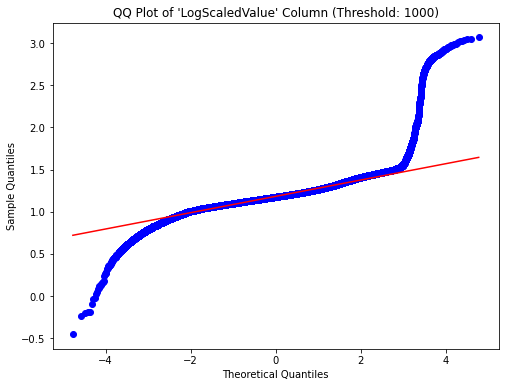

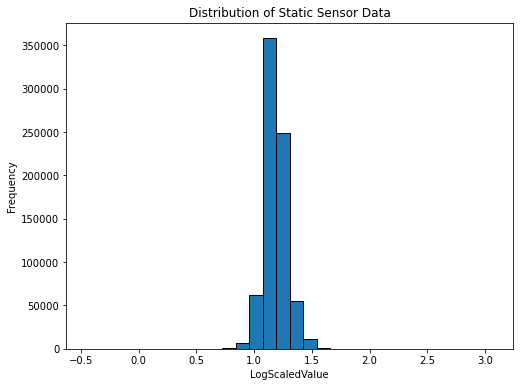

In [68]:
'''Check Normality'''
# Perform Anderson-Darling test for normality
anderson_results = anderson(static_df['LogScaledValue'])
print("\nAnderson-Darling Test Results:")
print("Statistic:", anderson_results.statistic)
print("Critical Values:", anderson_results.critical_values)
print("Significance Levels:", anderson_results.significance_level)

# Set the threshold value
threshold = 1000

# Filter data based on the threshold
filtered_data = static_df[static_df['LogScaledValue'] <= threshold]

# Create a QQ plot for the filtered data
plt.figure(figsize=(8, 6))
stats.probplot(filtered_data['LogScaledValue'], dist="norm", plot=plt)
plt.title(f"QQ Plot of 'LogScaledValue' Column (Threshold: {threshold})")
plt.xlabel("Theoretical Quantiles")
plt.ylabel("Sample Quantiles")
plt.show()

# Filter data based on the y-value threshold of 1000
filtered_data = static_df[static_df['LogScaledValue'] <= 200]

# Plot the histogram
plt.figure(figsize=(8, 6))
plt.hist(filtered_data['LogScaledValue'], bins=30, edgecolor='black')
plt.title('Distribution of Static Sensor Data')
plt.xlabel('LogScaledValue')
plt.ylabel('Frequency')
plt.ylim(0, )
plt.show()


In [69]:
# Merge stationary_sensor_location to include lat and long
static_df2 = static_df.merge(stationary_sensor_location[['Sensor-id', 'Lat', 'Long']], on='Sensor-id', how='left')


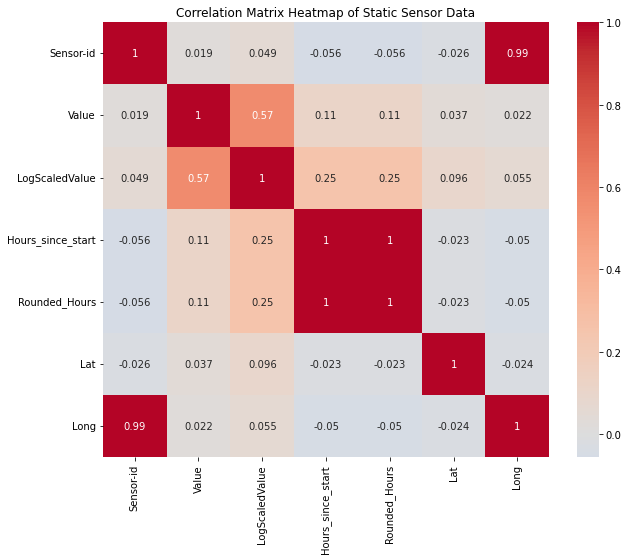

In [70]:
'''Check Multicollinearity'''
# Calculate the correlation matrix
correlation_matrix = static_df2.corr()

# Create a heatmap using Seaborn
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title('Correlation Matrix Heatmap of Static Sensor Data')
plt.show()


Levene's Test Results:
Statistic: 2965.4166460925862
p-value: 0.0
Reject the null hypothesis: Variances are not equal.


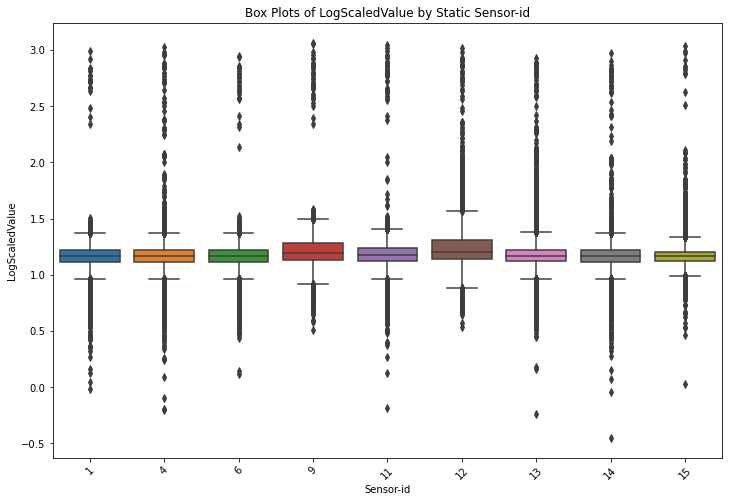

In [71]:
'''Check Homogenaity of Variance'''
# Group by 'Sensor-id' and calculate the variance for each group
variances = filtered_data.groupby('Sensor-id')['LogScaledValue'].var()

# Perform Levene's test
statistic, p_value = levene(*[group['LogScaledValue'] for name, group in filtered_data.groupby('Sensor-id')])

print("Levene's Test Results:")
print("Statistic:", statistic)
print("p-value:", p_value)

# Interpret the results
alpha = 0.05
if p_value < alpha:
    print("Reject the null hypothesis: Variances are not equal.")
else:
    print("Fail to reject the null hypothesis: Variances are equal.")

# Create box plots to visualize the distribution and variance within each group
plt.figure(figsize=(12, 8))
sns.boxplot(x='Sensor-id', y='LogScaledValue', data=filtered_data)
plt.title("Box Plots of LogScaledValue by Static Sensor-id")
plt.xticks(rotation=45)
plt.show()


### Mobile Sensor Data


Anderson-Darling Test Results:
Statistic: 3557.031741427316
Critical Values: [0.576 0.656 0.787 0.918 1.092]
Significance Levels: [15.  10.   5.   2.5  1. ]


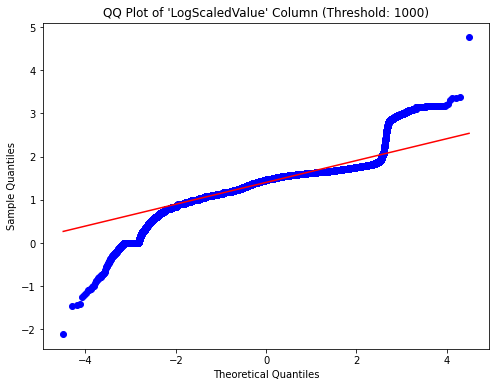

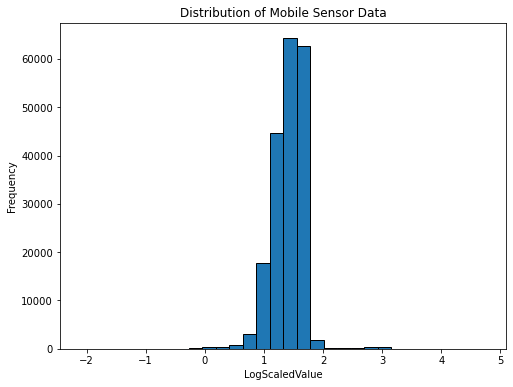

In [72]:
'''Check Normality'''
# Perform Anderson-Darling test for normality
anderson_results = anderson(mobile_df['LogScaledValue'])
print("\nAnderson-Darling Test Results:")
print("Statistic:", anderson_results.statistic)
print("Critical Values:", anderson_results.critical_values)
print("Significance Levels:", anderson_results.significance_level)

# Set the threshold value
threshold = 1000

# Filter data based on the threshold
filtered_data = mobile_df[mobile_df['LogScaledValue'] <= threshold]

# Create a QQ plot for the filtered data
plt.figure(figsize=(8, 6))
stats.probplot(filtered_data['LogScaledValue'], dist="norm", plot=plt)
plt.title(f"QQ Plot of 'LogScaledValue' Column (Threshold: {threshold})")
plt.xlabel("Theoretical Quantiles")
plt.ylabel("Sample Quantiles")
plt.show()

# Filter data based on the y-value threshold of 1000
filtered_data = mobile_df[mobile_df['LogScaledValue'] <= 200]

# Plot the histogram
plt.figure(figsize=(8, 6))
plt.hist(filtered_data['LogScaledValue'], bins=30, edgecolor='black')
plt.title('Distribution of Mobile Sensor Data')
plt.xlabel('LogScaledValue')
plt.ylabel('Frequency')
plt.show()


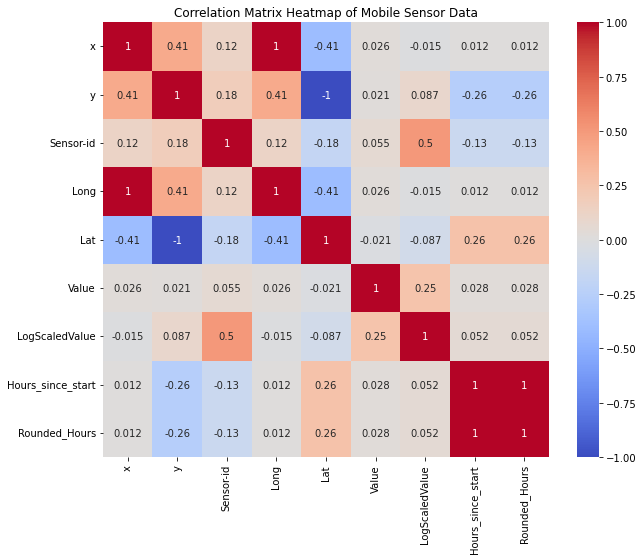

In [73]:
'''Check Multicollinearity'''
# Calculate the correlation matrix
correlation_matrix_mobile = mobile_df.corr()

# Create a heatmap using Seaborn
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix_mobile, annot=True, cmap='coolwarm', center=0)
plt.title('Correlation Matrix Heatmap of Mobile Sensor Data')
plt.show()


Levene's Test Results:
Statistic: 749.9078626966151
p-value: 0.0
Reject the null hypothesis: Variances are not equal.


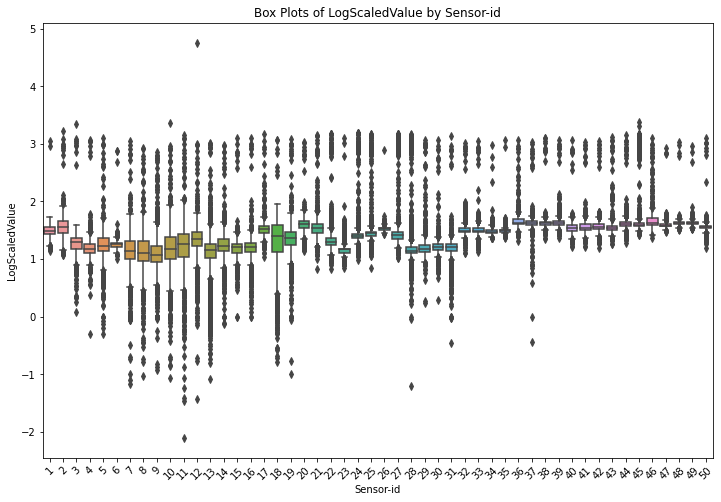

In [74]:
'''Check Homogenaity of Variance'''

# Group by 'Sensor-id' and calculate the variance for each group
variances = filtered_data.groupby('Sensor-id')['LogScaledValue'].var()

# Perform Levene's test
statistic, p_value = levene(*[group['LogScaledValue'] for name, group in filtered_data.groupby('Sensor-id')])

print("Levene's Test Results:")
print("Statistic:", statistic)
print("p-value:", p_value)

# Interpret the results
alpha = 0.05
if p_value < alpha:
    print("Reject the null hypothesis: Variances are not equal.")
else:
    print("Fail to reject the null hypothesis: Variances are equal.")

# Create box plots to visualize the distribution and variance within each group
plt.figure(figsize=(12, 8))
sns.boxplot(x='Sensor-id', y='LogScaledValue', data=filtered_data)
plt.title("Box Plots of LogScaledValue by Sensor-id")
plt.xticks(rotation=45)
plt.show()


## Anomaly Detection using Isolation Forest
This Model is Unsupervised, thus does not need the data to be split into training and testing sets

### Static Sensor Data

In [75]:
from sklearn.ensemble import IsolationForest
'''
Isolation Forest does not require splitting the data into training and test sets as traditional 
supervised learning algorithms do. Isolation Forest is an unsupervised machine learning algorithm 
designed for anomaly detection. 
'''
# Create an empty list to store the results
results = []

# Get unique sensor IDs and sort them
unique_sensor_ids = sorted(static_df['Sensor-id'].unique())

# Create a function to detect anomalies using Isolation Forest
def detect_anomalies(data, contamination=0.05, random_state=42):
    model = IsolationForest(contamination=contamination, random_state=random_state)
    predictions = model.fit_predict(data)
    return predictions

# Perform t-test for each sensor and calculate average readings before and after
for sensor_id in unique_sensor_ids:
    sensor_data = static_df[static_df['Sensor-id'] == sensor_id]['LogScaledValue'].values.reshape(-1, 1)
    
    # Detect anomalies using Isolation Forest
    anomaly_predictions = detect_anomalies(sensor_data)
    
    # Calculate the percentage of points that are anomalies
    num_anomalies = (anomaly_predictions == -1).sum()
    total_points = len(sensor_data)
    percentage_anomalies = (num_anomalies / total_points) * 100
    
    # Append the results to the list
    results.append({'Sensor ID': sensor_id, 'Percentage of Anomalies': percentage_anomalies})


In [76]:
# Create a DataFrame from the results list
isoforest_static_results_df = pd.DataFrame(results)

# Print the results DataFrame
isoforest_static_results_df.head()


,Sensor ID,Percentage of Anomalies
0,1,4.972337
1,4,4.977025
2,6,4.993171
3,9,4.986227
4,11,4.988541


### Mobile Sensor Data

In [77]:
# List to store the results
results = []

# Define a function to detect anomalies using Isolation Forest
def detect_anomalies(data):
    clf = IsolationForest(contamination='auto', random_state=0)
    return clf.fit_predict(data)

# Perform t-test for each sensor and calculate average readings before and after
for sensor_id in unique_mobile_sensor_ids:
    sensor_data = mobile_df[mobile_df['Sensor-id'] == sensor_id]['Value'].values.reshape(-1, 1)
    
    # Detect anomalies using Isolation Forest
    anomaly_predictions = detect_anomalies(sensor_data)
    
    # Calculate the percentage of points that are anomalies
    num_anomalies = (anomaly_predictions == -1).sum()
    total_points = len(sensor_data)
    percentage_anomalies = (num_anomalies / total_points) * 100
    
    # Append the results to the list
    results.append({'Sensor ID': sensor_id, 'Percentage of Anomalies': percentage_anomalies})

# Create a DataFrame from the results list
isoforest_mobile_results_df = pd.DataFrame(results)



In [78]:
# Print the results DataFrame
isoforest_mobile_results_df.head()


,Sensor ID,Percentage of Anomalies
0,1,21.414914
1,2,17.230706
2,3,10.778914
3,4,11.304348
4,5,15.369360


In [79]:
# Check if any row has a percentage of anomalies greater than 30
anomalies_above_threshold = isoforest_mobile_results_df[isoforest_mobile_results_df['Percentage of Anomalies'] > 30]

if not anomalies_above_threshold.empty:
    print("Mobile sensors with percentage of anomalies greater than 30:")
    print(anomalies_above_threshold)
else:
    print("No mobile sensors with percentage of anomalies greater than 30.")


No mobile sensors with percentage of anomalies greater than 30.


### Combined Data

In [75]:
combined_df.head()


,Timestamp,Sensor-id,Long,Lat,Value,Units,x,y,Date,LogScaledValue,Hours_since_start,Rounded_Hours
0,2020-04-06,15,-119.83035,0.14007,0.0,cpm,585.610878,339.827923,2020-04-06,0.0,0.0,0.0
27,2020-04-06,4,-119.93185,0.18734,0.0,cpm,235.245395,176.769851,2020-04-06,0.0,0.0,0.0
28,2020-04-06,34,-119.80541,0.08323,0.0,cpm,671.700682,535.897751,2020-04-06,0.0,0.0,0.0
29,2020-04-06,45,-119.83122,0.06235,0.0,cpm,582.607745,607.923403,2020-04-06,0.0,0.0,0.0
30,2020-04-06,47,-119.87530,0.17400,0.0,cpm,430.449022,222.786240,2020-04-06,0.0,0.0,0.0


In [87]:
# Create an empty list to store the results
results = []

# Get unique sensor IDs and sort them
unique_sensor_ids = sorted(combined_df['Sensor-id'].unique())

# Perform t-test for each sensor and calculate average readings before and after
for sensor_id in unique_sensor_ids:
    sensor_data = combined_df[combined_df['Sensor-id'] == sensor_id]['LogScaledValue'].values.reshape(-1, 1)
    
    # Detect anomalies using Isolation Forest
    model = IsolationForest(contamination=0.05, random_state=42)
    anomaly_predictions = model.fit_predict(sensor_data)
    
    # Calculate the percentage of points that are anomalies
    num_anomalies = (anomaly_predictions == -1).sum()
    total_points = len(sensor_data)
    percentage_anomalies = (num_anomalies / total_points) * 100
    
    # Append the results to the list
    results.append({'Sensor ID': sensor_id, 'Percentage of Anomalies': percentage_anomalies})

# Create a DataFrame from the results list
isoforest_combined_results_df = pd.DataFrame(results)

# Print the results DataFrame
print(isoforest_combined_results_df)



    Sensor ID  Percentage of Anomalies
0           1                 5.000434
1           2                 4.995724
2           3                 4.981825
3           4                 5.000293
4           5                 4.925842
5           6                 4.997578
6           7                 4.980992
7           8                 4.280361
8           9                 4.242577
9          10                 4.925890
10         11                 4.468355
11         12                 4.987669
12         13                 5.000205
13         14                 4.973228
14         15                 4.990120
15         16                 4.959275
16         17                 4.663745
17         18                 5.003442
18         19                 4.996893
19         20                 4.990990
20         21                 4.971103
21         22                 5.000177
22         23                 3.764688
23         24                 4.999571
24         25            